<center>
    <h1> DataLab 4 Notebook </h1>
    <h2> Het klassificeren van Metadata op basis van tekst </h2>
    <img src="link_naar_logo_of_afbeelding" alt="Logo" style="width:200px;height:200px;">
    <h3> Naam van de Auteur </h3>
    <h4> Datum: dd-mm-jjjj </h4>
</center>


---
<div style="background-color:white; text-align:center; vertical-align:middle; padding:50px 0; margin-top:5px; margin-bottom:5px">
    <h2 id="eda-title" style="color:black; font-family: Verdana, sans-serif; font-size: 25px;"><strong> H1: Inleiding </strong></h2>

</ul>

In dit project voor Wikiwijs is ons doel om metadatasuggesties voor het online lesmateriaal van Wikiwijs te ontwikkelen. We willen dat ons model uiteindelijk accurate suggesties gaat geven voor niveau, vak en leerjaar

---
<div style="background-color:white; text-align:center; vertical-align:middle; padding:50px 0; margin-top:5px; margin-bottom:5px">
    <h2 id="eda-title" style="color:black; font-family: Verdana, sans-serif; font-size: 25px;"><strong> H2: Data inzicht </strong></h2>

</ul>

In deze sectie verkennen we de structuur van onze dataset. We richten ons op JSON-bestanden die lesmateriaal bevatten, specifiek op het bestand vmbo1.json in de submap 'Bio'.

In [6]:
# Data handling and manipulation
import os
import json
import re
import pandas as pd
import numpy as np

# Text processing and NLP
import nltk
from nltk.corpus import stopwords
from bs4 import BeautifulSoup
from spellchecker import SpellChecker

# Machine learning and feature extraction
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

# import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Embedding, LSTM, GRU, Dense, Dropout, Flatten
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.optimizers import Adam

# Transformers
from transformers import DistilBertTokenizer, DistilBertForSequenceClassification, Trainer, TrainingArguments
import torch

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

# Other utilities
from collections import Counter

In [7]:
# Lijst van mogelijke directory paths voor alle groepsleden
directory_paths = [
    '/Users/lucao/Downloads/json_files',
    'C:\\Users\\jesse\\Downloads\\s\\json_files',
    'c/users/Sami/json/json_files',
    'C:\\Users\\lid3\\Downloads\\s\\json_files',
    'C:\\Users\\leeuw\\OneDrive - De Haagse Hogeschool\\hhs jaar 2\\datalab 4\\json_files'
]

# Probeer de eerste geldige directory path te vinden
directory_path = None
for path in directory_paths:
    if os.path.exists(path):
        directory_path = path
        break

if directory_path is None:
    print("Geen geldige directory path gevonden. Controleer de paden.")
else:
    print(f"Gebruikt pad: {directory_path}")


Gebruikt pad: C:\Users\leeuw\OneDrive - De Haagse Hogeschool\hhs jaar 2\datalab 4\json_files


In [8]:
# Bestandsnaam van het voorbeeld JSON-bestand
file_name = '75106.json'
file_path = os.path.join(directory_path, file_name)

# Lees het JSON-bestand en print de inhoud om de structuur te begrijpen
try:
    with open(file_path, 'r', encoding='utf-8') as file:
        data = json.load(file)
        print(json.dumps(data, indent=4))  # Print de inhoud met een nette indeling
except Exception as e:
    print(f"Error bij het lezen van bestand {file_name}: {e}")


Error bij het lezen van bestand 75106.json: [Errno 2] No such file or directory: 'C:\\Users\\leeuw\\OneDrive - De Haagse Hogeschool\\hhs jaar 2\\datalab 4\\json_files\\75106.json'


# Json Structuur

**Analyse van vmbo1.json Inhoud**
De JSON-data van vmbo1.json biedt een diepgaand inzicht in het structuur en inhoud van het online lesmateriaal voor het thema "Omgeving" voor vmbo-b12. Hieronder volgt een gedetailleerde analyse van de sleutelcomponenten binnen het bestand:

**Metadata en Auteursinformatie**
Document Auteurs: Het document bevat namen van diverse auteurs, waaronder Pieter Bruring en Sophia Kambakhsh, die bijdragen hebben geleverd aan de inhoud
.

Publicatiedatum: De inhoud is laatst gewijzigd op 25 mei 2023, wat aangeeft dat het materiaal recent is bijgewerkt.


Licentie: Het materiaal valt onder de "CC Naamsvermelding-GelijkDelen 4.0 Internationale licentie", wat betekent dat gebruikers het werk mogen kopiëren, verspreiden, doorgeven, en afgeleide werken mogen maken onder bepaalde voorwaarden.


**Inhoud en Structuur**
Titel: "Thema Omgeving vmbo-b12" geeft duidelijk het onderwerp en het doelpubliek van het lesmateriaal aan.


Beschrijving: Er is een korte inleiding die het thema en de kernonderwerpen beschrijft, zoals levenskenmerken en voedselketens.


Secties: Het document is opgedeeld in verschillende secties, zoals "Intro", "Wat kan ik straks?", en "Wat ga ik doen?", die elk specifieke leerdoelen en activiteiten bevatten. Dit wijst op een gestructureerde benadering om de leerinhoud te presenteren.


**Educatieve Componenten**
Leerdoelen: Voor elke sectie worden specifieke leerdoelen vermeld, zoals het kunnen noemen van negen levenskenmerken en het beschrijven van de begrippen voedselketen en voedselweb.


Opdrachten: Er zijn diverse opdrachten opgenomen met duidelijke instructies en verwachte leeruitkomsten, wat bijdraagt aan een interactieve leerervaring.


Multimedia-inhoud: Het gebruik van afbeeldingen en ingesloten video's verrijkt de tekstuele inhoud en biedt een meer boeiende leerervaring.


**Reflectie en Evaluatie**
Diagnostische toets: Aan het eind van het thema is er een diagnostische toets om de kennis van de leerlingen te evalueren, wat essentieel is voor het beoordelen van het begrip van de leerstof.


Terugkijken: Er is een sectie gewijd aan zelfreflectie, waar leerlingen worden aangemoedigd om na te denken over wat ze hebben geleerd en hoe het proces is verlopen.



We gebruiken BeautifulSoup om HTML-content te verwijderen en reguliere expressies (re) om overbodige spaties te verwijderen. Vervolgens extraheren we de tekst uit elke sectie van onze JSON-bestanden.


In [12]:
def clean_html(raw_html):
    """Functie om HTML-content te verwerken en overbodige spaties te verwijderen."""
    soup = BeautifulSoup(raw_html, "html.parser")
    text = soup.get_text(separator=' ')
    text = re.sub('\s+', ' ', text).strip()
    return text

def extract_text_from_section(section):
    """Functie om inhoud uit secties te halen, inclusief subsecties."""
    text = section.get('heading', {}).get('content', '') + " "
    for item in section.get('items', []):
        text += item.get('content', '') + " "
    for subsection in section.get('sections', []):
        text += extract_text_from_section(subsection)
    return text


We hebben nu de eerste cleaning functies gemaakt, nu gaan we ze testen

In [14]:
def compare_texts(raw_html):
    """Functie om de originele en opgeschoonde tekst naast elkaar te tonen."""
    print("Originele Tekst:")
    print(raw_html)
    print("\nOpgeschoonde Tekst:")
    cleaned_text = clean_html(raw_html)
    print(cleaned_text)

# Voorbeeld HTML-tekst
raw_html_example = "<div>Dit is een <b>voorbeeld</b> tekst met <a href='https://example.com'>een link</a> en wat andere <i>HTML</i> elementen.<br />En een nieuwe regel.</div>"

# Vergelijk de originele met de opgeschoonde tekst
compare_texts(raw_html_example)


Originele Tekst:
<div>Dit is een <b>voorbeeld</b> tekst met <a href='https://example.com'>een link</a> en wat andere <i>HTML</i> elementen.<br />En een nieuwe regel.</div>

Opgeschoonde Tekst:
Dit is een voorbeeld tekst met een link en wat andere HTML elementen. En een nieuwe regel.


### Feedbackpunten en Aanpassingen

Naar aanleiding van de ontvangen feedback hebben we de ETL-pipeline significant verbeterd. Deze verbeteringen richten zich op het vollediger en efficiënter extraheren van informatie uit de HTML- en JSON-bestanden. Hieronder bespreken we de belangrijkste aanpassingen en hoe deze de feedbackpunten adresseren.



####  Gebruik van meer HTML-elementen
Feedback: "Een groot gedeelte van de HTML wordt niet gebruikt. Bijvoorbeeld linkjes, plaatjes, vormgeving wordt gestript."
Aanpassing: Eerder werd alleen de 'content' uit de HTML geëxtraheerd. We hebben de methode `clean_html` verbeterd om naast de tekst nu ook links en afbeeldingen uit de HTML te extraheren. Deze elementen worden nu opgeslagen in aparte lijsten (`self.links` en `self.images`), waardoor de volledige informatie uit de HTML behouden blijft. Naast de basisinformatie (tekst, links, afbeeldingen) hebben we nu ook diverse metadata-elementen toegevoegd aan de extractie. Deze omvatten vakken, leerjaren, niveaus, eindgebruikers, studiebelasting, trefwoorden, en andere relevante metadata. in het data cleaning proces zullen we gaan bepalen welk van deze data relevant is voor het doel van ons project

---
<div style="background-color:white; text-align:center; vertical-align:middle; padding:50px 0; margin-top:5px; margin-bottom:5px">
    <h2 id="eda-title" style="color:black; font-family: Verdana, sans-serif; font-size: 25px;"><strong> H3: ETL Datapipeline voor Tekst-Preprocessing </strong></h2>

</ul>

Hier is nog een volledig overzicht van de gehele pipeline: 

 

 

Initialisatiemethode __init__ 

 Parameter: directory_path (str): Het pad naar de directory met JSON-bestanden. 

 Attributen: directory_path, all_texts, vakken, leerjaren, niveaus: Deze attributen worden geïnitialiseerd om de paden, teksten en metadata op te slaan. 

 

 

 

De ETLPipeline-klasse is aangemaakt om gegevens uit JSON-bestanden te halen, schoon te maken en te organiseren in een DataFrame. We gebruiken verschillende lijsten om verschillende soorten gegevens op te slaan. Hier is een uitleg van elke lijst en waarvoor ze worden gebruikt:  

 

self.all_texts:  

Waarom: Deze lijst slaat alle verwerkte teksten op die uit de JSON-bestanden worden gehaald.  

Waarvoor: Dit is de hoofdinhoud van de bestanden die we willen analyseren, bijvoorbeeld voor tekstmining of inhoudelijke analyses.  

 

self.links:  

Waarom: Bevat alle URL-links die in de tekst gevonden worden. 

Waarvoor: Dit helpt bij het identificeren van verwijzingen, bronnen en aanvullend materialen die in de bestanden worden genoemd.  

 

self.images:  

Waarom: Slaat de URLs van alle afbeeldingen op die in de tekst worden gevonden. 

Waarvoor: Belangrijk voor visuele sanalyse en om te begrijpen welke afbeeldingen in de bestanden worden gebruikt.   

 

self.vakken:  

Waarom: Bevat de namen van vakken die in de metadata van de bestanden zijn aangegeven.  

Waarvoor: Dit helpt bij het categoriseren van de inhoud op basis van vakken, zoals wiskunde, geschiedenis, enz.  

 

Self.leerjaren 

Waarom: Slaat de leerjaren op die in de metadata worden vermeld.  

Waarvoor: Dit helpt om de inhoud te classificeren naar het onderwijsniveau waarvoor het bedoeld is, zoals leerjaar 1, leerjaar 2, etc.  

 

self.niveaus:  

Waarom: Bevat de onderwijsniveaus die in de metadata zijn aangegeven. 

Waarvoor: Niveaus zoals voortgezet onderwijs helpen bij het begrijpen voor welke onderwijslaag de inhoud geschikt is. 

 

self.document_authors:  

Waarom: Slaat de namen van de auteurs van de bestanden op.  

Waarvoor: Dit helpt bij het identificeren van wie de inhoud heeft geschreven en kan nuttig zijn voor het beoordelen van de expertise of reputatie van de auteurs. 

 

self.uuids:  

Waarom: Bevat de unieke identificaties (UUIDs) van de bestanden.  

Waarvoor: Dit helpt bij het uniek identificeren en traceren van elk bestand binnen de dataset.  

 

 

 

self.document_dates: 

Waarom: Slaat de datums op waarop de bestanden zijn geschreven of gepubliceerd. 

Waarvoor: Dit helpt bij het analyseren van de tijdlijn van de bestanden en bij het identificeren van de meest recente of relevante bestanden 

 

self.bulk_ids:  

Waarom: Bevat de bulk IDs van de documenten.  

Waarvoor: Deze kunnen worden gebruikt voor het groeperen en batchverwerking van bestanden.  

 

self.identifiers:  

Waarom: Slaat andere unieke identificaties van de bestanden op, zoals ISBN-nummers of andere relevante codes.  

Waarvoor: Dit helpt bij het verder categoriseren en zoeken van specifieke bestanden.  

 

self.titles:   

Waarom: Bevat de titels van de bestanden.  

Waarvoor: Titels zijn essentieel voor het begrijpen van de inhoud en het doel van elk bestand.  

 

self.descriptions:  

Waarom: Slaat beschrijvingen van de bestanden op.  

Waarvoor: Dit helpt bij het geven van een samenvatting van de inhoud en kan nuttig zijn  voor snel begrip van het bestand. 

 

self.last_modified_dates:  

Waarom: bevat de datums waarop de bestanden voor het laatst zijn gewijzigd. 

Waarvoor: dit helpt bij het bijhouden van de meest recente updates en wijzigingen in de bestanden. 

 

Self.dates_created:  

Waarom: slaat de datums op waarop de bestanden zijn gemaakt. 

Waarvoor: dit is handig bij het analyseren van de oorsprong van de bestanden en kan helpen bij het traceren van de geschiedenis van een bestand. 

 

self.published_flags:  

Waarom: bevat vlaggen die aangeven of de bestanden zijn gepubliceerd. 

Waarvoor: dit helpt bij het onderscheiden van concepten en gepubliceerde bestanden, wat belangrijk kan zijn voor de kwaliteit van de metadata. 

 

self.publishers:   

Waarom: slaat de namen op van de uitgevers. 

Waarvoor: dit is handig voor het begrijpen van wie verantwoordelijk is voor de publicatie van de inhoud. 

 

 

 

 

 

Self.teams:  

Waarom: bevat de namen van de teams die betrokken waren bij het maken van de bestanden. 

Waarvoor: dit kan belangrijk zijn voor het identificeren van de groep mensen die aan een project hebben gewerkt 

 

self.licenses:  

Waarom: Slaat de licentie-informatie van de bestanden op. 

Waarvoor: Dit helpt bij het begrijpen van de gebruiksrechten en beperkingen van de inhoud.  

self.web_addresses:  

Waarom: Bevat de webadressen waar de bestanden beschikbaar zijn.  

Waarvoor: Dit helpt bij het vinden van de bronlocatie van de bestanden en kan nuttig zijn voor verificatie en verdere referentie.  

  

self.eindgebruiker:  

Waarom: Slaat de eindgebruikersrollen op, zoals 'leerlingen' of 'docenten'.  

Waarvoor: Dit helpt bij het begrijpen voor wie de inhoud bedoeld is, wat belangrijk is voor  doelgroepanalyse. 

 

self.studiebelasting:  

Waarom: Bevat informatie over de studiebelasting.  

Waarvoor: Dit geeft aan hoeveel tijd de gebruiker nodig heeft om de inhoud te verwerken, wat belangrijk is voor onderwijsplanning.  

 

self.trefwoorden:  

Waarom: Slaat de trefwoorden op die in de metada ta zijn aangegeven.  

Waarvoor: Dit helpt bij het taggen en zoeken van bestanden, wat belangrijk is voor indexering en snelle toegang tot relevante informatie.  

 

Deze lijsten helpen bij het opslaan van gestructureerde gegevens uit ongestructureerde bronnen. Door de gegevens in lijsten te organiseren, kunnen we ze later makkelijk omzetten in een DataFrame. 

 

 

 

Methode clean_html 

- Doel: HTML-tekst schoonmaken door tags te verwijderen en overtollige spaties te reduceren. 

- Parameters: raw_html (str): De rauwe HTML-tekst die schoongemaakt moet worden. 

- Returns: De schoongemaakte tekst, de links in de tekst en de afbeeldingen. 

 

 

 

 

Methode extract_text_from_section 

Doel: Tekst uit een sectie van een JSON-bestand, inclusief subsecties, extraheren. 

Parameters: section (dict): Een sectie van het JSON-bestand. 

Returns: De geëxtraheerde tekst. 

 

 

Methode extract_text 

Doel: Doorloop de directory en verwerk alle JSON-bestanden om tekst en metadata te extraheren. 

 

 Acties: 

Itereert door alle bestanden in de directory. 

Laadt de JSON-bestanden en extraheert de tekst en metadata. 

Voegt de verwerkte tekst toe aan all_texts. 

 

Methode contains_content_VO 

Doel: Loop door de data en check of VO content in de values staat. Zo worden alleen relevante documenten meegenomen. 

Acties: checked of het document bij VO content hoort, zo niet word deze op False gezet inplaats van True. 

 

 

 

 

 

 

 Methode extract_metadata 

Doel: Metadata zoals vakken, leerjaren en niveaus uit de JSON-data extraheren. 

Parameters: data (dict): De JSON-data waarvan de metadata wordt geëxtraheerd. 

 

Acties: 

Itereert door de metadata en extraheert vakken, leerjaren en niveaus. 

Filtert de vakken op basis van VALID_SUBJECTS. 

Voegt de geëxtraheerde en gesorteerde metadata toe aan de respectievelijke lijsten (vakken, leerjaren, niveaus). 

 

 

 

 

 

7. Methode create_dataframe 

Doel: Een Pandas DataFrame maken met de geëxtraheerde teksten en metadata. 

Returns: Een DataFrame met kolommen voor tekst, vakken, leerjaren en niveaus. 

 

Methode pad_list 

Doel: zorgt ervoor dat de gegeven lijst een gespecificeerde lengte krijgt door lege strings toe te voegen 

Parameters: 

Lst: de gegeven lijst 

Length : de aangegeven lengte 

Returns: originele lijst met extra lege strings tot aan de gegeven limiet (length) 

 

 

Het proces van dataverwerking is een essentiële in ons project, aangezien het ervoor zorgt dat de gegevens in een bruikbaar en analyseerbaar formaat worden omgezet. Door middel van een zorgvuldig ontwikkelde ETL- pipeline hebben we gegevens uit de JSON-bestanden geëxtraheerd, getransformeerd en geladen in een pandas dataframe. Deze grondige voorbereiding maakt het mogelijk voor ons om betrouwbare en nauwkeurige analyses uit te voeren en uiteindelijk goede modellen te maken.  Er zal nu analyses van de geëxtraheerde data plaatsvinden en ook nog de nodige cleaning als dat nodig is. Dit is extreem belangrijk voor de betrouwbaarheid van onze modellen.  

 
 

 

Luca 

In [19]:
class ETLPipeline:
    def __init__(self, directory_path):
        self.directory_path = directory_path
        self.all_texts = []
        self.links = []
        self.images = []
        self.vakken = []
        self.leerjaren = []
        self.niveaus = []
        self.document_authors = []
        self.uuids = []
        self.document_dates = []
        self.bulk_ids = []
        self.identifiers = []
        self.titles = []
        self.descriptions = []
        self.last_modified_dates = []
        self.dates_created = []
        self.published_flags = []
        self.publishers = []
        self.teams = []
        self.licenses = []
        self.web_addresses = []

        self.eindgebruiker = []
        self.studiebelasting = []
        self.trefwoorden = []

    def clean_html(self, raw_html):
        soup = BeautifulSoup(raw_html, "html.parser")
        links = [a['href'] for a in soup.find_all('a', href=True)]
        images = [img['src'] for img in soup.find_all('img', src=True)]
        text = soup.get_text(separator=' ')
        text = re.sub('\s+', ' ', text).strip()
        return text, links, images

    def extract_text_from_section(self, section):
        text = section.get('heading', {}).get('content', '') + " "
        for item in section.get('items', []):
            text += item.get('content', '') + " "
        for subsection in section.get('sections', []):
            text += self.extract_text_from_section(subsection)
        return text

    def extract_text(self):
        file_count = 0  # Initialize file counter
        for subdir, _, files in os.walk(self.directory_path):
            for filename in files:
                if filename.endswith('.json'):
                    file_path = os.path.join(subdir, filename)
                    try:
                        with open(file_path, 'r', encoding='utf-8') as file:
                            data = json.load(file)
                        
                        if self.contains_content_VO(data):
                            raw_text = self.extract_text_from_section(data)
                            processed_text, links, images = self.clean_html(raw_text)
                            print(f"Extracted text from {filename}: {processed_text[:100]}")  # Print first 100 characters for verification
                            self.all_texts.append(processed_text)
                            self.links.append(', '.join(links))
                            self.images.append(', '.join(images))
                            self.extract_metadata(data)
                            
                            file_count += 1  # Increment file counter
                            if file_count >= 7800:  # Check if limit reached
                                print("Reached the limit of 100 files. Stopping processing.")
                                return
                    except Exception as e:
                        print(f"Error processing file {filename}: {e}")

    def contains_content_VO(self, data):
        if isinstance(data, dict):
            for key, value in data.items():
                if key == 'fullName' and isinstance(value, str) and 'content VO-' in value:
                    return True
                elif self.contains_content_VO(value):
                    return True
        elif isinstance(data, list):
            for item in data:
                if self.contains_content_VO(item):
                    return True
        return False

    def extract_metadata(self, data):
        vakken_set = set()
        leerjaren_set = set()
        niveaus_set = set()
        eindgebruiker_set = set()
        studiebelasting_set = set()
        trefwoorden_set = set()

        metadata = data.get('colophon', {}).get('metadata', [])
        if metadata:
            for term in metadata:
                if not isinstance(term, dict):
                    print(f"Issue with metadata entry: {term}")
                    continue

                key = term.get('key')
                terms = term.get('terms')

                if key == 'disciplines':
                    if terms and isinstance(terms, (dict, list)):
                        elements = terms.values() if isinstance(terms, dict) else terms
                        for element in elements:
                            if element:
                                vakken_set.update(map(lambda x: x.strip(), element.split(',')))
                elif key == 'intendedEndUserRole':
                    if terms and isinstance(terms, list):
                        eindgebruiker_set.update(map(lambda x: x.strip(), terms))
                elif key == 'learningTime':
                    if terms and isinstance(terms, list):
                        studiebelasting_set.update(map(lambda x: x.strip(), terms))
                elif key == 'keywords':
                    if terms and isinstance(terms, list):
                        trefwoorden_set.update(map(lambda x: x.strip(), terms))
                elif key == 'educationalLevels':
                    if terms and isinstance(terms, dict):
                        for value in terms.values():
                            if value:
                                leerjaren_set.update(re.findall(r'\b\d+\b', value))
                                levels = map(lambda x: x.strip(), value.split(','))
                                niveaus_set.update(levels)

        self.vakken.append(', '.join(sorted(vakken_set)))
        self.leerjaren.append(', '.join(sorted(leerjaren_set, key=int)))
        self.niveaus.append(', '.join(sorted(niveaus_set)))
        self.eindgebruiker.append(', '.join(sorted(eindgebruiker_set)))
        self.studiebelasting.append(', '.join(sorted(studiebelasting_set)))
        self.trefwoorden.append(', '.join(sorted(trefwoorden_set)))

    # Extract additional metadata
        self.document_authors.append(', '.join(data.get('documentAuthors', [])))
        self.uuids.append(data.get('uuid', ''))
        self.document_dates.append(data.get('documentDate', ''))
        self.bulk_ids.append(data.get('bulkId', ''))
        self.identifiers.append(data.get('identifier', ''))
        self.titles.append(data.get('title', ''))
        self.descriptions.append(data.get('description', ''))
        self.last_modified_dates.append(data.get('lastModifiedDate', ''))
        self.dates_created.append(data.get('dateCreated', ''))
        self.published_flags.append(data.get('published', ''))
        self.publishers.append(data.get('publisher', {}).get('name', ''))
        self.teams.append(data.get('team', {}).get('name', ''))
        self.licenses.append(data.get('metadata', {}).get('license', {}).get('name', ''))
        self.web_addresses.append(data.get('metadata', {}).get('webAddress', ''))


    def create_dataframe(self):
        # Ensure all lists are the same length by appending empty strings where necessary
        max_length = max(len(self.all_texts), len(self.links), len(self.images), len(self.vakken), len(self.leerjaren), 
                         len(self.niveaus), len(self.document_authors), len(self.uuids), len(self.document_dates), 
                         len(self.bulk_ids), len(self.identifiers), len(self.titles), len(self.descriptions), 
                         len(self.last_modified_dates), len(self.dates_created), len(self.published_flags), 
                         len(self.publishers), len(self.teams), len(self.licenses), len(self.web_addresses), 
                        len(self.eindgebruiker), len(self.studiebelasting), 
                         len(self.trefwoorden))

        def pad_list(lst, length):
            return lst + [''] * (length - len(lst))

        self.all_texts = pad_list(self.all_texts, max_length)
        self.links = pad_list(self.links, max_length)
        self.images = pad_list(self.images, max_length)
        self.vakken = pad_list(self.vakken, max_length)
        self.leerjaren = pad_list(self.leerjaren, max_length)
        self.niveaus = pad_list(self.niveaus, max_length)
        self.document_authors = pad_list(self.document_authors, max_length)
        self.uuids = pad_list(self.uuids, max_length)
        self.document_dates = pad_list(self.document_dates, max_length)
        self.bulk_ids = pad_list(self.bulk_ids, max_length)
        self.identifiers = pad_list(self.identifiers, max_length)
        self.titles = pad_list(self.titles, max_length)
        self.descriptions = pad_list(self.descriptions, max_length)
        self.last_modified_dates = pad_list(self.last_modified_dates, max_length)
        self.dates_created = pad_list(self.dates_created, max_length)
        self.published_flags = pad_list(self.published_flags, max_length)
        self.publishers = pad_list(self.publishers, max_length)
        self.teams = pad_list(self.teams, max_length)
        self.licenses = pad_list(self.licenses, max_length)
        self.web_addresses = pad_list(self.web_addresses, max_length)
        self.eindgebruiker = pad_list(self.eindgebruiker, max_length)
        self.studiebelasting = pad_list(self.studiebelasting, max_length)
        self.trefwoorden = pad_list(self.trefwoorden, max_length)

        df = pd.DataFrame({
            'text': self.all_texts, 
            'links': self.links,
            'images': self.images,
            'vakken': self.vakken, 
            'leerjaren': self.leerjaren, 
            'niveaus': self.niveaus,
            'document_authors': self.document_authors,
            'uuid': self.uuids,
            'document_date': self.document_dates,
            'bulk_id': self.bulk_ids,
            'identifier': self.identifiers,
            'title': self.titles,
            'description': self.descriptions,
            'last_modified_date': self.last_modified_dates,
            'date_created': self.dates_created,
            'published': self.published_flags,
            'publisher': self.publishers,
            'team': self.teams,
            'license': self.licenses,
            'web_address': self.web_addresses,
            'eindgebruiker': self.eindgebruiker,
            'studiebelasting': self.studiebelasting,
            'trefwoorden': self.trefwoorden
        })
        return df

ChatGPT-4. Prompt: Create Python ETL Pipeline, 2024 https://chatgpt.com/share/9145a89d-0e0c-4208-a1af-168efd1476ff

Niet vergeten dat hier een file_count in zit, die stopt na 100.

In [21]:
if directory_path is not None:
    pipeline = ETLPipeline(directory_path)
    pipeline.extract_text()
    dataframe = pipeline.create_dataframe()
    print(dataframe.head())
else:
    print("Geen geldige directory path gevonden. Controleer de paden.")


Extracted text from 100024.json: Fotosynthese Intro Mensen moeten ademhalen om het hele lichaam van zuurstof te voorzien. In de lucht
Error processing file 100024.json: 'NoneType' object has no attribute 'get'
Extracted text from 100037.json: De Opstand Vooraf Rond 1550 bestond Nederland nog niet. Het gebied waar nu Nederland is, was onderde
Error processing file 100037.json: 'NoneType' object has no attribute 'get'
Extracted text from 100051.json: Plaattektoniek Vooraf In deze opdracht kijk je naar de opbouw van de aarde. Onder je voeten, in het 
Error processing file 100051.json: 'NoneType' object has no attribute 'get'
Extracted text from 100105.json: Hoofdstuk 5 Planten Inleiding Planten en dieren bestaan uit cellen. Maar er zijn duidelijke verschil
Error processing file 100105.json: 'NoneType' object has no attribute 'get'
Extracted text from 100106.json: Hoofdstuk 5 Planten Inleiding Planten en dieren bestaan uit cellen. Maar er zijn duidelijke verschil
Error processing file 1001

C:\Users\leeuw\AppData\Local\Temp\ipykernel_25900\787179962.py:30: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  soup = BeautifulSoup(raw_html, "html.parser")


Extracted text from 168012.json: Module Formuleren Inleiding Niet alleen als je spreekt, maar ook als je schrijft, probeer je je zinn
Error processing file 168012.json: 'NoneType' object has no attribute 'get'
Extracted text from 168111.json: Land- en tuinbouw Intro Nederland is één van de grootste exportlanden van Europa als het gaat om lan
Error processing file 168111.json: 'NoneType' object has no attribute 'get'
Extracted text from 168181.json: Het weer Wat ga je leren? Leerdoelen Aan het eind van deze opdracht kun je: de volgende kenmerken va
Error processing file 168181.json: 'NoneType' object has no attribute 'get'
Extracted text from 168182.json: Waterzuivering Inleiding Ik ben John Snow en ben in 1813 geboren in York, in Engeland. Ik ben een Br
Error processing file 168182.json: 'NoneType' object has no attribute 'get'
Extracted text from 168332.json: Hoe stierf Ötzi? Intro Ötzi is de naam van een beroemde mummie. Het lijk van deze prehistorische jag
Error processing file 1683

In [22]:
pd.set_option('display.max_columns', None)
dataframe.head()

,text,links,images,vakken,leerjaren,niveaus,document_authors,uuid,document_date,bulk_id,identifier,title,description,last_modified_date,date_created,published,publisher,team,license,web_address,eindgebruiker,studiebelasting,trefwoorden
0,Fotosynthese Intro Mensen moeten ademhalen om ...,http://www.schooltv.nl/video/groenten-eten-van...,https://maken.wikiwijs.nl/userfiles/e/edc25200...,"Biologie, Groei en ontwikkeling, Instandhoudin...","1, 2","1, 2, VMBO gemengde leerweg, VMBO kaderberoeps...","content VO-, Christine Vos",None,2022-07-27T15:25:32Z,bulk-17041135-refresh_all,100024,Fotosynthese vmbo-kgt12,,2022-07-27T15:25:32+02:00,2017-04-12T12:53:26+02:00,True,VO-content,VO-content - Gereedschapskist,CC Naamsvermelding-GelijkDelen 3.0 Nederland l...,https://maken.wikiwijs.nl/100655/,leerling/student,3 uur en 0 minuten,"leerlijn, rearrangeerbare"
1,De Opstand Vooraf Rond 1550 bestond Nederland ...,https://maken.wikiwijs.nl/92672,https://maken.wikiwijs.nl/bestanden/519171/Voo...,,,,"content VO-, Tim Bijpost",None,2018-07-10T10:37:41Z,bulk-17041135-refresh_all,100037,De opstand,,2018-07-10T10:37:41+02:00,2017-04-12T16:44:27+02:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100698/,leerling/student,,
2,Plaattektoniek Vooraf In deze opdracht kijk je...,https://drive.google.com/file/d/1F5ZbggMyJcIuy...,https://maken.wikiwijs.nl/userfiles/8/8ba978ea...,"Aardrijkskunde, Endogene processen, Relaties t...","1, 2","HAVO 1, HAVO 2, VWO 1, VWO 2","content VO-, Auteur Kunskapsskolan, Leontine d...",None,2023-11-07T09:01:56Z,bulk-17041135-refresh_all,100051,Plaattektoniek hv123,Bij het samenstellen van deze leerbron is gebr...,2023-11-07T09:01:56+01:00,2017-04-13T11:08:18+02:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100699/,leerling/student,2 uur en 0 minuten,
3,Hoofdstuk 5 Planten Inleiding Planten en diere...,"http://maken.wikiwijs.nl/86812, http://www.lvo...",https://maken.wikiwijs.nl/bestanden/342048/int...,,,,"content VO-, karine vreugdenhil, Margje Jansen",None,2018-06-19T12:58:36Z,bulk-17041135-refresh_all,100105,HV1 Hoofdstuk 5 Planten,,2018-06-19T12:58:36+02:00,2017-04-14T14:40:06+02:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100701/,leerling/student,,
4,Hoofdstuk 5 Planten Inleiding Planten en diere...,"http://maken.wikiwijs.nl/86812, http://www.lvo...",https://maken.wikiwijs.nl/bestanden/342048/int...,,,,"content VO-, karine vreugdenhil",None,2018-06-19T13:02:21Z,bulk-17041135-refresh_all,100106,VWO 1 Hoofdstuk 5 Panten,,2018-06-19T13:02:21+02:00,2017-04-14T14:53:57+02:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100702/,leerling/student,,


In [23]:
empty_vakken_rows = dataframe[dataframe['vakken'] == '']
empty_vakken_rows.head(10)



,text,links,images,vakken,leerjaren,niveaus,document_authors,uuid,document_date,bulk_id,identifier,title,description,last_modified_date,date_created,published,publisher,team,license,web_address,eindgebruiker,studiebelasting,trefwoorden
1,De Opstand Vooraf Rond 1550 bestond Nederland ...,https://maken.wikiwijs.nl/92672,https://maken.wikiwijs.nl/bestanden/519171/Voo...,,,,"content VO-, Tim Bijpost",None,2018-07-10T10:37:41Z,bulk-17041135-refresh_all,100037,De opstand,,2018-07-10T10:37:41+02:00,2017-04-12T16:44:27+02:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100698/,leerling/student,,
3,Hoofdstuk 5 Planten Inleiding Planten en diere...,"http://maken.wikiwijs.nl/86812, http://www.lvo...",https://maken.wikiwijs.nl/bestanden/342048/int...,,,,"content VO-, karine vreugdenhil, Margje Jansen",None,2018-06-19T12:58:36Z,bulk-17041135-refresh_all,100105,HV1 Hoofdstuk 5 Planten,,2018-06-19T12:58:36+02:00,2017-04-14T14:40:06+02:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100701/,leerling/student,,
4,Hoofdstuk 5 Planten Inleiding Planten en diere...,"http://maken.wikiwijs.nl/86812, http://www.lvo...",https://maken.wikiwijs.nl/bestanden/342048/int...,,,,"content VO-, karine vreugdenhil",None,2018-06-19T13:02:21Z,bulk-17041135-refresh_all,100106,VWO 1 Hoofdstuk 5 Panten,,2018-06-19T13:02:21+02:00,2017-04-14T14:53:57+02:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100702/,leerling/student,,
5,Aardbevingen Vooraf Hoe ontstaat een aardbevin...,https://schooltv.nl/item/aardbevingen-in-groni...,https://maken.wikiwijs.nl/userfiles/9/9d580128...,,,,"content VO-, Daphne Streekstra",None,2019-07-08T10:18:35Z,bulk-17041135-refresh_all,100291,Aardbevingen,,2019-07-08T10:18:35+02:00,2017-04-19T13:26:11+02:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100703/,leerling/student,,
7,A Inleiding Vooraf HTML is een taal die gebrui...,"http://notepad-plus-plus.org/., https://maken....",https://maken.wikiwijs.nl/bestanden/555637/A_I...,,,,"content VO-, Frans Peeters",None,2019-07-09T08:05:07Z,bulk-17041135-refresh_all,100308,HTML5 - hv,,2019-07-09T08:05:07+02:00,2017-04-19T14:31:05+02:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100705/,leerling/student,,"leerlijn, rearrangeerbare"
8,Introductie Mensen in verschillende maten Mens...,,https://maken.wikiwijs.nl/userfiles/8/894fc955...,,,,"content VO-, Auteur Kunskapsskolan",None,2017-12-11T14:14:34Z,bulk-17041135-refresh_all,100510,Kijken en luisteren: beeldtaal,Bij het samenstellen van deze leerbron is gebr...,2017-12-11T14:14:34+01:00,2017-04-22T19:59:42+02:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100706/,leerling/student,,
11,A...B...C... Artikel schrijven Een artikel is ...,http://www.reisgidsdigitaalleermateriaal.org/w...,https://maken.wikiwijs.nl/userfiles/8/846345d4...,,,,"Kennisnet LleG, content VO-",None,2019-05-10T11:34:19Z,bulk-17041135-refresh_all,100655,Activerende werkvormen,Een overzicht van werkvormen voor leerlingen. ...,2019-05-10T11:34:19+02:00,2017-04-27T17:11:35+02:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100709/,leerling/student,,
61,Inkomensbronnen Aan het eind van deze opdracht...,http://www.studioeconomie.nl/KB1/les1120B/inde...,https://maken.wikiwijs.nl/bestanden/501208/EC_...,,,,"content VO-, Auteur Kunskapsskolan",None,2018-07-19T09:20:46Z,bulk-17041135-refresh_all,100875,leertaak 1: inkomen,Bij het samenstellen van deze leerbron is gebr...,2018-07-19T09:20:46+02:00,2017-05-03T11:40:24+02:00,True,VO-content,VO-content - Kennisbanken,CC Naamsvermelding-Gel

# LinkChecker

we gaan eerst kijken naar hoeveel van de jsons links bevatten. als maar een heel klein percentage van de jsons links bevat is het waarschijnlijk al niet handig om links mee te nemen om naar te kijken voor de modellen. dat doen we met de code heironder

In [26]:
# import os
# import json
# import re

# class LinkChecker:
#     def __init__(self, directory_path):
#         self.directory_path = directory_path
#         self.total_files = 0
#         self.files_with_links = 0

#     def extract_links_from_section(self, section):
#         links = []
#         for item in section.get('items', []):
#             if 'content' in item:
#                 links.extend(re.findall(r'(https?://\S+)', item['content']))
#         for subsection in section.get('sections', []):
#             sub_links = self.extract_links_from_section(subsection)
#             links.extend(sub_links)
#         return links

#     def check_links_in_files(self):
#         for subdir, _, files in os.walk(self.directory_path):
#             for filename in files:
#                 if filename.endswith('.json'):
#                     self.total_files += 1
#                     file_path = os.path.join(subdir, filename)
#                     try:
#                         with open(file_path, 'r', encoding='utf-8') as file:
#                             data = json.load(file)
#                         links = self.extract_links_from_section(data)
#                         if links:
#                             self.files_with_links += 1
#                     except Exception as e:
#                         print(f"Error processing file {filename}: {e}")

#     def calculate_percentage(self):
#         if self.total_files == 0:
#             return 0
#         return (self.files_with_links / self.total_files) * 100

# if directory_path is not None:
#     checker = LinkChecker(directory_path)
#     checker.check_links_in_files()
#     percentage = checker.calculate_percentage()
#     print(f"Percentage van JSON-bestanden met links: {percentage:.2f}%")
# else:
#     print("Geen geldige directory path gevonden. Controleer de paden.")


zoals te zien is heeft bijna 70% van de jsons een link erin. we gaan dus ook kijken of we die kunnen gebruiken

# ImageChecker

in sommige lessen staan ook afbeeldingen. daarom zullen we nu ook gaan kijken hoeveel van alle jsons afbeeldingn bevatten

In [30]:
# import os
# import json
# import re
# from bs4 import BeautifulSoup

# class ImageChecker:
#     def __init__(self, directory_path):
#         self.directory_path = directory_path
#         self.total_files = 0
#         self.files_with_images = 0

#     def clean_html(self, raw_html):
#         soup = BeautifulSoup(raw_html, "html.parser")
#         return soup

#     def extract_images_from_section(self, section):
#         images = []
#         text = section.get('heading', {}).get('content', '') + " "
#         for item in section.get('items', []):
#             item_text = item.get('content', '') + " "
#             item_soup = self.clean_html(item_text)
#             images.extend([img['src'] for img in item_soup.find_all('img', src=True)])
#         for subsection in section.get('sections', []):
#             sub_images = self.extract_images_from_section(subsection)
#             images.extend(sub_images)
#         return images

#     def check_images_in_files(self):
#         for subdir, _, files in os.walk(self.directory_path):
#             for filename in files:
#                 if filename.endswith('.json'):
#                     self.total_files += 1
#                     file_path = os.path.join(subdir, filename)
#                     try:
#                         with open(file_path, 'r', encoding='utf-8') as file:
#                             data = json.load(file)
#                         images = self.extract_images_from_section(data)
#                         if images:
#                             self.files_with_images += 1
#                     except Exception as e:
#                         print(f"Error processing file {filename}: {e}")

#     def calculate_percentage(self):
#         if self.total_files == 0:
#             return 0
#         return (self.files_with_images / self.total_files) * 100

# if directory_path is not None:
#     checker = ImageChecker(directory_path)
#     checker.check_images_in_files()
#     percentage = checker.calculate_percentage()
#     print(f"Percentage van JSON-bestanden met afbeeldingen: {percentage:.2f}%")
# else:
#     print("Geen geldige directory path gevonden. Controleer de paden.")


In [31]:
dataframe

,text,links,images,vakken,leerjaren,niveaus,document_authors,uuid,document_date,bulk_id,identifier,title,description,last_modified_date,date_created,published,publisher,team,license,web_address,eindgebruiker,studiebelasting,trefwoorden
0,Fotosynthese Intro Mensen moeten ademhalen om ...,http://www.schooltv.nl/video/groenten-eten-van...,https://maken.wikiwijs.nl/userfiles/e/edc25200...,"Biologie, Groei en ontwikkeling, Instandhoudin...","1, 2","1, 2, VMBO gemengde leerweg, VMBO kaderberoeps...","content VO-, Christine Vos",None,2022-07-27T15:25:32Z,bulk-17041135-refresh_all,100024,Fotosynthese vmbo-kgt12,,2022-07-27T15:25:32+02:00,2017-04-12T12:53:26+02:00,True,VO-content,VO-content - Gereedschapskist,CC Naamsvermelding-GelijkDelen 3.0 Nederland l...,https://maken.wikiwijs.nl/100655/,leerling/student,3 uur en 0 minuten,"leerlijn, rearrangeerbare"
1,De Opstand Vooraf Rond 1550 bestond Nederland ...,https://maken.wikiwijs.nl/92672,https://maken.wikiwijs.nl/bestanden/519171/Voo...,,,,"content VO-, Tim Bijpost",None,2018-07-10T10:37:41Z,bulk-17041135-refresh_all,100037,De opstand,,2018-07-10T10:37:41+02:00,2017-04-12T16:44:27+02:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100698/,leerling/student,,
2,Plaattektoniek Vooraf In deze opdracht kijk je...,https://drive.google.com/file/d/1F5ZbggMyJcIuy...,https://maken.wikiwijs.nl/userfiles/8/8ba978ea...,"Aardrijkskunde, Endogene processen, Relaties t...","1, 2","HAVO 1, HAVO 2, VWO 1, VWO 2","content VO-, Auteur Kunskapsskolan, Leontine d...",None,2023-11-07T09:01:56Z,bulk-17041135-refresh_all,100051,Plaattektoniek hv123,Bij het samenstellen van deze leerbron is gebr...,2023-11-07T09:01:56+01:00,2017-04-13T11:08:18+02:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100699/,leerling/student,2 uur en 0 minuten,
3,Hoofdstuk 5 Planten Inleiding Planten en diere...,"http://maken.wikiwijs.nl/86812, http://www.lvo...",https://maken.wikiwijs.nl/bestanden/342048/int...,,,,"content VO-, karine vreugdenhil, Margje Jansen",None,2018-06-19T12:58:36Z,bulk-17041135-refresh_all,100105,HV1 Hoofdstuk 5 Planten,,2018-06-19T12:58:36+02:00,2017-04-14T14:40:06+02:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100701/,leerling/student,,
4,Hoofdstuk 5 Planten Inleiding Planten en diere...,"http://maken.wikiwijs.nl/86812, http://www.lvo...",https://maken.wikiwijs.nl/bestanden/342048/int...,,,,"content VO-, karine vreugdenhil",None,2018-06-19T13:02:21Z,bulk-17041135-refresh_all,100106,VWO 1 Hoofdstuk 5 Panten,,2018-06-19T13:02:21+02:00,2017-04-14T14:53:57+02:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100702/,leerling/student,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7782,Aardrijkskunde h45 De Stercollectie aardrijksk...,"http://www.vo-content.nl/, https://www.vo-cont...",https://maken.wikiwijs.nl/userfiles/d/d38881a7...,Aardrijkskunde,"4, 5","HAVO 4, HAVO 5","StudioVO Leermateriaal, content VO-, Anne Hend...",None,2023-03-02T12:28:46Z,bulk-17041135-refresh_all,99814,Aardrijkskunde h45,"De Stercollecties Aardrijkskunde zijn open, di...",2023-03-02T12:28:46+01:00,2017-04-07T16:50:35+02:00,True,,,,,leerling/student,,"aardrijkskunde, arrangeerbaar, h45, hoofdarran..."
7783,Aardrijkskunde v456 De Stercollectie aardrijks...,"http://www.vo-content.nl/, https://www.vo-cont...",https://maken.wikiwijs.nl/userfiles/d/d38881a7...,Aardrijkskunde,"4, 5, 6","VWO 4, VWO 5, VWO 6","StudioVO Leermateriaal, content VO-, Anne Hend...",None,2023-03-02T12:28:46Z,bulk-17041135-refresh_all,99815,Aardrijkskunde v456,"De Stercollecties Aardrijkskunde zijn open, di...",2023-03-02T12:28:46+01:00,2017-04-07T16:53:20+02:00,True,,,,,leerling/student,,"aardrijkskunde, arrangeerbaar, hoofdarran

---
<div style="background-color:white; text-align:center; vertical-align:middle; padding:50px 0; margin-top:5px; margin-bottom:5px">
    <h2 id="eda-title" style="color:black; font-family: Verdana, sans-serif; font-size: 25px;"><strong> H4: 1st iteration Data exploration </strong></h2>

</ul>

Om te kijken welke kolommen handig zijn om te gebruik voor ons voorspellend model, zoomen wij in op de verschillende variabelen.

In [34]:
#Luca

#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['text'][idx]}\n")


Full text for sample index 4562:
Shoppen in Londen Inleiding Bekijk het volgende filmpje van YouTube. Lijkt het je wat: kerstinkopen doen in zo'n groot warenhuis in hartje Londen? Misschien ben je er al wel eens geweest? Met de beroemde metro van Londen kun je snel naar de mooiste winkelstraten reizen. Kijk maar eens naar de volgende video. Wat kan ik straks? Hier vind je de leerdoelen die horen bij het thema: Shoppen in Londen. Leerdoel Opdracht Je kunt een zakelijke brief schrijven volgens vaste richtlijnen. Schrijven - Zakelijke brief Je kunt het verschil omschrijven tussen formeel en informeel taalgebruik. Schrijven - Zakelijke brief Je kunt zelfstandige naamwoorden aanwijzen in een tekst. Grammatica - Zelfstandig naamwoord Je kunt tegenstellingen herkennen en op correcte wijze gebruiken. Woordenschat - Tegenstellingen Je kunt bepalen wanneer je wel en wanneer je niet een hoofdletter moet gebruiken. Spelling - Hoofdletters Wat ga ik doen? Het thema 'Shoppen in Londen' bestaat uit d

De text kolomn is essentieel om de metadata van een les te voorspellen. Hierin staat de content/inhoud van de les, de links en de plaatjes.

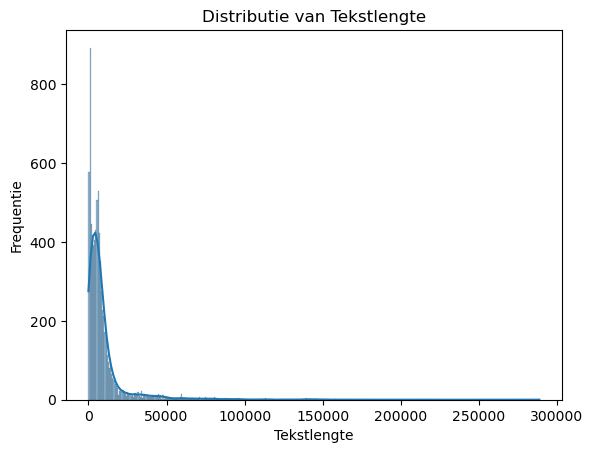

In [36]:
dataframe['text_length'] = dataframe['text'].apply(len)
sns.histplot(dataframe['text_length'], kde=True)
plt.title('Distributie van Tekstlengte')
plt.xlabel('Tekstlengte')
plt.ylabel('Frequentie')
plt.show()

Hier zien we een distribution van tekst lengte. We zien dat de modus rond de 0 ligt, wat betekent dat veel lessen weinig tekst hebben. Wel zien we outliers, een aantal lessen rond de 250000.

In [38]:
# Basisstatistieken van de tekst
dataframe['word_count'] = dataframe['text'].apply(lambda x: len(x.split()))
dataframe['sentence_count'] = dataframe['text'].apply(lambda x: len(nltk.sent_tokenize(x)))
dataframe[['text_length', 'word_count', 'sentence_count']].describe()


,text_length,word_count,sentence_count
count,7787.000000,7787.000000,7787.000000
mean,9516.728522,1532.289585,122.024271
std,15902.697453,2540.857927,193.885834
min,0.000000,0.000000,0.000000
25%,2243.500000,368.000000,28.000000
50%,5620.000000,911.000000,76.000000
75%,9485.000000,1524.500000,122.000000
max,288753.000000,44285.000000,3622.000000


We zien hier verschillende basisstatistieken. Zo zien we dat de gemiddelde word_count 1532 woorden is. De gemiddelde les bevat dus 1532 woorden. Ook zien we een grote outlier bij 44285, dit is een grote les.

In [40]:
from wordcloud import WordCloud

In [41]:
import matplotlib.pyplot as plt

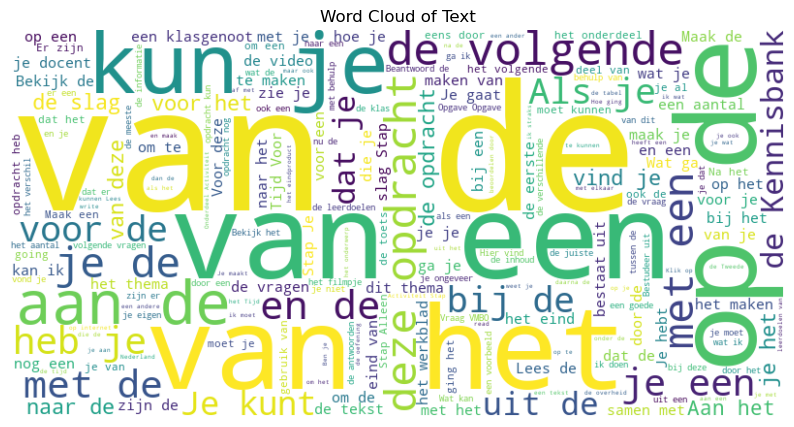

In [42]:
# Join all texts into a single string for word cloud and keyword extraction
all_text = ' '.join(dataframe['text'].astype(str))

# Plotting the word cloud of text
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud of Text')
plt.axis('off')
plt.show()

Hier zien we een wordcloud van alle text. We zien veel lidwoorden die we eruit moeten halen tijdens de Data cleaning.

In [44]:
from sklearn.feature_extraction.text import CountVectorizer

In [45]:
# Veelvoorkomende woorden en n-grammen
import numpy as np
vectorizer = CountVectorizer(stop_words=None, ngram_range=(1, 2))
word_counts = vectorizer.fit_transform(dataframe['text'])
word_counts_sum = np.asarray(word_counts.sum(axis=0)).flatten()
words_freq = list(zip(vectorizer.get_feature_names_out(), word_counts_sum))
words_freq_sorted = sorted(words_freq, key=lambda x: x[1], reverse=True)

# Top 20 meest voorkomende woorden
print("Top 20 meest voorkomende woorden:")
for word, freq in words_freq_sorted[:20]:
    print(f"{word}: {freq}")


Top 20 meest voorkomende woorden:
de: 653228
je: 328619
het: 302601
een: 301256
van: 288323
in: 249084
en: 239222
is: 123410
op: 108992
met: 104795
of: 88589
te: 84126
voor: 82506
van de: 82279
die: 80960
dat: 76807
zijn: 67623
aan: 64989
wat: 61329
in de: 60833


We zien dat er veel lidwoorden worden gegeven. Dit lossen we op bij het hoofdstuk 3 data cleaning.

In [47]:
#Luca

#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['links'][idx]}\n")


Full text for sample index 5206:
https://maken.wikiwijs.nl/194431, https://maken.wikiwijs.nl/194431, http://www.schooltv.nl/video/antoni-van-leeuwenhoek-pionier-van-de-microscopie/#q=Antoni%20van%20Leeuwenhoek%20Pionier%20van%20de%20microscopie, http://www.lvoorl.nl/content/hoe-werk-je-met-de-microscoop-deel-1?embedded, http://www.lvoorl.nl/content/hoe-werk-je-met-de-microscoop-deel-2?embedded

Full text for sample index 3419:
https://maken.wikiwijs.nl/101102#!page-3246128, http://maken.wikiwijs.nl/101102



We zien dat er meerde links staan in de lessen van Wikiwijs. Zo zien we links die ons iets zeggen over de les, bijvoorbeeld Zwangerschap. Ook zien we bij sample 71 een link naar 'www.poezie-leest.nl', dit is waarschijnlijk een nederlands les.

In [49]:
# Function to display full text and links effectively
def display_full_text_and_links(dataframe, sample_size=2):
    sample_indices = dataframe.sample(sample_size).index
    for idx in sample_indices:
        print(f"Full text for sample index {idx}:\n{dataframe['text'][idx]}\n")
        links = dataframe['links'][idx].split(', ')
        print(f"Links for sample index {idx}:")
        for link in links:
            print(link)
        print("\n" + "="*80 + "\n")

display_full_text_and_links(dataframe, sample_size=2)

Full text for sample index 6804:
Pensioenen Intro In 1836 werd in Nederland een begin gemaakt van de opbouw ons pensioenstelsel. Nu hebben we de zekerheid dat we, als we oud zijn en niet meer werken, toch een redelijk inkomen hebben. Of dat zo blijft, is maar de vraag, maar we kunnen ook zelf maatregelen treffen. Veel mensen doen dat al. Bespreek met een klasgenoot op welke manier je zelf maatregelen zou kunnen treffen om na je pensioen een redelijk inkomen te hebben. Wat kan ik straks? Aan het eind van deze opdracht kun je: de drie pijlers van het Nederlandse pensioenstelsel noemen en beschrijven. uitleggen waarom mensen steeds meer in staat zijn om zelf te sparen voor hun ouderdomsvoorziening. omschrijven waarom het steeds belangrijker wordt dat je ook zelf spaart voor je eigen ouderdomsvoorziening. Wat ga ik doen? Activiteiten Aan de slag Stap Activiteit Stap 1 Het Nederlands pensioenstelsel is opgebouwd uit drie pijlers. Hoe dat zit lees je in deze stap. Stap 2 In deze stap leer je

Hier zien we een  beter overzicht van een paar lessen en de bijbehorende links. Bij sample 47 zien we dat het een les is over Land- en tuinbouw. We zien dat er veel interessante links worden gebruikt, zoals: groentefruit.milieucentraal.nl, kokswereld.nl, smulweb.nl. Bijna al deze links zeggen iets over de les. Deze websites bevatten vooral informatie over **Biologische** termen.

Bij sample 9 zien we bij de tekst een les over zwangerschap en als link 1 van het artsennet. Dit kan ons een beter beeld geven bij welk vak de les is. Waarschijnlijk is deze les ook een Biologie les.

In [51]:
#Luca

#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['images'][idx]}\n")


Full text for sample index 467:
https://maken.wikiwijs.nl/userfiles/8/894fc95541fb2547b806065f58c57fa1.jpg, https://maken.wikiwijs.nl/userfiles/8/894fc95541fb2547b806065f58c57fa1.jpg, https://maken.wikiwijs.nl/userfiles/8/894fc95541fb2547b806065f58c57fa1.jpg, https://maken.wikiwijs.nl/userfiles/8/894fc95541fb2547b806065f58c57fa1.jpg, https://maken.wikiwijs.nl/userfiles/8/894fc95541fb2547b806065f58c57fa1.jpg, https://maken.wikiwijs.nl/userfiles/8/894fc95541fb2547b806065f58c57fa1.jpg, https://maken.wikiwijs.nl/userfiles/8/894fc95541fb2547b806065f58c57fa1.jpg, https://maken.wikiwijs.nl/userfiles/8/894fc95541fb2547b806065f58c57fa1.jpg

Full text for sample index 2601:
https://maken.wikiwijs.nl/userfiles/2/221a896c426585ccc63d482db873dea26ad4a61a.png, https://maken.wikiwijs.nl/userfiles/e/e03b1eee11201c24c94ce6061ff0b5b14f01875c.png, https://maken.wikiwijs.nl/userfiles/7/77c15f2babd90e55c7add622922c845e07219b65.png, https://maken.wikiwijs.nl/userfiles/9/9b7fce7835c1bbfb46b5b753b0e807c68cfe9

In [52]:
from IPython.display import display, Image

def display_full_text_and_images(df, sample_size=2, max_images=10):
    sample_indices = dataframe.sample(sample_size).index
    for idx in sample_indices:
        print(f"Full text for sample index {idx}:\n{df['text'][idx]}\n")
        image_links = dataframe['images'][idx].split(', ')
        print(f"Images for sample index {idx}:")
        for i, link in enumerate(image_links[:max_images]):
            print(f"{i + 1}. {link}")
            display(Image(url=link, width=200, height=200))
        if len(image_links) > max_images:
            print(f"... and {len(image_links) - max_images} more images.")
        print("\n" + "="*80 + "\n")

# Call the function to display samples
display_full_text_and_images(dataframe, sample_size=2)


Full text for sample index 5369:
Verteren Intro De spijsvertering is een groot en belangrijk proces in ons lichaam. Het zorgt ervoor dat de voedingsstoffen worden opgenomen in ons lichaam en ons voedsel wordt verwerkt. In de volgende video wordt de spijsvertering van A tot Z uitgelegd. Kijk de video voor je begint aan deze module. Wat kan ik straks? Na deze module kun je: het verschil tussen mechanische en chemische vertering duidelijk maken. de organen van het spijsverteringsstelsel benoemen met hun functies. beschrijven wat een enzym is en aangeven waarvoor enzymen belangrijk zijn. de plekken in het verteringsstelsel benoemen waar verteringssappen worden aangemaakt. de functie van verteringssappen omschrijven. Wat ga ik doen? Aan de slag Stap Activiteit Stap 1 Je bestudeert het Kennisbankitem dat past bij dit onderdeel en test je kennis. Stap 2 Doe het onderzoek 'Invloed van enzymen op gummibeertjes' en schrijf een verslag. Stap 3 Maak een tekening van je lichaam met daarin de organe

2. https://maken.wikiwijs.nl/userfiles/4/40ddbe2932138cd36e428a9e3963053ed9bb130e.png


3. https://maken.wikiwijs.nl/userfiles/89ce5d5f072c652dd3e14d36946380f2da1d78ce.png


4. https://maken.wikiwijs.nl/userfiles/a5b03cfe0fdce043daf69c90560fd525b6cde02f.png


5. https://maken.wikiwijs.nl/userfiles/89ce5d5f072c652dd3e14d36946380f2da1d78ce.png


6. https://maken.wikiwijs.nl/userfiles/89ce5d5f072c652dd3e14d36946380f2da1d78ce.png


7. https://maken.wikiwijs.nl/userfiles/89ce5d5f072c652dd3e14d36946380f2da1d78ce.png


8. https://maken.wikiwijs.nl/userfiles/89ce5d5f072c652dd3e14d36946380f2da1d78ce.png


9. https://maken.wikiwijs.nl/userfiles/8/8cb53dce9b301184138e784f0560d3717607f183.png


10. https://maken.wikiwijs.nl/userfiles/5/5ce5610367e146530115811dd0a02d1071204fca.png


... and 13 more images.


Full text for sample index 2498:
Animals and pets Introduction Welkom bij het tweede thema van Engels. Dit thema gaat over Animals and pets : dieren en huisdieren. Hoe? Je gaat oefenen met schrijven (writing), lezen (reading), luisteren (listening) en spreken (speaking). Wat? Je gaat in het Engels schrijven en praten over (jouw) huisdieren en andere dieren. Je gaat ook luisteren naar mensen die over dieren vertellen. Zij werken met dieren, bijvoorbeeld als dierenarts of als boer. Succes en veel plezier! Getting started Je bent begonnen aan het thema Animals and pets. In het thema vind je verschillende onderdelen om te kijken, te luisteren, te lezen en te doen. Er zijn leesteksten, video's, luisterfragmenten, afbeeldingen en foto's. Er zijn ook verschillende soorten oefeningen. Sommige oefeningen doe je alleen, andere oefeningen doe je in een groep. Aan het eind van oefeningen die je in een groep doet, bespreek je met dezelfde groep de antwoorden. Soms vraag je

2. https://maken.wikiwijs.nl/userfiles/6/6874052a5966b12834d9a58582a4571b59e68064.png


3. https://maken.wikiwijs.nl/userfiles/2/272fad33965873863646321868ea188c68c0e103.png


4. https://maken.wikiwijs.nl/userfiles/1/10a96581dd4338ee03e97af79ec8db055d8d1f47.png


5. https://maken.wikiwijs.nl/userfiles/5/53599232f6a2606893b52c0b8453f23642470a44.png


6. https://maken.wikiwijs.nl/userfiles/6f84f7df559afdca530ec0587a4b4c360cb78cb9.png


7. https://maken.wikiwijs.nl/userfiles/6f84f7df559afdca530ec0587a4b4c360cb78cb9.png


8. https://maken.wikiwijs.nl/userfiles/6f84f7df559afdca530ec0587a4b4c360cb78cb9.png


9. https://maken.wikiwijs.nl/userfiles/6f84f7df559afdca530ec0587a4b4c360cb78cb9.png


10. https://maken.wikiwijs.nl/userfiles/6f84f7df559afdca530ec0587a4b4c360cb78cb9.png


... and 7 more images.




Met deze functie kunnen we bekijken wat voor foto's onze dataset bevat. We zien interessante foto's van verschillende onderwerpen. Zo zien we bij de eerste les sample graphs over de groei van wereldbevolking en hoe afval verwerkt word. Dit zou waarschijnlijk over een Aardrijkskunde les gaan.

Bij de tweede les sample zijn de foto's wat onduidelijker. We zien een plaatje van een zanger, een poort in Berlijn en een concert. Persoonlijk zou ik denken dat het een muziek les is of een geschiedenis les. Echter aan de text te zien is het een Duits les.

Belangrijk om te onthouden dus dat afbeeldingen niet altijd verduidelijking geven over de les, zouden we gaan voorspellen met afbeeldingen moeten we dit onthouden.

In [54]:
#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['vakken'][idx]}\n")

Full text for sample index 3760:
Engels

Full text for sample index 174:
Biologie



C:\Users\leeuw\AppData\Local\Temp\ipykernel_25900\3581763585.py:12: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.
  plt.tight_layout()
C:\Users\leeuw\AppData\Local\Temp\ipykernel_25900\3581763585.py:12: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
C:\Users\leeuw\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


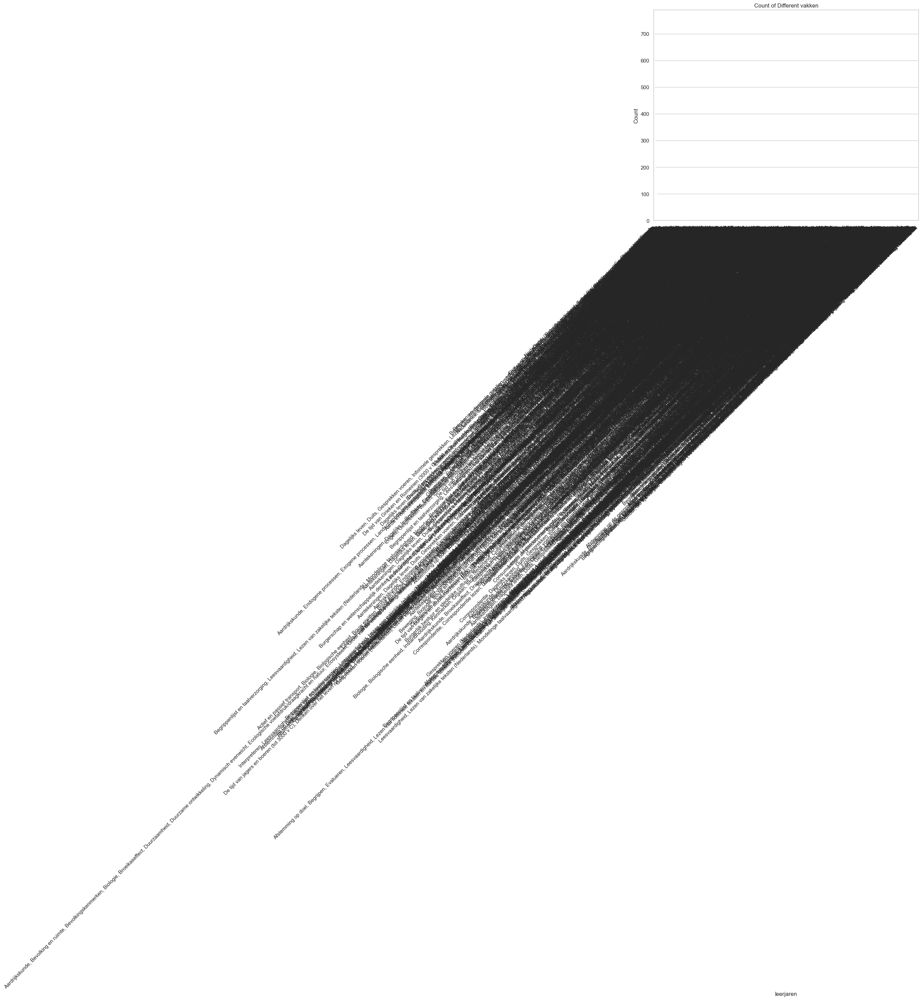

In [55]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style="whitegrid")

plt.figure(figsize=(10, 8))
sns.countplot(data=dataframe, x='vakken', order=dataframe['vakken'].value_counts().index)
plt.xticks(rotation=45, ha='right')
plt.xlabel('leerjaren')
plt.ylabel('Count')
plt.title('Count of Different vakken')
plt.tight_layout()
plt.show()

Bij de vakken, 1 van de variabelen die we moeten voorspellen zien we het volgende. We zien dat er veel meerdere vakken genoemd worden, bijvoorbeeld Literatuur, Schrijven maar ook Gesprekken voeren en Lezen. Deze zijn overbodig voor ons voorspellend model.

Dit laat ook goed zien wat we gevonden hebben in de domeinanalyse. Het probleem dat we tegen kwamen was dat veel docenten niet op een uniforme manier de vakken invulden. Dit is echter niet handig voor ons voorspellend model, en dit moeten we oplossen met code.

In dit deel van onze code lossen we dit probleem nog niet op. Dit doen we later bij het volgende hoofdstuk.

De vakken lijst is erg onoverzichtelijk. Deze moeten we opschonen. Vakken is erg belangrijk aangezien dit 1 van de metadata's is die we moeten voorspellen.

#### analyse leerjaren

we kijken eerst hoe de data in de leerjaren kolom eruit ziet

In [60]:
#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['leerjaren'][idx]}\n")

Full text for sample index 5403:
3, 4

Full text for sample index 6421:
1



In [61]:
# Beschrijf de structuur en inhoud van de kolom
print(dataframe['leerjaren'].describe())


count     7787
unique      20
top           
freq      2266
Name: leerjaren, dtype: object


Analyse van de Resultaten

count: Er zijn 7787 waarden in de 'leerjaren' kolom. Dit geeft aan dat er 7787 lessen in de dataset zijn die leerjaren specificeren.
unique: Er zijn 20 unieke waarden in de 'leerjaren' kolom. Dit betekent dat er 20 verschillende combinaties van leerjaren zijn waarvoor de lessen geschikt zijn.
top: De meest voorkomende waarde in de 'leerjaren' kolom is een lege waarde.
freq: De meest voorkomende waarde komt 2266 keer voor. Dit bevestigt dat de lege waarde het vaakst voorkomt in de dataset.

Deze beschrijvende statistieken helpen ons te begrijpen hoe de leerjaren in de dataset zijn verdeeld en waar mogelijk verdere data cleaning nodig is. Het is bijvoorbeeld belangrijk om de lege waarden nader te onderzoeken en te beslissen hoe deze moeten worden behandeld in het voorspellende model.
model.


In [63]:
missing_count = dataframe['leerjaren'].isnull().sum()
print(f"Number of missing values in 'leerjaren' column: {missing_count}")


Number of missing values in 'leerjaren' column: 0


er zijn dus 2266 missende waardes

We splitsen de leerjaren en converteren ze naar numerieke waarden, waarbij lege waarden worden genegeerd. Vervolgens berekenen we de beschrijvende statistieken om inzicht te krijgen in de verdeling van de leerjaren.


In [66]:
# Analyse van de verdeling van leerjaren
# Splits de leerjaren en converteer naar numerieke waarden, waarbij lege waarden worden genegeerd
all_leerjaren = dataframe['leerjaren'].dropna().astype(str).str.split(', ').explode()

# Verwijder lege strings
all_leerjaren = all_leerjaren[all_leerjaren != '']

# Converteer naar numerieke waarden
all_leerjaren = all_leerjaren.astype(int)

# Beschrijvende statistieken
print(all_leerjaren.describe())


count    11383.000000
mean         2.870509
std          1.423598
min          1.000000
25%          2.000000
50%          3.000000
75%          4.000000
max          6.000000
Name: leerjaren, dtype: float64


Analyse van de Resultaten

Na het opsplitsen en converteren van de leerjaren hebben we de volgende beschrijvende statistieken verkregen:

count: Er zijn 11383 individuele leerjaren vermeld in de dataset na het opsplitsen van de gecombineerde leerjaren.
mean: Het gemiddelde leerjaar is 2.88, wat betekent dat de lessen gemiddeld geschikt zijn voor het derde leerjaar.
std (standaarddeviatie): De standaarddeviatie is 1.42, wat aangeeft hoe de leerjaren verspreid zijn rondom het gemiddelde.
min: Het laagste leerjaar in de dataset is 1.
25%: Het eerste kwartiel is 2, wat betekent dat 25% van de leerjaren 2 of lager is.
50% (median): De mediaan is 3, wat betekent dat 50% van de leerjaren 3 of lager is.
75%: Het derde kwartiel is 4, wat betekent dat 75% van de leerjaren 4 of lager is.
max: Het hoogste leerjaar in de dataset is 6.

Deze statistieken geven ons een duidelijk beeld van de verdeling van de leerjaren in onze dataset. We zien dat de lessen redelijk gelijkmatig verdeeld zijn over de leerjaren 1 tot en met 6, met een gemiddelde rond leerjaar 3.


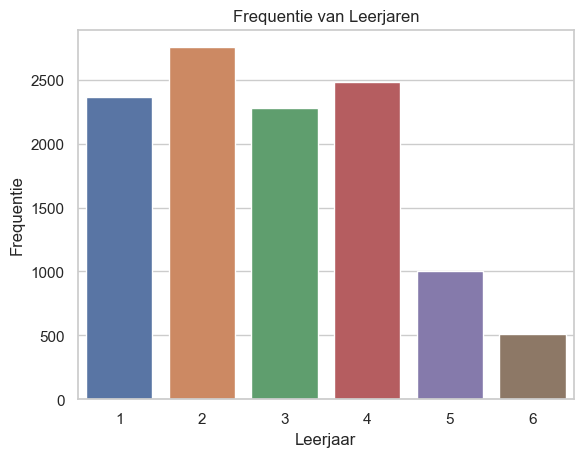

In [68]:
# Frequentie van elk leerjaar inclusief ontbrekende leerjaren
leerjaren_frequentie = all_leerjaren.value_counts().reindex(range(1, 7), fill_value=0)

# Plot de frequentie van elk leerjaar
sns.barplot(x=leerjaren_frequentie.index, y=leerjaren_frequentie.values)
plt.title('Frequentie van Leerjaren')
plt.xlabel('Leerjaar')
plt.ylabel('Frequentie')
plt.show()


Het histogram toont de frequentie van elk leerjaar in de dataset. We zien dat leerjaren 2 en 4 het meest voorkomen, gevolgd door leerjaren 1 en 3. Leerjaar 5 komt minder vaak voor, en leerjaar 6 is het minst vertegenwoordigd.
Deze verdeling laat zien dat de meeste lessen zich richten op de middelste leerjaren (2 tot en met 4), met een afname in aantal voor de hogere leerjaren (5 en 6).

Deze visualisatie geeft ons een duidelijk beeld van hoe de leerjaren in onze dataset zijn verdeeld. Het helpt ons te begrijpen welke leerjaren het meest en het minst vertegenwoordigd zijn, wat nuttige informatie is voor verdere analyses en voor het bouwen van voorspellende modellen. 

#### analyse niveaus

We kijken eerst hoe de data in de 'niveaus' kolom eruit ziet.


In [72]:
#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['niveaus'][idx]}\n")

Full text for sample index 1307:
HAVO 1, HAVO 2, HAVO 3, VWO 1, VWO 2, VWO 3

Full text for sample index 2468:




We hebben de beschrijvende statistieken van de 'niveaus' kolom berekend om een beter inzicht te krijgen in de structuur en inhoud van deze kolom.


In [74]:
# Beschrijf de structuur en inhoud van de kolom
print(dataframe['niveaus'].describe())

count     7787
unique     106
top           
freq      2264
Name: niveaus, dtype: object


Uitleg van de Resultaten

count: Er zijn 7787 waarden in de 'niveaus' kolom. Dit betekent dat er 7787 lessen zijn die specifieke niveaus hebben opgegeven.

unique: Er zijn 106 unieke waarden in de 'niveaus' kolom. Dit betekent dat er 106 verschillende combinaties of individuele niveaus zijn waarvoor de lessen geschikt zijn.

top: De meest voorkomende waarde is een lege waarde. Dit suggereert dat veel lessen geen specifiek niveau hebben opgegeven.

freq: De meest voorkomende waarde komt 2264 keer voor. Dit bevestigt dat de lege waarde het vaakst voorkomt in de dataset.

Deze beschrijvende statistieken helpen ons te begrijpen hoe de niveaus in de dataset zijn verdeeld en waar mogelijk verdere data cleaning nodig is. Het hoge aantal lege waarden kan bijvoorbeeld aangeven dat er veel lessen zijn waarvoor geen specifiek niveau is ingevuld, wat belangrijk kan zijn om op te lossen voor een nauwkeuriger analyse en voorspelling.

In [76]:
import pandas as pd

# lege strings naar NaN verwerken voor verdere verwerking en beter inzicht
empty_strings_count = (dataframe['niveaus'] == '').sum()
print(f"Number of empty strings in 'niveaus' column: {empty_strings_count}")

dataframe['niveaus'].replace('', pd.NA, inplace=True)

missing_count_niveaus = dataframe['niveaus'].isnull().sum()

print(missing_count_niveaus)


Number of empty strings in 'niveaus' column: 2264
2264


We splitsen de niveaus en converteren ze naar numerieke waarden, waarbij lege waarden worden genegeerd. Vervolgens berekenen we de beschrijvende statistieken om inzicht te krijgen in de verdeling van de niveaus.


In [78]:
# Analyse van de verdeling van niveaus
# Splits de niveaus en converteer naar numerieke waarden, waarbij lege waarden worden genegeerd
all_niveaus = dataframe['niveaus'].dropna().astype(str).str.split(', ').explode()

# Verwijder lege strings
all_niveaus = all_niveaus[all_niveaus != '']

# Beschrijvende statistieken
print(all_niveaus.describe())


count                                 21987
unique                                   23
top       VMBO kaderberoepsgerichte leerweg
freq                                   2231
Name: niveaus, dtype: object


Uitleg van de Resultaten

count: Er zijn 21987 individuele niveaus vermeld in de dataset na het opsplitsen van de gecombineerde niveaus. Dit betekent dat de lessen samen 21987 niveauvermeldingen bevatten.

unique: Er zijn 23 unieke niveaus in de dataset. Dit betekent dat er 23 verschillende niveaus of combinaties van niveaus zijn waarvoor de lessen geschikt zijn.

top: Het meest voorkomende niveau is 'VMBO kaderberoepsgerichte leerweg'. Dit suggereert dat dit specifieke niveau het meest wordt vermeld in de dataset.

freq: Het meest voorkomende niveau komt 2231 keer voor. Dit betekent dat 'VMBO kaderberoepsgerichte leerweg' 2231 keer voorkomt in de dataset.

Deze beschrijvende statistieken geven ons een duidelijk beeld van de verdeling van de niveaus in onze dataset. Het hoge aantal vermeldingen van 'VMBO kaderberoepsgerichte leerweg' kan aangeven dat veel lessen specifiek op dit niveau zijn gericht, wat nuttige informatie kan zijn voor verdere analyses en voorspellingen.

We visualiseren de verdeling van de niveaus met een histogram en een kern dichtheidsschatting (KDE) om de spreiding van de niveaus in de dataset beter te begrijpen.


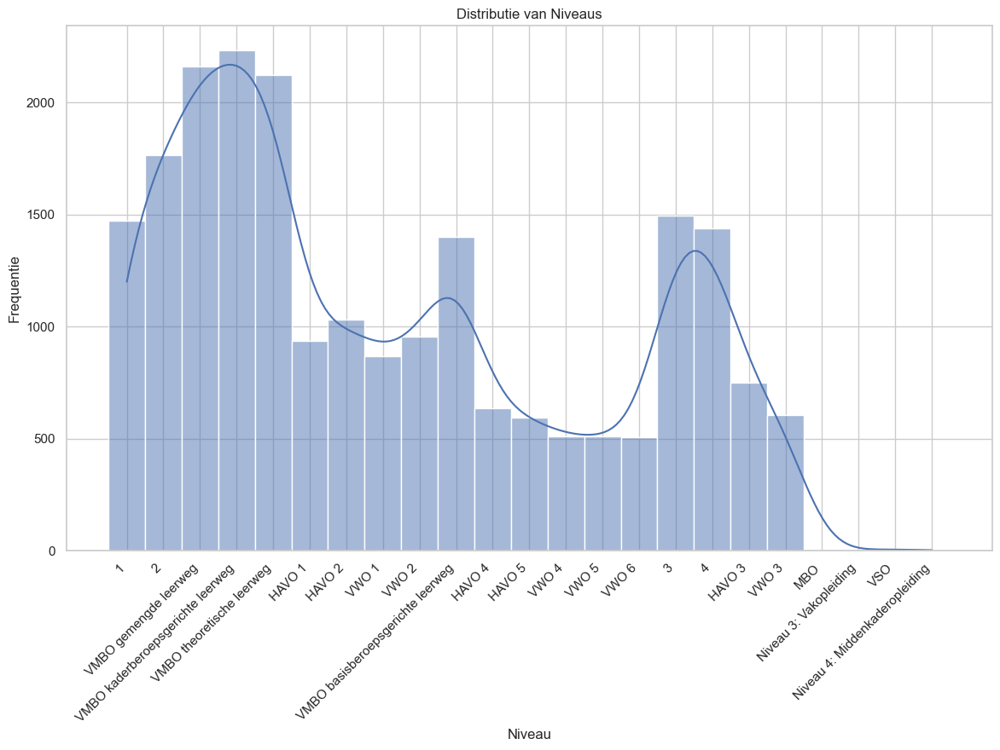

In [81]:
# Verhoog de figuurgrootte
plt.figure(figsize=(14, 8))

# Visualisatie van de verdeling van niveaus
sns.histplot(all_niveaus, kde=True)
plt.title('Distributie van Niveaus')
plt.xlabel('Niveau')
plt.ylabel('Frequentie')

# Roteren van de x-as labels voor betere leesbaarheid
plt.xticks(rotation=45, ha='right')

plt.show()


Interpretatie van de Resultaten

Het histogram toont de frequentie van elk niveau in de dataset. We zien dat 'VMBO kaderberoepsgerichte leerweg' het meest voorkomt, gevolgd door 'VMBO theoretische leerweg' en verschillende HAVO- en VWO-niveaus. De kern dichtheidsschatting (KDE) lijn geeft een vloeiende weergave van de verdeling van de niveaus, wat helpt om de algemene trend in de data beter te visualiseren.

Specifieke bevindingen:

vmbo kaderberoepsgerichte leerweg komt het meest voor, wat aangeeft dat veel lessen zich richten op dit specifieke niveau.
vmbo theoretische leerweg en havo-niveaus zijn ook sterk vertegenwoordigd.
Er is een merkbare afname in frequentie voor de hogere niveaus, zoals vwo 6 en niveau 4: middenkaderopleiding.

Opmerking over Inconsistenties

Bij nadere inspectie van de niveaus valt op dat er enkele inconsistenties zijn, zoals de aanwezigheid van niveaus als 1, 2, 3, 4, en mbo, terwijl we verwachten dat de dataset zich richt op VO-content. Dit suggereert dat er mogelijk fouten of afwijkingen in de dataset zijn die aangepakt moeten worden tijdens de data cleaning.

#### authors analyse

we bekijken eerst hoe de content van de authors kolom eruit ziet

In [85]:
#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['document_authors'][idx]}\n")

Full text for sample index 3132:
content VO-, Sandra Kusters

Full text for sample index 6444:
content VO-



De onderstaande code berekent het aantal keren dat elke auteur voorkomt in de dataset op basis van de 'document_authors' kolom en toont de top 10 auteurs met de hoogste frequentie.

In [87]:
# Aantal keer dat elke auteur voorkomt
author_counts = dataframe['document_authors'].value_counts()

# Toon de top 10 auteurs
print(author_counts.head(10))


content VO-                            1941
content VO-, Froukje Kalma              346
content VO-, Ruth Komdeur               275
content VO-, lobke                      268
Pieter Bruring, content VO-, lobke      210
Pieter Bruring, content VO-, Saskia     204
content VO-, Saskia                     185
content VO-, Anne Hendriksen            157
Linda B, content VO-, Froukje Kalma     155
content VO-, Auteur Kunskapsskolan      140
Name: document_authors, dtype: int64


In [88]:
# Count the number of empty strings in 'document_authors' column
empty_strings_count_authors = (dataframe['document_authors'] == 'content VO-').sum()

# Display the count of empty strings
print(f"Number of empty values in 'document_authors' column: {empty_strings_count_authors}")


Number of empty values in 'document_authors' column: 1941


De uitvoer toont de top 10 auteurs met het aantal documenten waarvoor ze verantwoordelijk zijn:

content VO-: 1941 documenten

Dit geeft aan dat er 1941 documenten zijn waarbij geen specifieke auteur is vermeld, maar alleen een algemene aanduiding 'content VO-'.
content VO-, Froukje Kalma: 346 documenten

Hierbij zijn 346 documenten toegewezen aan Froukje Kalma binnen de 'content VO-' context.
content VO-, Ruth Komdeur: 275 documenten

275 documenten zijn toegewezen aan Ruth Komdeur binnen de 'content VO-' context.
content VO-, lobke: 268 documenten

268 documenten zijn toegewezen aan lobke binnen de 'content VO-' context.
Pieter Bruring, content VO-, lobke: 210 documenten

Pieter Bruring en lobke hebben samen 210 documenten gemaakt binnen de 'content VO-' context.
Pieter Bruring, content VO-, Saskia: 204 documenten

Pieter Bruring en Saskia hebben samen 204 documenten gemaakt binnen de 'content VO-' context.
content VO-, Saskia: 185 documenten

185 documenten zijn toegewezen aan Saskia binnen de 'content VO-' context.
content VO-, Anne Hendriksen: 157 documenten

157 documenten zijn toegewezen aan Anne Hendriksen binnen de 'content VO-' context.
Linda B, content VO-, Froukje Kalma: 155 documenten

Linda B en Froukje Kalma hebben samen 155 documenten gemaakt binnen de 'content VO-' context.
content VO-, Auteur Kunskapsskolan: 140 documenten

140 documenten zijn toegewezen aan de auteur Kunskapsskolan binnen de 'content VO-' context.

De onderstaande code groepeert de dataset op basis van vakgebieden ('vakken') en auteurs ('document_authors'), en toont de top auteurs per vakgebied met het aantal documenten waarvoor ze verantwoordelijk zijn.

In [91]:
# Groepeer de dataset op basis van vakgebieden en auteurs
author_subject_counts = dataframe.groupby(['vakken', 'document_authors']).size().sort_values(ascending=False)

# Toon bijvoorbeeld de top auteurs per vakgebied
print(author_subject_counts.head(10))


vakken                              document_authors                                
Nederlands                          content VO-                                         416
Rekenen/wiskunde                    content VO-                                         314
Biologie                            content VO-                                         231
Engels                              content VO-, Froukje Kalma                          217
Engelse taal en cultuur             content VO-                                         157
Geschiedenis                        content VO-                                         134
Duitse taal en cultuur, Nederlands  content VO-                                          96
Economie                            content VO-                                          93
Engels                              content VO-, Ellemieke Sigtermans, Froukje Kalma     85
                                    content VO-, Leontine de Jong, Froukje Kalma       

De uitvoer toont de top 10 auteurs per vakgebied, samen met het aantal documenten waarvoor ze verantwoordelijk zijn:

Nederlands - content VO-: 416 documenten

Dit betekent dat er 416 documenten zijn in het vakgebied Nederlands waarvoor de algemene aanduiding 'content VO-' wordt gebruikt als auteur.
Rekenen/wiskunde - content VO-: 314 documenten

In het vakgebied Rekenen/wiskunde zijn er 314 documenten waarvoor 'content VO-' als auteur wordt vermeld.
Biologie - content VO-: 231 documenten

Biologie heeft 231 documenten waarvoor 'content VO-' als auteur wordt vermeld.
Engels - content VO-, Froukje Kalma: 217 documenten

Voor Engels zijn er 217 documenten waarvoor Froukje Kalma en 'content VO-' worden vermeld als auteurs.
Engelse taal en cultuur - content VO-: 157 documenten

In het vakgebied Engelse taal en cultuur zijn er 157 documenten waarvoor 'content VO-' als auteur wordt vermeld.
Geschiedenis - content VO-: 134 documenten

Geschiedenis heeft 134 documenten waarvoor 'content VO-' als auteur wordt vermeld.
Duitse taal en cultuur, Nederlands - content VO-: 96 documenten

Voor zowel Duitse taal en cultuur als Nederlands zijn er 96 documenten waarvoor 'content VO-' als auteur wordt vermeld.
Economie - content VO-: 93 documenten

Economie heeft 93 documenten waarvoor 'content VO-' als auteur wordt vermeld.
Engels - content VO-, Ellemieke Sigtermans, Froukje Kalma: 85 documenten

Voor Engels zijn er 85 documenten waarvoor Ellemieke Sigtermans en Froukje Kalma samen met 'content VO-' worden vermeld als auteurs.
Engels - content VO-, Leontine de Jong, Froukje Kalma: 72 documenten

Voor Engels zijn er 72 documenten waarvoor Leontine de Jong, Froukje Kalma en 'content VO-' worden vermeld als auteurs.
Deze uitkomst biedt inzicht in hoe auteurs zijn verdeeld over verschillende vakgebieden in je dataset. Het laat zien welke auteurs het meest bijdragen aan specifieke vakgebieden, wat nuttig kan zijn voor analyse en verdere ontwikkeling van je project.

De eerste code berekent het aantal unieke auteurs in de dataset op basis van de 'document_authors' kolom.
De tweede code groepeert de dataset op basis van vakgebieden ('vakken') en berekent vervolgens het aantal unieke auteurs per vakgebied.

In [94]:
# Aantal unieke auteurs
unique_authors = dataframe['document_authors'].nunique()
print(f"Aantal unieke auteurs: {unique_authors}")

# Variatie in auteursbijdragen per vakgebied
author_subject_variation = dataframe.groupby('vakken')['document_authors'].nunique().sort_values(ascending=False)
print(author_subject_variation.head(10))


Aantal unieke auteurs: 915
vakken
                                                                            252
Biologie                                                                     66
Engels                                                                       60
Rekenen/wiskunde                                                             50
Aardrijkskunde                                                               37
Duits                                                                        35
Mens en maatschappij                                                         32
Duits, Gesprekken voeren, Lezen, Luisteren en kijken, Schrijven, Spreken     31
Biologie, Instandhouding, Instandhouding en ontwikkeling                     27
Informatica                                                                  27
Name: document_authors, dtype: int64


Deze uitvoer toont de top 10 vakgebieden (en eventuele combinaties daarvan) waarin het aantal unieke auteurs het hoogst is. Bijvoorbeeld:

252 auteurs zijn betrokken bij vakken waarvoor geen specifieke naam is vermeld.
Biologie heeft 66 unieke auteurs die hebben bijgedragen aan documenten binnen dit vakgebied.
Engels heeft 60 unieke auteurs die hebben bijgedragen aan documenten binnen dit vakgebied.
Deze informatie geeft inzicht in hoe de auteursbijdragen verdeeld zijn over verschillende vakgebieden in je dataset. Het kan helpen bij verdere analyse en begrip van de verscheidenheid aan auteurs die betrokken zijn bij verschillende onderwerpen.

De onderstaande code groepeert de dataset op basis van vakgebieden ('vakken') en auteurs ('document_authors'), en berekent vervolgens het aantal documenten per combinatie van vakgebied en auteur. De resultaten worden gesorteerd op basis van het aantal documenten in aflopende volgorde.

In [97]:
# Voorbeeld: Top auteurs per onderwerpcategorie
author_topic_counts = dataframe.groupby(['vakken', 'document_authors']).size().sort_values(ascending=False)

# Toon de top auteurs per onderwerpcategorie
print(author_topic_counts)


vakken                   document_authors                                                                   
Nederlands               content VO-                                                                            416
Rekenen/wiskunde         content VO-                                                                            314
Biologie                 content VO-                                                                            231
Engels                   content VO-, Froukje Kalma                                                             217
Engelse taal en cultuur  content VO-                                                                            157
                                                                                                               ... 
Biologie                 Alien Siero, StudioVO Leermateriaal, content VO-, Anne Hendriksen, Leontine de Jong      1
                         Alien Siero, content VO-                              

Deze uitvoer toont een gedetailleerde lijst waarin voor elke combinatie van vakgebied en auteur het aantal documenten wordt weergegeven. Bijvoorbeeld:

Nederlands - content VO-: 416 documenten

Rekenen/wiskunde - content VO-: 314 documenten

Biologie - content VO-: 231 documenten

Engels - content VO-, Froukje Kalma: 217 documenten

Engelse taal en cultuur - content VO-: 157 documenten

Elke regel geeft aan hoe vaak een specifieke auteur heeft bijgedragen aan documenten binnen een bepaald vakgebied. Deze informatie is nuttig voor het begrijpen van de auteursbijdragen en de distributie ervan over verschillende onderwerpcategorieën binnen je dataset.

De onderstaande code groepeert de dataset op basis van leerjaren ('leerjaren') en auteurs ('document_authors'), en berekent vervolgens het aantal documenten per combinatie van leerjaar en auteur. De resultaten worden gesorteerd op basis van het aantal documenten in aflopende volgorde.

In [100]:
# Voorbeeld: Top auteurs per onderwerpcategorie
author_topic_counts = dataframe.groupby(['leerjaren', 'document_authors']).size().sort_values(ascending=False)

# Toon de top auteurs per onderwerpcategorie
print(author_topic_counts)


leerjaren  document_authors                                                            
           content VO-                                                                     1517
1, 2       content VO-, lobke                                                               204
3, 4       content VO-, Froukje Kalma                                                       181
           Pieter Bruring, content VO-, lobke                                               146
4, 5       content VO-                                                                      119
                                                                                           ... 
1, 2       content VO-, C Siebrand                                                            1
           content VO-, Carmen Hemel, Leontine de Jong, Froukje Kalma                         1
           content VO-, Carmen Hemel, Michaëla Westera, Leontine de Jong, Froukje Kalma       1
           content VO-, Christine Vos           

Deze uitvoer geeft een gedetailleerde lijst weer waarin voor elke combinatie van leerjaren en auteur het aantal documenten wordt weergegeven. Bijvoorbeeld:

leerjaren - content VO-: 1517 documenten (voor leerjaren waar geen specifieke auteurs worden vermeld)

1, 2 - content VO-, lobke: 204 documenten (voor leerjaren 1 en 2, waarbij de auteur 'lobke' is)

3, 4 - content VO-, Froukje Kalma: 181 documenten (voor leerjaren 3 en 4, waarbij de auteur 'Froukje Kalma' is)

3, 4 - Pieter Bruring, content VO-, lobke: 146 documenten (voor leerjaren 3 en 4, waarbij de auteurs 'Pieter Bruring' en 'lobke' zijn)

Deze informatie biedt inzicht in hoe auteursbijdragen verdeeld zijn over verschillende leerjaarcategorieën binnen je dataset. Het kan helpen bij het begrijpen van de betrokkenheid van auteurs bij specifieke leerjaren en bij verdere analyse van het materiaal per leerjaar.



De onderstaande code groepeert de dataset op basis van niveaus ('niveaus') en auteurs ('document_authors'), en berekent vervolgens het aantal documenten per combinatie van niveau en auteur. De resultaten worden gesorteerd op basis van het aantal documenten in aflopende volgorde

na deze analyse kunnen we concluderen dat deze kolom waarschijnlijk niet handig is om mee te nemen voor ons model. Hier is een samenvatting van de redenen waarom de 'document_authors'-kolom mogelijk niet ideaal is voor het project:

Veelvoorkomende auteur zonder specifieke namen: De meest voorkomende waarde is 'content VO-', wat suggereert dat een groot deel van het lesmateriaal geen specifieke auteur heeft.

Veel unieke auteurs: Er zijn 915 unieke auteurs geïdentificeerd, wat kan leiden tot inconsistenties en complexiteit bij het modelleren van deze variabele.

Variabiliteit in auteursbijdragen per vakgebied, niveau en onderwerp: De bijdrage van auteurs varieert sterk per vakgebied, niveau en onderwerp, wat kan leiden tot onevenwichtigheden en moeilijkheden bij het leren van consistente patronen.

#### UUID analyse

In [105]:
#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['uuid'][idx]}\n")

Full text for sample index 74:
None

Full text for sample index 7195:
None



In [106]:
# Controleren of alle UUID's uniek zijn
unique_uuids = dataframe['uuid'].nunique()
total_uuids = dataframe['uuid'].count()

print(f"Aantal unieke UUID's: {unique_uuids}")
print(f"Totaal aantal UUID's: {total_uuids}")

# Check of alle UUID's uniek zijn
if unique_uuids == total_uuids:
    print("Alle UUID's zijn uniek.")
else:
    print("Er zijn duplicaten in de UUID's.")


Aantal unieke UUID's: 0
Totaal aantal UUID's: 0
Alle UUID's zijn uniek.


In [107]:
# Controleren op ontbrekende waarden in de 'uuid' kolom
missing_uuids = dataframe['uuid'].isnull().sum()

print(f"Aantal ontbrekende UUID's: {missing_uuids}")


Aantal ontbrekende UUID's: 7787


zoals te zien is deze kolom helemaal leeg

Op basis van de bovenstaande analyse en argumenten is het duidelijk dat de 'uuid' kolom geen enkele nuttige informatie of waarde toevoegt aan het model voor het maken van metadata suggesties voor leerjaar, niveau en vak.

In [110]:
#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['document_date'][idx]}\n")

Full text for sample index 2687:
2022-04-21T11:45:43Z

Full text for sample index 1407:
2023-08-31T16:08:46Z



In [111]:
#Document_date uitleg, Luca
# Convert 'document_date' to datetime if it's not already
dataframe['document_date'] = pd.to_datetime(dataframe['document_date'], errors='coerce')

# Drop rows with NaT values
dataframe = dataframe.dropna(subset=['document_date'])

Document_date is de datum waarop de bestanden zijn geschreven of gepubliceerd. Dit helpt bij het analyseren van de tijdlijn van de bestanden en bij het identificeren van de meest recente of relevante bestanden.

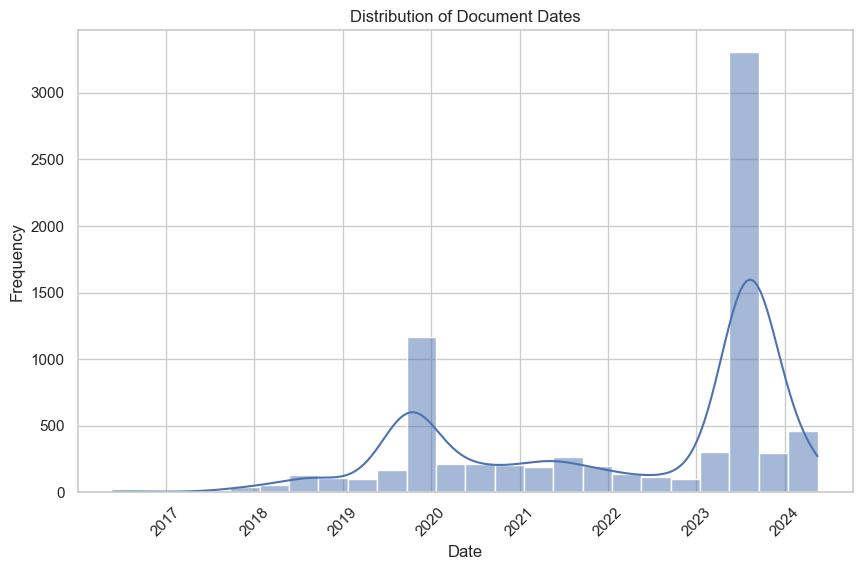

In [113]:
plt.figure(figsize=(10, 6))
sns.histplot(dataframe['document_date'], kde=True)
plt.title('Distribution of Document Dates')
plt.xlabel('Date')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

Hier zien we een distributie van document dates, gevisualiseerd in een histogram. We zien dat de document date een piek heeft in midden 2023. Dit is het moment waar de meeste lessen werden gepubliceerd op Wikiwijs. Ook een kleinere piek zien we op 2020.

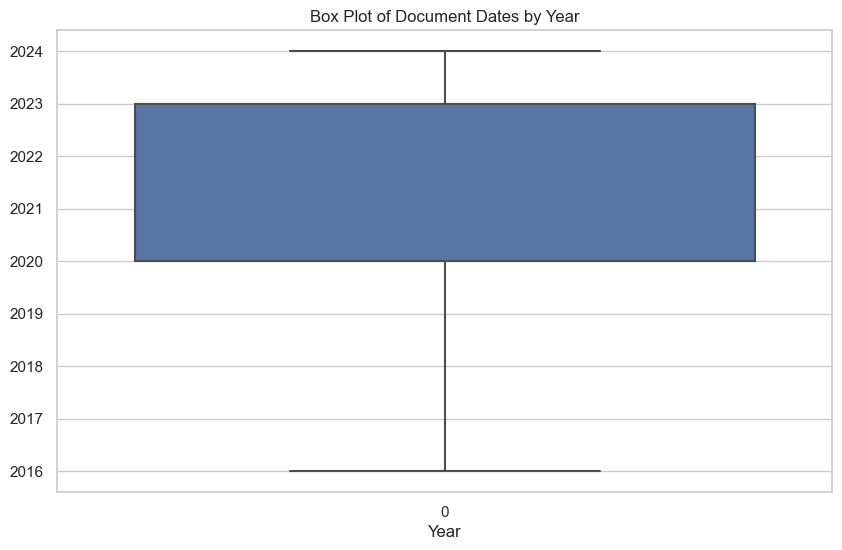

In [115]:
# Plotting the box plot
plt.figure(figsize=(10, 6))
sns.boxplot(dataframe['document_date'].dt.year)
plt.title('Box Plot of Document Dates by Year')
plt.xlabel('Year')
plt.show()

Hier zien we een boxplot verdeling van de document dates per jaar. We zien dat het gemiddelde ligt rond 2022, en er outliers zijn rond 2016 wanneer het platform begon.

In [117]:
#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['identifier'][idx]}\n")

Full text for sample index 5827:
74521

Full text for sample index 3518:
157662



In [118]:
#Identifier uitleg


De identifier zegt ons iets over hoe de les is opgeslagen. Is de identifier 92418? Dan is bevat de Wikiwijs link dit cijfer. Dit zegt ons verder niets over de metadata, en heeft geen betekenis in onze dataset.

In [120]:
#title, Luca

In [121]:
#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['title'][idx]}\n")

Full text for sample index 5327:
Module: Herman en Klazien 13 - v456

Full text for sample index 7280:
Sterke werkwoorden - Voltooid tegenwoordige tijd



Hierboven twee voorbeelden van titels. We zien dat er vaak een thema wordt gegeven, bijvoorbeeld: 'Vulkanen' en 'Diergedrag'. Dit is echter niet bij alle titels zo. Ook wordt er in ons voorbeeld het niveau gegeven, en het leerjaar. De titel is essentieel voor het voorspellen van de metadata.

Bij het invullen van de les worden docenten gevraagd om een titel mee te geven. Dit lijkt handig voor het voorspellend model.

In [124]:
# Drop NaN values in the 'title' column
dataframe = dataframe.dropna(subset=['title'])

# Plotting the word cloud
text = ' '.join(dataframe['title'].values)
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

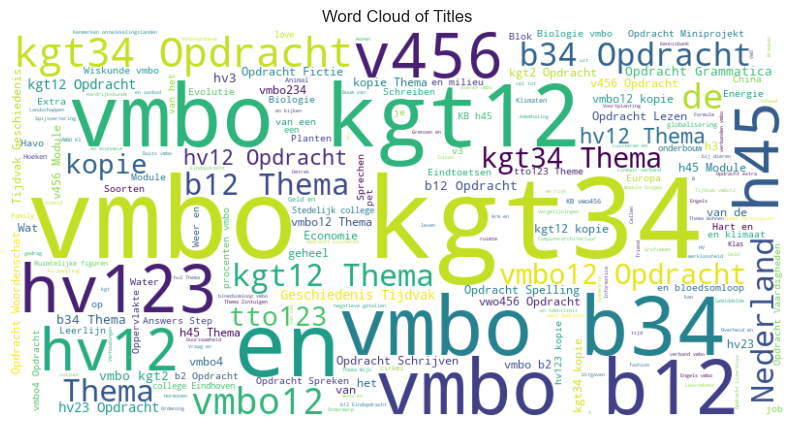

In [125]:
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud of Titles')
plt.axis('off')
plt.show()

Hier zien we een wordcloud van een paar titles. We zien veel dat titles niveaus, leerjaren en vakken bevatten. Dit is dus erg handig voor het voorspellen van metadata. Later in ons notebook hebben we deze titles toegevoegd aan de betreffende metadata.

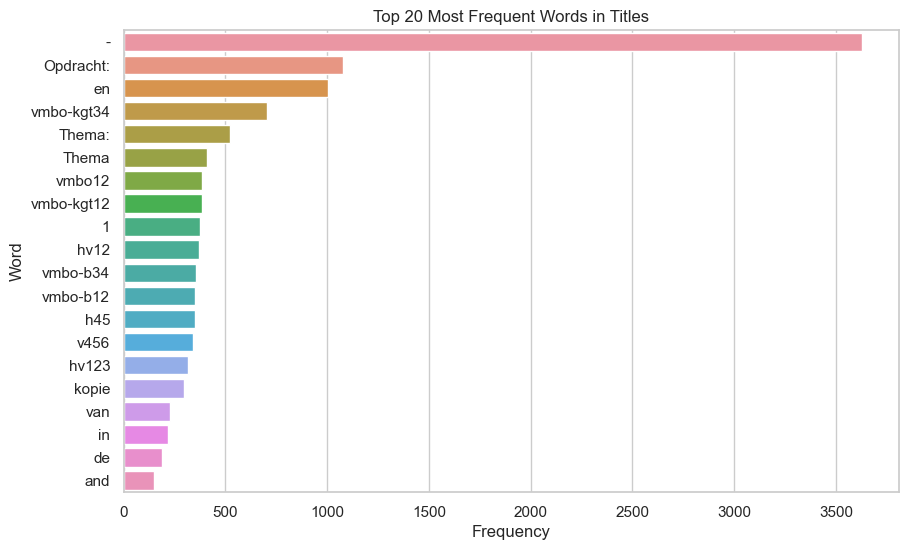

In [127]:
# Plotting the bar plot of most frequent words
from collections import Counter
words = text.split()
word_counts = Counter(words)
common_words = word_counts.most_common(20)

words, counts = zip(*common_words)

plt.figure(figsize=(10, 6))
sns.barplot(x=list(counts), y=list(words))
plt.title('Top 20 Most Frequent Words in Titles')
plt.xlabel('Frequency')
plt.ylabel('Word')
plt.show()

We zien hier de meest voorkomende woorden in title. We zien dat de separator (-) vaak wordt gebruikt in een lestitel. Deze moeten we eruit halen willen we de titel gebruiken voor predictions, aangezien het ons niks zegt over het vak, leerjaar of niveau. Ook zien we veel lidwoorden, bijvoorbeeld 'van', 'in', 'de'. Deze zullen we met NLP technieken uit de titel halen om het te gebruiken in een model. Ook zien we als laatste woord 'and'. Dit zegt al veel over een les, aangezien alleen Engelse lessen engelse woorden in de titel gebruiken. De keuze van het gebruik van titel en meerdere kolommen hebben wij gedetailleerd uitgelegd in ons adviesrapport bij het hoofdstuk Data exploratie en Data Cleaning.

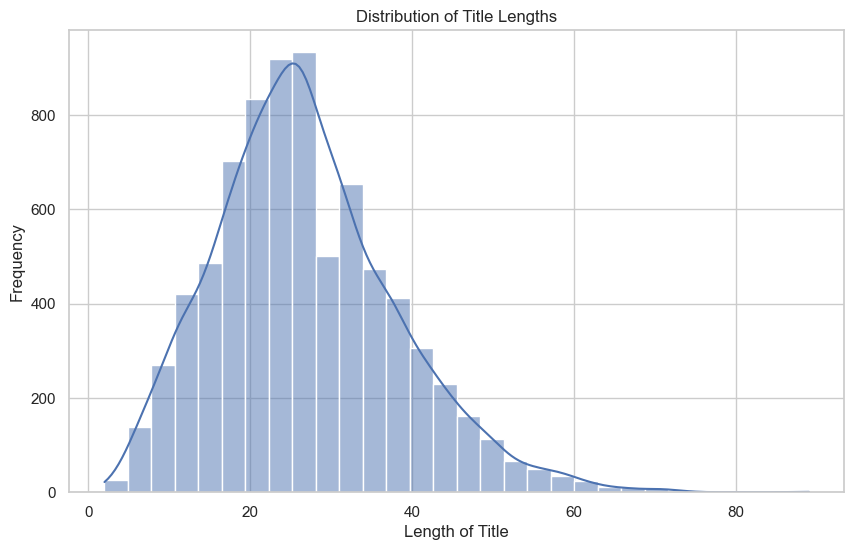

In [129]:
title_lengths = dataframe['title'].apply(len)

plt.figure(figsize=(10, 6))
sns.histplot(title_lengths, bins=30, kde=True)
plt.title('Distribution of Title Lengths')
plt.xlabel('Length of Title')
plt.ylabel('Frequency')
plt.show()

Hier zien we een distribution van title lengths. We zien dat er veel titles rond de 30 woorden bevatten, en een aantal titels bevatten zelfs rond de 60 worden. We zien ook outliers rond de 80 woorden.

In [131]:
#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['description'][idx]}\n")

Full text for sample index 1207:


Full text for sample index 6340:
Deze opdracht hoort bij het thema ''Water in China'', en is onderdeel van de arrangeerbare leerlijn van de Stercollecties voor aardrijkskunde voor vmbo-kgt leerjaar 3 & 4. Deze opdracht legt uit wat stuwdammen zijn en wat zowel de voor- als nadelen ervan zijn. Je bekijkt een video over stuwdammen in China, hierbij komen vragen langs in de video. Deze beantwoord je terwijl je de video even op stop zet. Als laatste wordt de Drieklovendam in China besproken als voorbeeld van een stuwdam. Hierbij bekijk je ook een video en beantwoord je vragen over deze dam.



In [132]:
#Description, Luca

De description is een kleine beschrijving van de tekst. We zien in deze voorbeelden dat er een thema wordt gegeven, een vak, het niveau en het leerjaar. Verder is er een kleine uitleg van wat je kan verwachten in de les. Dit is erg belangrijk voor ons voorspellend model, aangezien de metadata hier letterlijk in staat. Ook zijn er wel lessen waar het wat onduidelijker is, zoals hieronder.

In [134]:
sample_indices = dataframe.sample(1).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['description'][idx]}\n")

Full text for sample index 1308:
Reisgids digitaal leermateriaal: werkvormen



Dit zegt wat minder over de les. We moeten dus zorgvuldig handige informatie extraheren van de descriptions die wel belangrijk zijn en deze gebruiken voor ons voorspellend model.


In [136]:
missing_descriptions = dataframe['description'].isna().sum()
total_descriptions = len(dataframe['description'])
print(f'Missing descriptions: {missing_descriptions} out of {total_descriptions} ({missing_descriptions/total_descriptions:.2%})')


Missing descriptions: 0 out of 7787 (0.00%)


De description bevat nooit missende waardes en is dus altijd verplicht ingevuld. Echter is dit niet waar, we zien bij dataframe['description'].head() al meerdere descriptions die leeg zijn. Hier zoomen we even op in.

In [138]:
# Find descriptions that are empty (zero length)
empty_descriptions = dataframe[dataframe['description'] == '']

# Display examples of these empty descriptions
print(f"\nExamples of empty descriptions:\n")
for idx, desc in empty_descriptions['description'].head(6).items():
    print(f"Index {idx}: {desc}\n")


Examples of empty descriptions:

Index 0: 

Index 1: 

Index 3: 

Index 4: 

Index 5: 

Index 7: 



We zien dat veel lessen lege descriptions hebben. Ook al is de description nooit missing, zijn er wel een aantal leeg.

In [140]:
# Counting unique descriptions
unique_descriptions_count = dataframe['description'].nunique()
print(f'Total unique descriptions: {unique_descriptions_count}')

# Counting empty descriptions
empty_descriptions_count = dataframe[dataframe['description'] == ''].shape[0]
print(f'Total empty descriptions: {empty_descriptions_count}')

Total unique descriptions: 4198
Total empty descriptions: 1731


Maarliefst 1731(!) descriptions bevatten geen tekst. Deze descriptions kunnen dus niet gebruikt worden voor ons voorspellend model. De 4198 unique descriptions kunnen we wel gebruiken in modelling. Echter moeten we wel zeker weten dat de data handig is zoals hierboven besproken. Bij het hoofdstuk data cleaning zoomen we meer in op description.

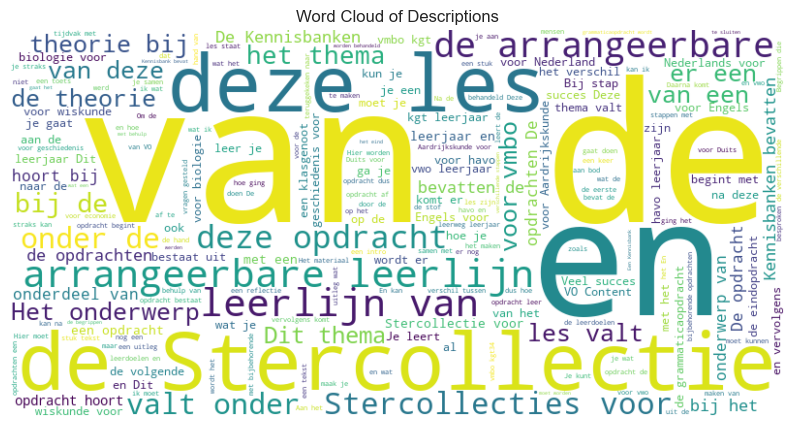

In [142]:
dataframe = dataframe.dropna(subset=['description'])

# Plotting the word cloud
text = ' '.join(dataframe['description'].values)
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud of Descriptions')
plt.axis('off')
plt.show()

In deze plot zien we een wordcloud van de descriptions. We zien veel lidwoorden/stopwords, die we er bij het hoofdstuk data cleaning moeten uithalen.

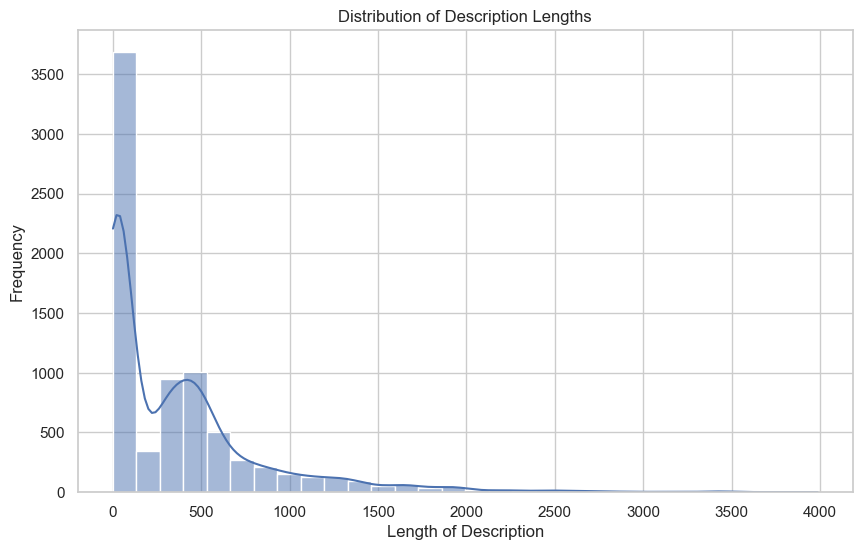

In [144]:
description_lengths = dataframe['description'].apply(len)

plt.figure(figsize=(10, 6))
sns.histplot(description_lengths, bins=30, kde=True)
plt.title('Distribution of Description Lengths')
plt.xlabel('Length of Description')
plt.ylabel('Frequency')
plt.show()

Hier zien we een verdeling van de lengte van description. We zien een hoge piek bij het begin, rond de 0. Zoals eerder vastgelegd, bevat description veel lege waardes.

Conclusie: Description zegt ons veel over de metadata van een les. We moeten echter zorgvuldig kijken naar welke descriptions boeiend zijn, en de lege descriptions weg laten.

In [147]:
#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['last_modified_date'][idx]}\n")

Full text for sample index 1292:
2024-04-02T19:31:12+02:00

Full text for sample index 700:
2020-02-19T14:52:20+01:00



In [148]:
#Last modified date, Luca

Last modified date bevat de datums waarop de bestanden voor het laatst zijn gewijzigd.

In [150]:
dataframe['last_modified_date'] = pd.to_datetime(dataframe['last_modified_date'])


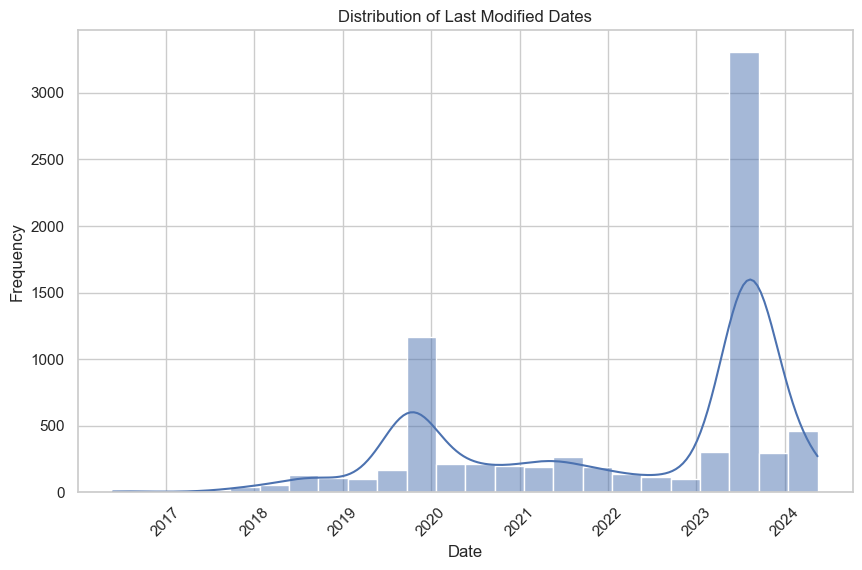

In [151]:
# Plotting the histogram of last_modified_date
plt.figure(figsize=(10, 6))
sns.histplot(dataframe['last_modified_date'], kde=True)
plt.title('Distribution of Last Modified Dates')
plt.xlabel('Date')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

Hier zien we een histogram van de last_modified_date. De last modified date laat ons zien wanneer een les voor het laatst is aangepast. We zien net als bij wanneer een les is gemaakt dezelfde pieken. Rond 2020 en 2023. Wij gebruiken de last_modified_date niet in ons voorspellend model. Het heeft geen impact op de metadata.

#### date_created analyse

eerst gaan we kijken hoe de data eruit ziet van deze kolom

In [155]:
#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['date_created'][idx]}\n")

Full text for sample index 1421:
2018-05-08T09:02:57+02:00

Full text for sample index 1315:
2018-03-06T12:37:59+01:00



De onderstaande code voert twee taken uit:

Converteert de 'date_created' kolom naar datetime-formaat: Hierbij wordt ervoor gezorgd dat de tijdzone-informatie behouden blijft door de parameter utc=True te gebruiken.
Bepaalt het bereik van de datums: Hierbij worden de vroegste en de laatste datum in de 'date_created' kolom berekend en weergegeven.

In [157]:
# Zorg ervoor dat de kolom wordt geïnterpreteerd als datetime met tijdzone-informatie behouden
dataframe['date_created'] = pd.to_datetime(dataframe['date_created'], errors='coerce', utc=True)

# Controleer het bereik van de datums
min_date = dataframe['date_created'].min()
max_date = dataframe['date_created'].max()

print(f"Earliest date created: {min_date}")
print(f"Latest date created: {max_date}")


Earliest date created: 2014-07-04 07:37:55+00:00
Latest date created: 2023-02-23 11:04:09+00:00


Uitleg van de Uitkomsten
Earliest date created: 2014-07-04 07:37:55+00:00

Dit geeft aan dat het vroegste document in de dataset op 4 juli 2014 is aangemaakt.
Latest date created: 2023-02-23 11:04:09+00:00

Dit geeft aan dat het laatste document in de dataset op 23 februari 2023 is aangemaakt.
Deze resultaten helpen ons te begrijpen over welke periode de documenten in de dataset zijn aangemaakt en bevestigen dat de 'date_created' kolom correct is omgezet naar datetime-formaat met tijdzone-informatie behouden.

De onderstaande code voert een controle uit op ontbrekende of ongeldig gedecodeerde datums in de 'date_created' kolom. Hierbij wordt het aantal ontbrekende of ongeldig gedecodeerde datums berekend en weergegeven.

In [160]:
# Controleer op ontbrekende of ongeldig gedecodeerde datums
missing_dates = dataframe['date_created'].isnull().sum()

print(f"Aantal ontbrekende of ongeldig gedecodeerde datums: {missing_dates}")


Aantal ontbrekende of ongeldig gedecodeerde datums: 900


Uitleg van de Uitkomsten

Aantal ontbrekende of ongeldig gedecodeerde datums: 900

Dit geeft aan dat er 900 datums zijn die ontbreken of ongeldig zijn gedecodeerd in de 'date_created' kolom. Dit kan betekenen dat deze cellen leeg waren of een onjuist formaat hadden dat niet kon worden geconverteerd naar een geldige datetime-waarde.
Deze controle is essentieel om ervoor te zorgen dat we de datakwaliteit van de 'date_created' kolom begrijpen en dat eventuele ontbrekende of ongeldige waarden worden geïdentificeerd voor verdere verwerking of opschoning van de dataset.

De onderstaande code visualiseert de distributie van de 'date_created' kolom om te begrijpen hoe de data over de tijd is verspreid. De data wordt geplot in een histogram, waarbij het aantal documenten per tijdsperiode wordt weergegeven.

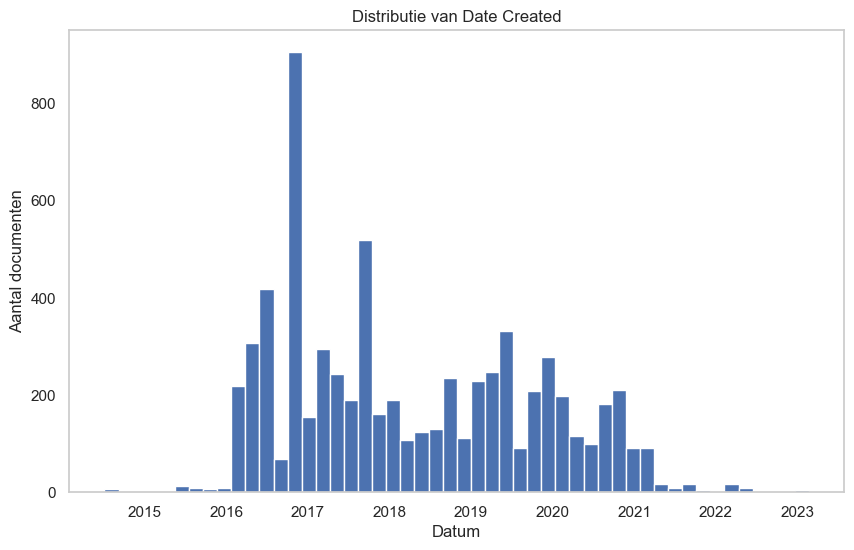

In [163]:
import matplotlib.pyplot as plt

# Plot de distributie van de datums
plt.figure(figsize=(10, 6))
dataframe['date_created'].hist(bins=50)
plt.title('Distributie van Date Created')
plt.xlabel('Datum')
plt.ylabel('Aantal documenten')
plt.grid(False)
plt.show()


Uitleg van de Uitkomsten

Distributie van datums: De grafiek toont de frequentie van documenten die zijn aangemaakt over verschillende tijdsperioden. Elke balk in het histogram vertegenwoordigt het aantal documenten dat binnen een bepaalde tijdsperiode is aangemaakt.

Pieken en dalen:

Er is een duidelijke piek rond het jaar 2017, wat aangeeft dat er in deze periode veel documenten zijn aangemaakt.
Andere pieken zijn zichtbaar rond 2016, 2018, en 2020, wat kan duiden op specifieke gebeurtenissen of initiatieven die hebben geleid tot een toename in het aantal aangemaakte documenten.
Er zijn ook perioden met minder activiteit, met name na 2021, wat aangeeft dat er in deze latere jaren minder documenten zijn aangemaakt.

#### analyse publised

eerst gaan we even kijken hoe deze kolom eruit ziet in het dataframe


In [167]:
#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['published'][idx]}\n")

Full text for sample index 4369:
True

Full text for sample index 3318:
True



In deze sectie voeren we een inspectie uit op de kolom published in onze dataset. We bekijken de eerste paar waarden, het aantal unieke waarden, en het aantal ontbrekende waarden. Dit helpt ons te begrijpen hoe de data in deze kolom eruitziet en of er problemen zijn zoals ontbrekende waarden of weinig variatie.

In [169]:
# Inspectie van de eerste paar waarden in de kolom 'published'
print(dataframe['published'].head())

# Controle van het aantal unieke waarden
unique_values = dataframe['published'].nunique()
print(f"Aantal unieke waarden in de kolom 'published': {unique_values}")

# Controle van het aantal ontbrekende waarden
missing_values = dataframe['published'].isnull().sum()
print(f"Aantal ontbrekende waarden in de kolom 'published': {missing_values}")


0    True
1    True
2    True
3    True
4    True
Name: published, dtype: bool
Aantal unieke waarden in de kolom 'published': 1
Aantal ontbrekende waarden in de kolom 'published': 0


Deze resultaten laten zien dat:

Eerste paar waarden: De eerste vijf waarden in de kolom published zijn allemaal True, wat aangeeft dat deze kolom binaire gegevens bevat.
Aantal unieke waarden: Er is slechts één unieke waarde (True) in de kolom published, wat aangeeft dat er geen variatie in de gegevens is.
Aantal ontbrekende waarden: Er zijn geen ontbrekende waarden in de kolom published, wat betekent dat alle rijen een geldige waarde hebben.
Deze informatie suggereert dat de kolom published mogelijk niet erg informatief is voor verdere analyses of modellering, omdat er geen variatie in de gegevens is.

In deze sectie visualiseren we de verdeling van de published kolom in onze dataset. We gebruiken een histogram om te laten zien hoe vaak elke waarde voorkomt. Dit helpt ons te begrijpen of er variatie is in de data en of er eventuele patronen zichtbaar zijn.

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


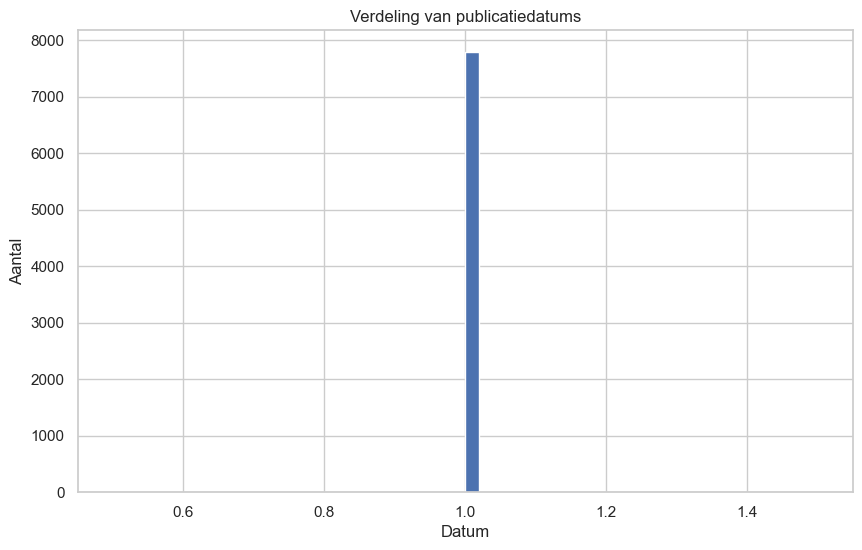

In [172]:
import matplotlib.pyplot as plt

# Visualiseer de verdeling van publicatiedatums
plt.figure(figsize=(10, 6))
dataframe['published'].hist(bins=50)
plt.title('Verdeling van publicatiedatums')
plt.xlabel('Datum')
plt.ylabel('Aantal')
plt.show()



De histogram toont de verdeling van de publicatiedatums in de kolom published. Uit de grafiek blijkt dat:

Verdeling: Alle waarden in de kolom published zijn True, wat resulteert in een enkele balk in het histogram.
Aantal: Er zijn ongeveer 8000 gevallen van True.
Deze visualisatie bevestigt de eerdere bevinding dat er geen variatie in de published kolom is, aangezien alle waarden True zijn. Dit suggereert dat de kolom mogelijk niet erg nuttig is voor verdere analyses of modellering.











De inspectie en visualisatie van de kolom published hebben aangetoond dat deze kolom geen variatie bevat, omdat alle waarden True zijn. Dit betekent dat elke rij in de dataset dezelfde waarde heeft voor de published kolom.

Op basis van de bovenstaande argumenten is het niet logisch om de 'date_created' kolom mee te nemen in het model voor het maken van metadata suggesties voor leerjaar, niveau en vak. De directe relevantie van de datum waarop een document is aangemaakt is beperkt, en de aanwezigheid van missende waarden, mogelijke overfitting, en verhoogde complexiteit wegen niet op tegen de potentiële voordelen.







In [175]:
#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['team'][idx]}\n")

Full text for sample index 2813:
VO-content Engels

Full text for sample index 4764:
VO-content Nederlands



In [176]:
#Team uitleg, Luca

De kolom team is erg interessant. We zien dat als voorbeeld bij team er staat VO-content Nederlands, dit zegt ons iets over het vak. Echter zien we ook lege waardes, hier zoomen we later weer in. Ook zien we VO-content - Kennisbanken. Dit zijn geen lessen en kunnen uit ons dataset verwijderd worden. De keuze van wat we behouden doen we in het hoofdstuk, Data Cleaning.

In [178]:
unique_descriptions_count = dataframe['team'].nunique()
print(f'Total unique teams: {unique_descriptions_count}')

# Counting empty descriptions
empty_descriptions_count = dataframe[dataframe['team'] == ''].shape[0]
print(f'Total empty teams: {empty_descriptions_count}')

Total unique teams: 36
Total empty teams: 1499


We zien hier maarliefst dat teams 1499 keer empty zijn. Deze kunnen dus niet helpen bij het voorspellen van de metadata, de unique teams geven ons wel meer beeld over de les, hier zoomen we even op in.

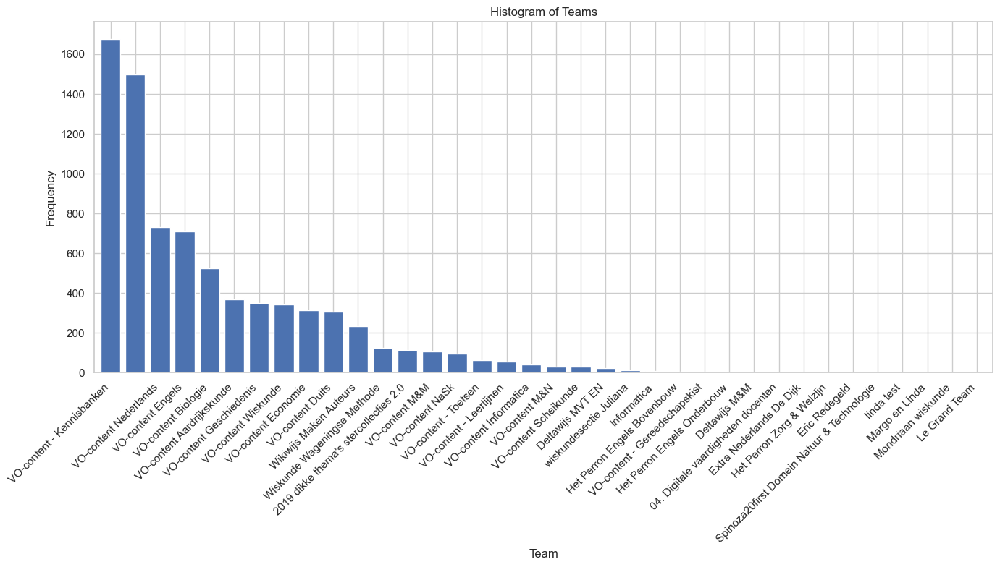

In [180]:
dataframe = dataframe.dropna(subset=['team'])

plt.figure(figsize=(14, 8))
dataframe['team'].value_counts().plot(kind='bar', width=0.8)  # Adjust width as needed
plt.title('Histogram of Teams')
plt.xlabel('Team')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

Hier zien we een histogram van de verdeling van teams. We zien een hoge piek op het team: VO-Content - Kennisbanken. Hier zoomen we later even op in. Hierna zien we erg handig de vo-content + het vak. Dit kan goed worden gebruikt in een voorspellend model van de metadata. Ook zien we VO-Content 'ruis', bijvoorbeeld: 'toetsen', 'leerlijnen', 'gereedschapskist'. Ook aan het einde zien we teams waar we niet veel aan hebben, bijvoorbeeld linda test, margo en linda, eric redegeld. Bij het hoofdstuk datacleaning kijken we hier dieper in. Voor nu zoomen we in op kennisbanken om te kijken wat voor lessen dit zijn.

In [182]:
team_specific_text = dataframe[dataframe['team'] == 'VO-content - Kennisbanken']

print(f"First 10 text entries for team 'VO-content - Kennisbanken':\n")
count = 0
for idx, text in team_specific_text['text'].items():
    if count < 10:
        print(f"Index {idx}: {text}\n")
        count += 1
    else:
        break

First 10 text entries for team 'VO-content - Kennisbanken':

Index 58: Doorbraak Intro en probleemstelling Een verzuilde samenleving De samenleving en de politiek waren vóór de Tweede Wereldoorlog sterk verzuild. In de politiek was samenwerking tussen bijvoorbeeld socialisten en katholieken ondenkbaar. Het leven van mensen speelde zich hoofdzakelijk af binnen de eigen kring, binnen de eigen zuil. Open staan voor andersdenkenden was daardoor moeilijk. Katholieke kinderen gingen naar een katholieke school en kinderen uit een socialistisch milieu gingen naar een openbare school. De verschillende omroepen maakten programma's die helemaal afgestemd waren op het publiek van de eigen zuil. Luisteren naar programma's van een andere zuil was niet gewenst en zelfs taboe. Probleemstelling De ervaringen tijdens de Tweede Wereldoorlog leken iets te veranderen aan de manier waarop men naast elkaar leefde. Toen de bevrijding naderde, hoopten veel mensen dat het na de oorlog allemaal anders zou worden

Als we filteren waar team: VO-content - Kennisbanken is zien we veel verschillende lessen. We zien bijvoorbeeld een Economie les bij Index 60 en bij Index 64 een Geschiedenis les. Conclusie is hieruit dat wanneer het team VO-content - Kennisbanken is dit niets zegt over de lesinhoud. De rest van de teams geven echter wel een beter beeld bij welke les ze horen. 

Bij de data cleaning kwam er iets geks naar voren. We zagen dat er geschiedenis lessen waren met team: Aardrijkskunde. Hier zoom ik nu op in.

In [185]:
team_specific_text = dataframe[dataframe['team'] == 'VO-content Aardrijkskunde']

print(f"First 10 text entries for team 'VO-content - Aardrijkskunde':\n")
count = 0
for idx, text in team_specific_text['text'].items():
    if count < 10:
        print(f"Index {idx}: {text}\n")
        count += 1
    else:
        break

First 10 text entries for team 'VO-content - Aardrijkskunde':

Index 1: De Opstand Vooraf Rond 1550 bestond Nederland nog niet. Het gebied waar nu Nederland is, was onderdeel van het rijk van keizer Karel V. Honderd jaar later bestond de Republiek der Nederlanden. Tik bij Google 'De Opstand' in en zoek op afbeeldingen. Wat zie je zoal? Leerdoel Na deze opdracht kun je: twee redenen noemen waarom de Nederlanders in de tweede helft van de 16e eeuw in opstand kwamen tegen de Spaanse overheersing. de volgende gebeurtenissen beschrijven en aangeven in welke volgorde de gebeurtenissen plaatsvonden: Beeldenstorm Vorming Unie van Utrecht Moord op Willem van Oranje Uitroepen Republiek der Nederlanden Twaalf jarig bestand Eindproduct Je maakt een tijdbalk met de belangrijkste gebeurtenissen van de Opstand. Bij de gebeurtenissen zoek je passende afbeeldingen. Activiteiten Stap Groepsgrootte Activiteit Stap 1 Alleen Kennisbank over voor de opstand bestuderen en vragen beantwoorden. Stap 2 Alleen K

We zien hier zoals verwacht bij index 1 al een les die niks te maken heeft met Aardrijkskunde. In deze subset zien we dat er maar 2 lessen echte Aardrijkskunde lessen zijn. Als we team zouden gebruiken in onze modelling, maakt dat het model minder betrouwbaar. Hierom hebben wij gekozen om dit niet te gebruiken. Hieronder zal ik nog meer voorbeelden laten zien van waar team niet klopt.

In [187]:
team_specific_text = dataframe[dataframe['team'] == 'VO-content Biologie']

print(f"First 10 text entries for team 'VO-content - Biologie':\n")
count = 0
for idx, text in team_specific_text['text'].items():
    if count < 10:
        print(f"Index {idx}: {text}\n")
        count += 1
    else:
        break

First 10 text entries for team 'VO-content - Biologie':

Index 1075: Verslag schrijven Een verslag is een goede manier om een onderzoek te beschrijven dat je hebt uitgevoerd. In een verslag combineer je tekst en afbeeldingen. Het doel is om de lezer uit te leggen wat je hebt gedaan en hoe je te werk bent gegaan. Hoe schrijf je een verslag? Bepaal eerst wat het onderwerp is van je verslag en welke informatie je hierbij wilt vertellen Verdeel de informatie in een logische volgorde over verschillende alinea's. Zorg ervoor dat je je verslag begint met een inleiding en eindigt met een duidelijk slot Schrijf de inleiding uit Beschrijf de informatie die je het meest belangrijk vindt in de kern van je verslag Zorg voor een duidelijke afsluiting met hierin een conclusie of samenvatting Bedenk een titel die goed past bij de inhoud van je verslag Zorg dat je verslag er netjes en verzorgd uitziet Verderkijker Scan de video's hieronder als je meer inspiratie wilt opdoen voor het schrijven van je ve

Hier zien we dat het team biologie niet alleen biologie lessen upload.


In [189]:
team_specific_text = dataframe[dataframe['team'] == 'VO-content Nederlands']

print(f"First 10 text entries for team 'VO-content - Nederlands':\n")
count = 0
for idx, text in team_specific_text['text'].items():
    if count < 10:
        print(f"Index {idx}: {text}\n")
        count += 1
    else:
        break

First 10 text entries for team 'VO-content - Nederlands':

Index 49: De Eerste Wereldoorlog Intro en probleemstelling Oorzaken Eerste Wereldoorlog Het is niet eenvoudig de oorzaken voor het uitbreken van de Eerste Wereldoorlog te beschrijven. De betrokken landen hadden verschillende redenen om mee te vechten. Door deze verschillende redenen en door een aantal toevallige gebeurtenissen is het lastig om de oorzaken te begrijpen. Verschillende historici Veel historici breken zich nog steeds het hoofd over de motieven van de verschillende Europese landen en de oorzaken voor het uitbreken van de oorlog. De ene historicus vindt dat het opkomend nationalisme van Duitsland de belangrijkste oorzaak was. Een andere historicus zegt dat het 'de gekte' van keizer Wilhelm II was. En een derde historicus wijt de oorlog vooral aan de instabiele bondgenoot­schappen die tussen de landen gesloten waren. Probleemstelling Redenen om mee te doen aan de Eerste Wereldoorlog Ieder land had zijn eigen redenen o

Hier zien we veel geschiedenis lessen bij team Nederlands. Teams is **niet** goed voor ons model.

#### analyse license

In [192]:
#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['license'][idx]}\n")

Full text for sample index 1234:
CC Naamsvermelding 4.0 Internationale licentie

Full text for sample index 4850:
CC Naamsvermelding-GelijkDelen 4.0 Internationale licentie



In [193]:
# Inspectie van de eerste paar waarden in de kolom 'license'
print(dataframe['license'].head())

# Controle van het aantal unieke waarden
unique_values = dataframe['license'].nunique()
print(f"Aantal unieke waarden in de kolom 'license': {unique_values}")

# Controle van het aantal ontbrekende waarden
missing_values = dataframe['license'].isnull().sum()
print(f"Aantal ontbrekende waarden in de kolom 'license': {missing_values}")


0    CC Naamsvermelding-GelijkDelen 3.0 Nederland l...
1    CC Naamsvermelding-GelijkDelen 4.0 Internation...
2    CC Naamsvermelding-GelijkDelen 4.0 Internation...
3    CC Naamsvermelding-GelijkDelen 4.0 Internation...
4    CC Naamsvermelding-GelijkDelen 4.0 Internation...
Name: license, dtype: object
Aantal unieke waarden in de kolom 'license': 5
Aantal ontbrekende waarden in de kolom 'license': 0


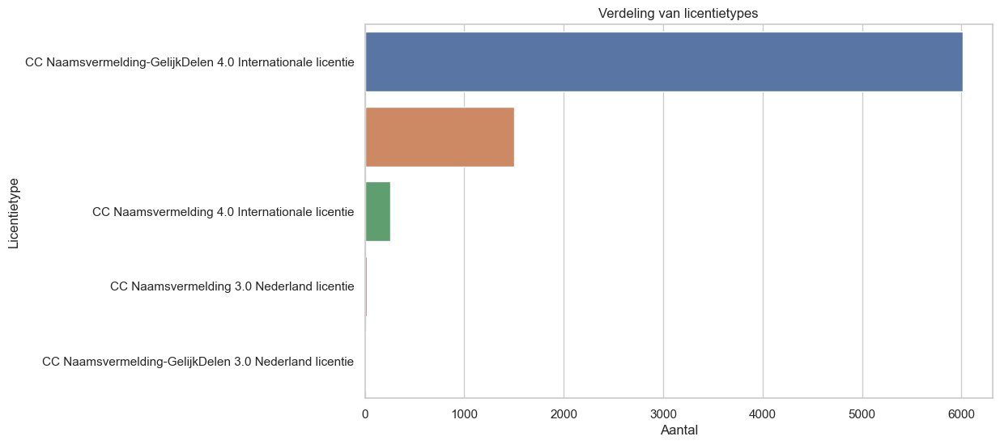

In [194]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualiseer de verdeling van licentietypes
plt.figure(figsize=(10, 6))
sns.countplot(y='license', data=dataframe, order=dataframe['license'].value_counts().index)
plt.title('Verdeling van licentietypes')
plt.xlabel('Aantal')
plt.ylabel('Licentietype')
plt.show()


In [195]:
# Frequenties en percentages van elk licentietype
license_counts = dataframe['license'].value_counts()
license_percentages = dataframe['license'].value_counts(normalize=True) * 100

print("Frequenties van licentietypes:")
print(license_counts)
print("\nPercentages van licentietypes:")
print(license_percentages)


Frequenties van licentietypes:
CC Naamsvermelding-GelijkDelen 4.0 Internationale licentie    6012
                                                              1499
CC Naamsvermelding 4.0 Internationale licentie                 253
CC Naamsvermelding 3.0 Nederland licentie                       16
CC Naamsvermelding-GelijkDelen 3.0 Nederland licentie            7
Name: license, dtype: int64

Percentages van licentietypes:
CC Naamsvermelding-GelijkDelen 4.0 Internationale licentie    77.205599
                                                              19.250032
CC Naamsvermelding 4.0 Internationale licentie                 3.249005
CC Naamsvermelding 3.0 Nederland licentie                      0.205471
CC Naamsvermelding-GelijkDelen 3.0 Nederland licentie          0.089893
Name: license, dtype: float64


en met deze kruistabel kan ik checken of een bepaalde licentie bij verscvhillende leerjaren voorkomt

In [197]:
# Splits de leerjaren en converteer naar numerieke waarden, waarbij lege waarden worden genegeerd
all_leerjaren = dataframe['leerjaren'].dropna().astype(str).str.split(', ').explode()
all_leerjaren = all_leerjaren[all_leerjaren != '']

# Voeg de licentie-informatie toe aan de gesplitste leerjaren
all_leerjaren = all_leerjaren.to_frame().join(dataframe['license'])

# Maak een kruisverbandtabel
license_leerjaren_crosstab = pd.crosstab(all_leerjaren['license'], all_leerjaren['leerjaren'])
print("Kruisverband tussen licenties en leerjaren:\n", license_leerjaren_crosstab)


Kruisverband tussen licenties en leerjaren:
 leerjaren                                              1     2     3     4  \
license                                                                      
                                                     210   202   272   331   
CC Naamsvermelding 3.0 Nederland licentie              3     3     6     4   
CC Naamsvermelding 4.0 Internationale licentie        86   118    56    56   
CC Naamsvermelding-GelijkDelen 3.0 Nederland li...     3     4     4     2   
CC Naamsvermelding-GelijkDelen 4.0 Internationa...  2061  2427  1938  2088   

leerjaren                                             5    6  
license                                                       
                                                     91   46  
CC Naamsvermelding 3.0 Nederland licentie             3    1  
CC Naamsvermelding 4.0 Internationale licentie       20    6  
CC Naamsvermelding-GelijkDelen 3.0 Nederland li...    0    0  
CC Naamsvermelding-GelijkDelen

Op basis van de bovenstaande argumenten is het duidelijk dat de 'license' kolom geen significante waarde toevoegt aan het model voor het maken van metadata suggesties voor leerjaar, niveau en vak. De kolom bevat voornamelijk informatie over de gebruiksvoorwaarden van het document, wat niet direct relevant is voor de voorspelling van de educatieve metadata.

In [199]:
#License, Jesse

#### analyse web adress

In [201]:
#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['web_address'][idx]}\n")

Full text for sample index 6901:


Full text for sample index 687:
https://maken.wikiwijs.nl/112534/



Eerste paar rijen van 'web_address_length':
0    33
1    33
2    33
3    33
4    33
Name: web_address_length, dtype: int64

Beschrijving van 'web_address_length':
count    7787.000000
mean       26.269680
std        12.834898
min         0.000000
25%        32.000000
50%        32.000000
75%        33.000000
max        33.000000
Name: web_address_length, dtype: float64


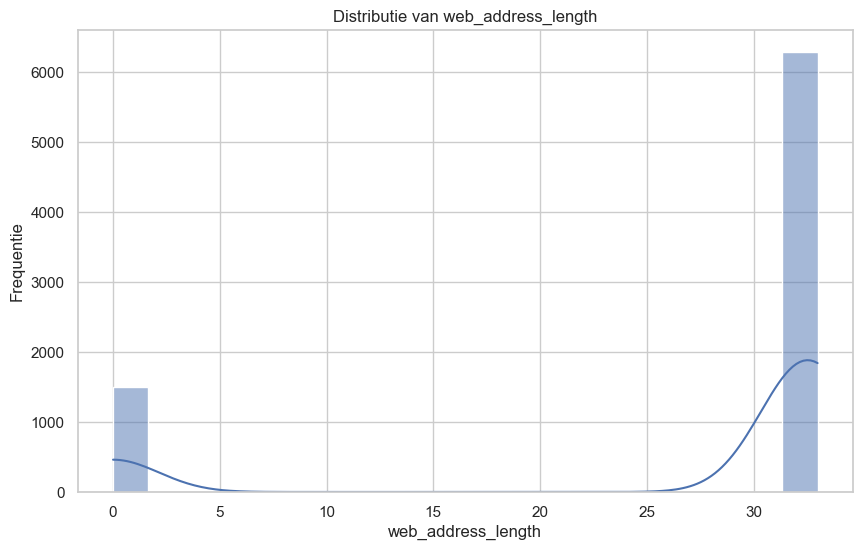

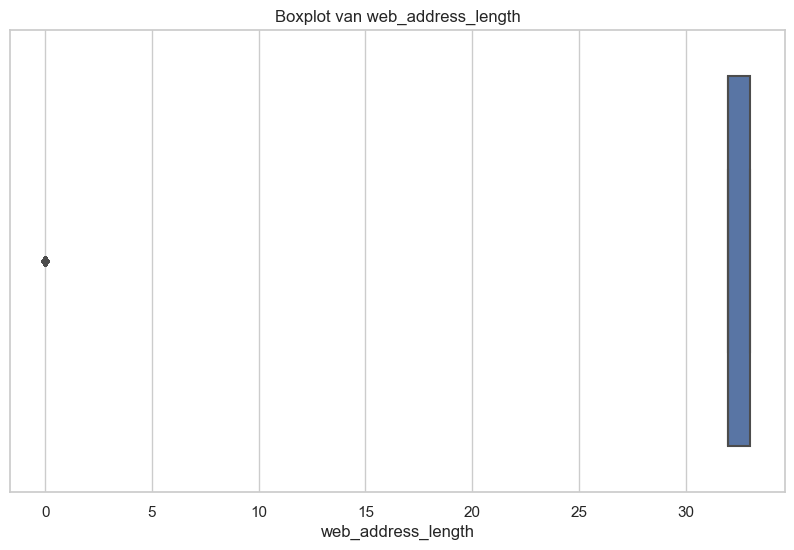

In [202]:
import matplotlib.pyplot as plt
import seaborn as sns

# Voeg een kolom toe met de lengte van de webadressen
dataframe['web_address_length'] = dataframe['web_address'].apply(len)

# 1. Basisoverzicht en Statistieken van web_address_length
print("Eerste paar rijen van 'web_address_length':")
print(dataframe['web_address_length'].head())

print("\nBeschrijving van 'web_address_length':")
print(dataframe['web_address_length'].describe())

# 2. Distributie Analyseren
plt.figure(figsize=(10, 6))
sns.histplot(dataframe['web_address_length'], bins=20, kde=True)
plt.title('Distributie van web_address_length')
plt.xlabel('web_address_length')
plt.ylabel('Frequentie')
plt.show()

# 3. Boxplot voor uitschieters
plt.figure(figsize=(10, 6))
sns.boxplot(x=dataframe['web_address_length'])
plt.title('Boxplot van web_address_length')
plt.xlabel('web_address_length')
plt.show()


In [203]:
# Inspectie van de eerste paar waarden in de kolom 'web_address'
print(dataframe['web_address'].head())

# Controle van het aantal unieke waarden
unique_values = dataframe['web_address'].nunique()
print(f"Aantal unieke waarden in de kolom 'web_address': {unique_values}")

# Controle van het aantal ontbrekende waarden
missing_values = dataframe['web_address'].isnull().sum()
print(f"Aantal ontbrekende waarden in de kolom 'web_address': {missing_values}")


0    https://maken.wikiwijs.nl/100655/
1    https://maken.wikiwijs.nl/100698/
2    https://maken.wikiwijs.nl/100699/
3    https://maken.wikiwijs.nl/100701/
4    https://maken.wikiwijs.nl/100702/
Name: web_address, dtype: object
Aantal unieke waarden in de kolom 'web_address': 6289
Aantal ontbrekende waarden in de kolom 'web_address': 0


In [204]:
#web_address Jesse

In [205]:
#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['eindgebruiker'][idx]}\n")

Full text for sample index 5396:
leerling/student

Full text for sample index 5426:
leerling/student



Eerste paar rijen van 'eindgebruiker':
0    leerling/student
1    leerling/student
2    leerling/student
3    leerling/student
4    leerling/student
Name: eindgebruiker, dtype: object

Beschrijving van 'eindgebruiker':
count                 7787
unique                   2
top       leerling/student
freq                  7782
Name: eindgebruiker, dtype: object


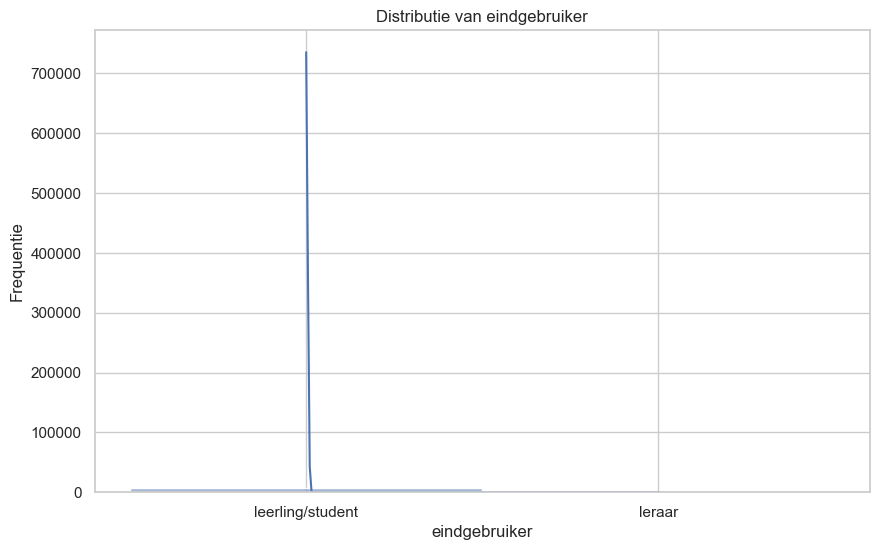

In [206]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Basisoverzicht en Statistieken
print("Eerste paar rijen van 'eindgebruiker':")
print(dataframe['eindgebruiker'].head())

print("\nBeschrijving van 'eindgebruiker':")
print(dataframe['eindgebruiker'].describe())

# 2. Distributie Analyseren
plt.figure(figsize=(10, 6))
sns.histplot(dataframe['eindgebruiker'], bins=20, kde=True)
plt.title('Distributie van eindgebruiker')
plt.xlabel('eindgebruiker')
plt.ylabel('Frequentie')
plt.show()




zoals in bovenstaande code te zien is zijn er maar 2 unieke waardes in deze kolom en zullen we deze dus ook niet gebruiken

In [209]:
#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['studiebelasting'][idx]}\n")

Full text for sample index 3082:


Full text for sample index 5026:
2 uur en 0 minuten



In [210]:
#studiebelasting, Luca

Het kolomn studiebelasting laat ons zien hoe lang de docent verwacht dat je over de les kan doen. Zo hebben kleinere lessen een lagere studiebelasting.

In [212]:
missing_study_load = dataframe['studiebelasting'].isna().sum()
total_study_load = len(dataframe['studiebelasting'])
print(f'Missing studiebelasting: {missing_study_load} out of {total_study_load} ({missing_study_load/total_study_load:.2%})')


Missing studiebelasting: 0 out of 7787 (0.00%)


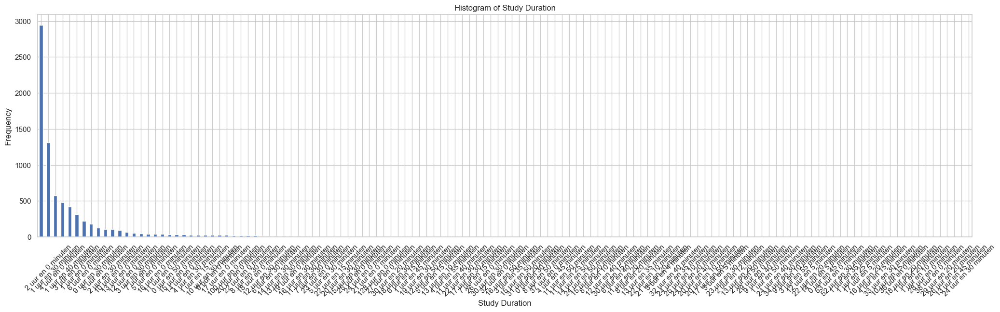

In [213]:
# Dropping NaN values in the 'studiebelasting' column for further analysis
dataframe = dataframe.dropna(subset=['studiebelasting'])

# Plotting the histogram of studiebelasting
plt.figure(figsize=(25, 6))
dataframe['studiebelasting'].value_counts().plot(kind='bar')
plt.title('Histogram of Study Duration')
plt.xlabel('Study Duration')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

Hier is een erg onduidelijke verdeling van hoe study belasting eruit ziet. Veel verschillende waardes aangezien de docent dit zelf in kan vullen. Dit is niet handig voor het voorspellen van metadata, de docent bepaalt de studiebelasting zelf.

In [215]:
#Neem 2 samples en laat de volle kolomn zien met een mask, geleerd tijdens Programmeren 2
sample_indices = dataframe.sample(2).index

for idx in sample_indices:
    print(f"Full text for sample index {idx}:\n{dataframe['trefwoorden'][idx]}\n")

Full text for sample index 2424:
arrangeerbaar, lineair verband, rekenstappen in schema, stercollectie, vmbo b1/2, wiskunde

Full text for sample index 5389:
arrangeerbaar, biologie, geslachstorgaan, geslachtshormoon, hormoon, mannelijk, stercollectie, vmbo kgt3, vrouwelijk



In [216]:
#trefwoorden, Luca

Trefwoorden zijn erg handig. Ze laten thema's zien van verschillende vakken.

In [218]:
# Counting empty descriptions
empty_descriptions_count = dataframe[dataframe['trefwoorden'] == ''].shape[0]
print(f'Total empty trefwoorden: {empty_descriptions_count}')

Total empty trefwoorden: 1607


In onze dataset zijn het aantal teams leeg 1607. Deze kunnen we dus niet gebruiken bij het voorspellend model. Degene die wel vol zijn worden nu bekeken. Allereerst doen we dit met een wordcloud.

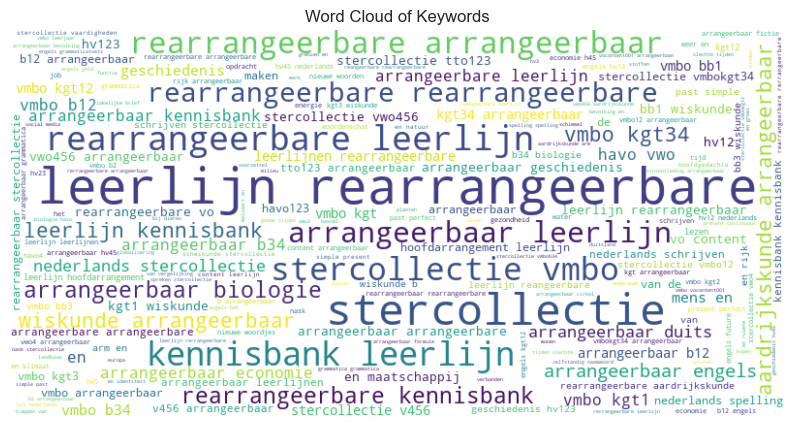

In [220]:
dataframe = dataframe.dropna(subset=['trefwoorden'])

# Plotting the word cloud of trefwoorden
text = ' '.join(dataframe['trefwoorden'].astype(str).values)
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud of Keywords')
plt.axis('off')
plt.show()

# Data cleaning

Nu kunnen we deze PO content uit de dataset halen.

C:\Users\leeuw\AppData\Local\Temp\ipykernel_25900\2520051709.py:14: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.
  plt.tight_layout()
C:\Users\leeuw\AppData\Local\Temp\ipykernel_25900\2520051709.py:14: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
C:\Users\leeuw\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


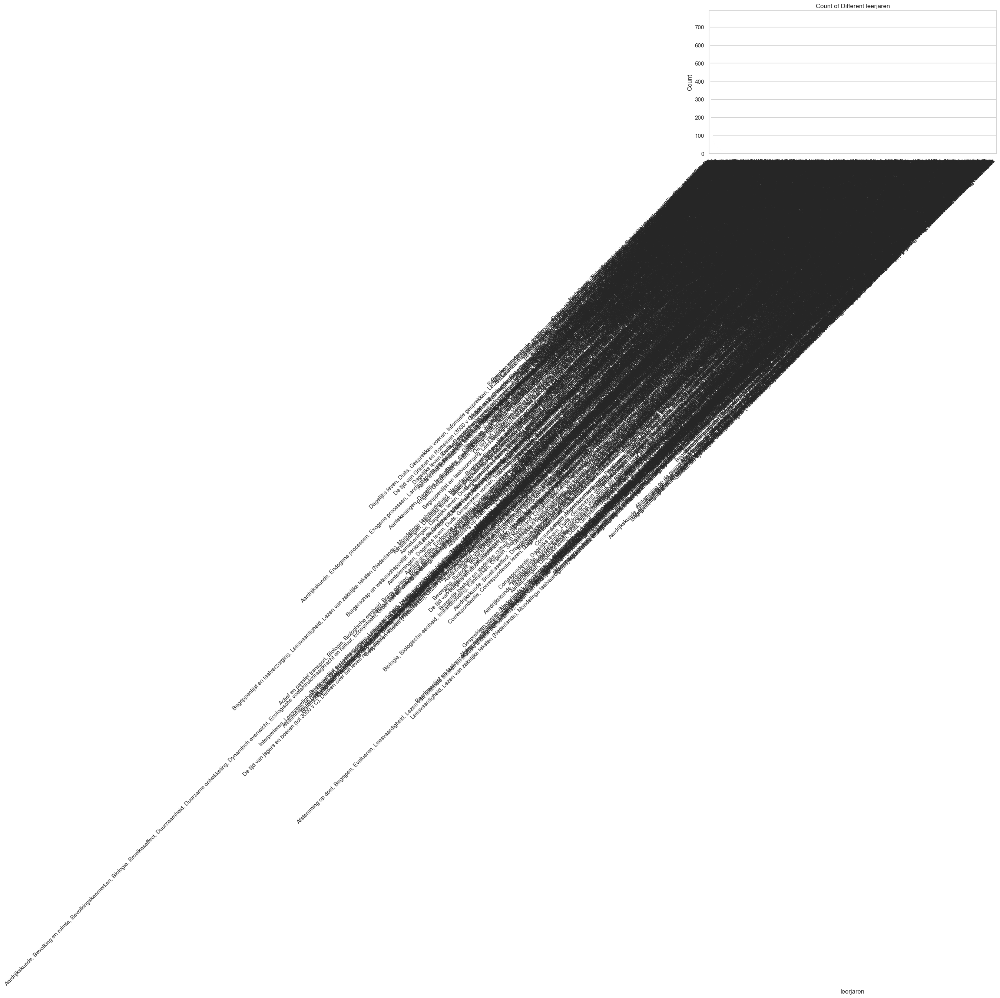

In [223]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style of the plot
sns.set(style="whitegrid")

# Create the bar plot
plt.figure(figsize=(10, 5))
sns.countplot(data=dataframe, x='vakken', order=dataframe['vakken'].value_counts().index)
plt.xticks(rotation=45, ha='right')
plt.xlabel('leerjaren')
plt.ylabel('Count')
plt.title('Count of Different leerjaren')
plt.tight_layout()
plt.show()


Next moeten we de vakken kolom opschonen. Uit de EDA bleek dat deze kolom vol zit met verschillende vakken, vaak meerdere. We zoomen hier op in en vinden een manier om deze op te schonen.

In [225]:
vakken_list = dataframe['vakken'].unique()
print(vakken_list)


['Biologie, Groei en ontwikkeling, Instandhouding en ontwikkeling' ''
 'Aardrijkskunde, Endogene processen, Relaties tussen endogene processen, Systeem aarde, Werking van endogene krachten wereldwijd'
 ...
 'De tijd van burgers en stoommachines (1800 - 1900), Geschiedenis, Industriële revolutie en de opkomst van emancipatiebewegingen'
 'De tijd van de wereldoorlogen (1900 - 1950), Duitse bezetting en de Jodenvervolging, Geschiedenis, Racistisch en totalitair karakter van het nationaalsocialisme'
 'Cultuur, De tijd van de wereldoorlogen (1900 - 1950), Geschiedenis, Internationale verhoudingen, Macht, Mens en maatschappij, gezag en bestuur, levensbeschouwing en identiteit']


# Vakken kolom schoon maken en visualiseren

In deze code wordt een lijst van vakken opgeschoond om alleen geldige vakken te behouden. Daarna wordt de DataFrame gefilterd om rijen met niet geldige vakken te verwijderen. 

Hier is een gedetailleerde uitleg van wat er gebeurt:

Definiëren van de lijst van geldige vakken:

valid_subjects bevat de lijst van geldige vakken die we willen behouden.

Definiëren van de functie clean_vakken:

De functie clean_vakken neemt twee parameters: een lijst van vakkenstrings (vakken_list) en de lijst van geldige vakken (valid_subjects).

Voor elke vakkenstring in vakken_list:

Splits de string in afzonderlijke vakken op basis van komma's.

Verwijder overbodige spaties rondom elk vak.

Controleer of een van de vakken in de lijst voorkomt in valid_subjects.

Voeg het gevonden vak toe aan de lijst cleaned_vakken, of None als geen geldig vak wordt gevonden.

Toepassen van de functie op de DataFrame:

De functie clean_vakken wordt toegepast op de kolom vakken van de DataFrame, en het resultaat wordt opgeslagen in een nieuwe kolom cleaned_vakken.

Filteren van de DataFrame:

De DataFrame wordt gefilterd om rijen te verwijderen waar cleaned_vakken None is, met behulp van dropna.

Weergeven van de aangepaste DataFrame:

De aangepaste DataFrame dataframe wordt weergegeven om de resultaten te tonen.

Deze stappen zorgen ervoor dat de kolom vakken alleen geldige vakken bevat en dat rijen met niet-geldige vakken uit de DataFrame worden verwijderd.


dit is de uitleg van clean vakken

In [229]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
import tensorflow as tf
import numpy as np
valid_subjects = [

    "Aardrijkskunde", "Biologie", "Duits", "Economie", "Engels", "Geschiedenis", "Informatica", "Nederlands", "Rekenen", "Natuurkunde", "Scheikunde", "M&M", "M&N", "Maatschappij"
    
]

def clean_vakken(vakken_list, valid_subjects):
    """
    Maak een lijst van vakken schoon door alleen geldige vakken te behouden.
    
    Parameters:
    vakken_list (list): Lijst van vakkenstrings gescheiden door komma's.
    valid_subjects (list): Lijst van geldige vakken.
    
    Returns:
    list: Een lijst van schoongemaakte vakken, waarbij niet-geldige vakken worden genegeerd.
    """
    cleaned_vakken = []
    for vakken in vakken_list:
        subjects = [sub.strip() for sub in vakken.split(",")]
        found_subject = None
        for subject in subjects:
            if subject in valid_subjects:
                found_subject = subject
                break  
        if found_subject:
            cleaned_vakken.append(found_subject)
        else:
            cleaned_vakken.append(None)  
    return cleaned_vakken

# Toepassen van de functie om een nieuwe kolom in de dataframe toe te voegen
dataframe['cleaned_vakken'] = clean_vakken(dataframe['vakken'].tolist(), valid_subjects)

# Filter de dataframe om rijen met niet-geldige vakken te verwijderen
dataframe = dataframe.dropna(subset=['cleaned_vakken'])


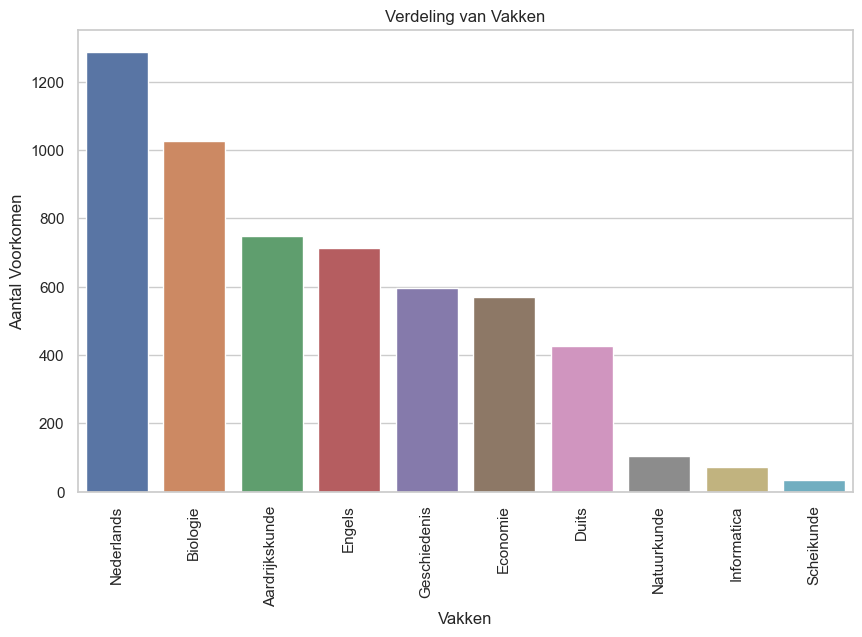

In [230]:
# Tellen van het aantal voorkomen van elk vak
vak_count = dataframe['cleaned_vakken'].value_counts()

# Barplot van vakken
plt.figure(figsize=(10, 6))
sns.barplot(x=vak_count.index, y=vak_count.values)
plt.title('Verdeling van Vakken')
plt.xlabel('Vakken')
plt.ylabel('Aantal Voorkomen')
plt.xticks(rotation=90)
plt.show()


Nu is vakken ook klaar voor modelleren.

Vervolgens kijken we naar de verdeling van leerjaren.

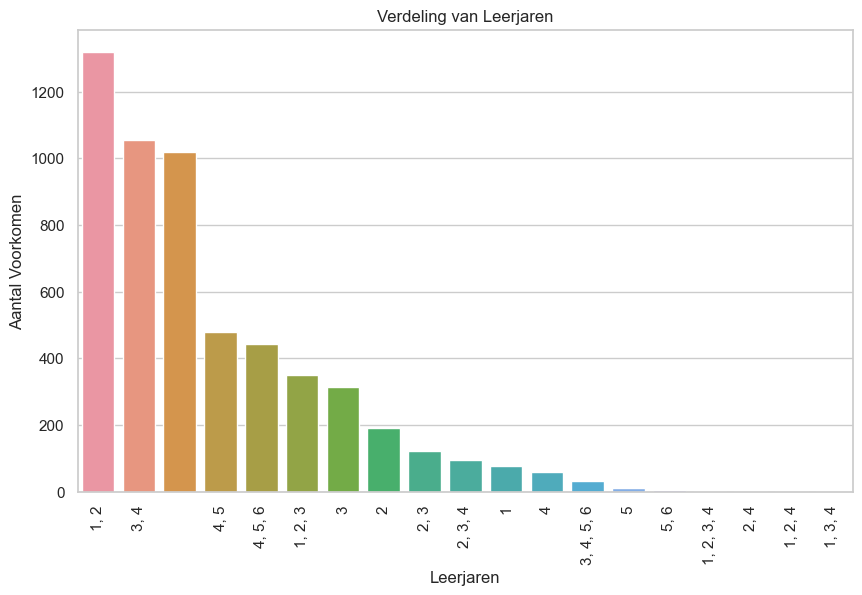

In [233]:
# Uitpakken van de leerjaren lijst en tellen
df_leerjaren = dataframe.explode('leerjaren')
leerjaar_count = df_leerjaren['leerjaren'].value_counts()

# Barplot van leerjaren
plt.figure(figsize=(10, 6))
sns.barplot(x=leerjaar_count.index, y=leerjaar_count.values)
plt.title('Verdeling van Leerjaren')
plt.xlabel('Leerjaren')
plt.ylabel('Aantal Voorkomen')
plt.xticks(rotation=90)
plt.show()

We zien dat veel jeerlaren samen zijn (1,2), deze moeten we dus splitten. 

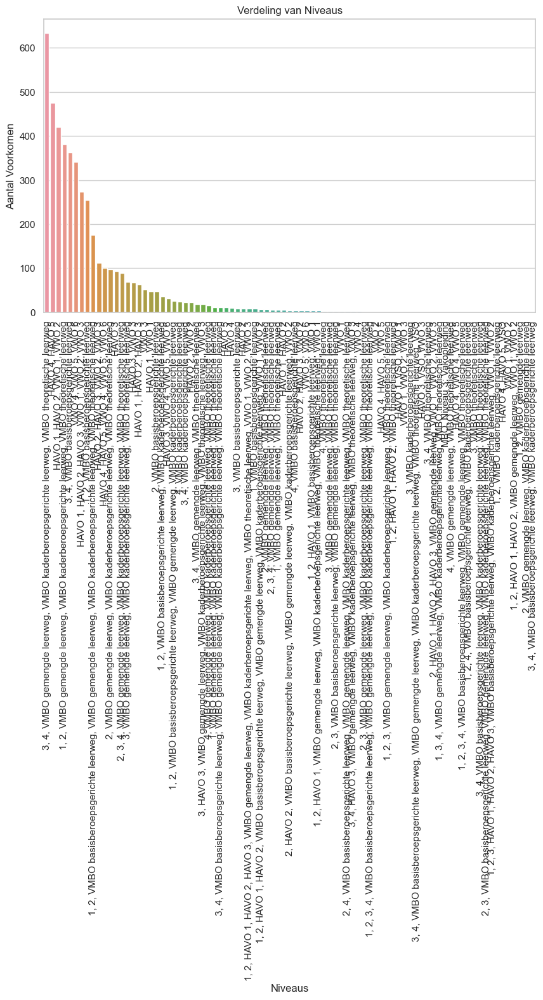

In [235]:
# Uitpakken van de niveaus lijst en tellen
df_niveaus = dataframe.explode('niveaus')
niveau_count = df_niveaus['niveaus'].value_counts()

# Barplot van niveaus
plt.figure(figsize=(10, 6))
sns.barplot(x=niveau_count.index, y=niveau_count.values)
plt.title('Verdeling van Niveaus')
plt.xlabel('Niveaus')
plt.ylabel('Aantal Voorkomen')
plt.xticks(rotation=90)
plt.show()

Hetzelfde geld voor niveaus. We moeten beide splitten.

# schoonmaken leerjaren kolom

In [238]:
dataframe = dataframe[~dataframe['leerjaren'].isna() & dataframe['leerjaren'].str.strip().astype(bool)]

dataframe.loc[:, 'leerjaren_split'] = dataframe['leerjaren'].apply(
    lambda x: [int(y.strip()) for y in x.split(',') if y.strip()]
)
dataframe.loc[:, 'niveaus_split'] = dataframe['niveaus'].apply(
    lambda x: [y.strip() for y in x.split(',')] if pd.notna(x) else []
)

print(dataframe)

                                                   text  \
0     Fotosynthese Intro Mensen moeten ademhalen om ...   
2     Plaattektoniek Vooraf In deze opdracht kijk je...   
9     Oefening: Ontwikkeling van de ongeboren baby B...   
10    Oefening: Tweelingen Bestudeer uit de Kennisba...   
12    Onderzoek doen: voorbeeld Intro Onderzoek is b...   
...                                                 ...   
7781  Aardrijkskunde vmbo12 De Stercollectie aardrij...   
7782  Aardrijkskunde h45 De Stercollectie aardrijksk...   
7783  Aardrijkskunde v456 De Stercollectie aardrijks...   
7784  Cellen en weefsels Kennisbank Alle organismen ...   
7785  START test Thema Grenzen en identiteit Inleidi...   

                                                  links  \
0     http://www.schooltv.nl/video/groenten-eten-van...   
2     https://drive.google.com/file/d/1F5ZbggMyJcIuy...   
9     https://maken.wikiwijs.nl/140676, https://docs...   
10    https://maken.wikiwijs.nl/140675, http://www.s...

# verdeling niveaus

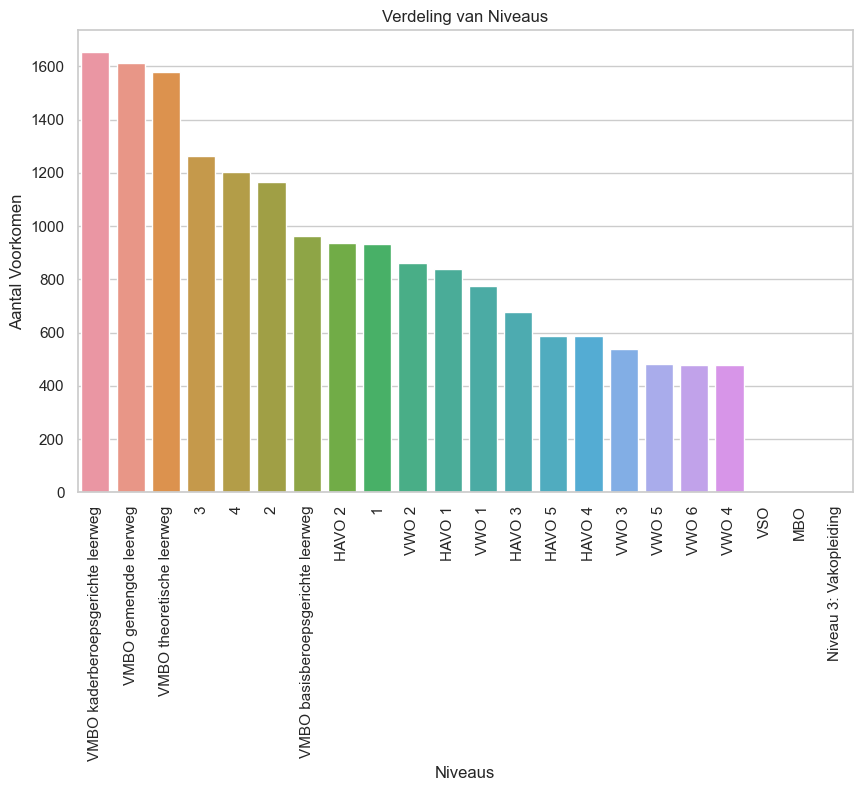

In [240]:
# Uitpakken van de niveaus lijst en tellen
df_niveaus = dataframe.explode('niveaus_split')
niveau_count = df_niveaus['niveaus_split'].value_counts()

# Barplot van niveaus
plt.figure(figsize=(10, 6))
sns.barplot(x=niveau_count.index, y=niveau_count.values)
plt.title('Verdeling van Niveaus')
plt.xlabel('Niveaus')
plt.ylabel('Aantal Voorkomen')
plt.xticks(rotation=90)
plt.show()

Nu hebben we alle metadata wat schoner gemaakt.

We gaan nu de tekst opschonen. dit doen we door stopworden weg te halen, SpellChecker te gebruiken en de tekst lowercase te maken, zo houden we alleen belangrijke woorden over en is de tekst uniform


In [243]:
import nltk
from nltk.corpus import stopwords
import string
from spellchecker import SpellChecker
import pandas as pd

# Download stopwords
try:
    nltk.download('stopwords')
except nltk.DownloadError:
    print("Error downloading stopwords. Please check your internet connection.")

# Initialize necessary components
stop_words = set(stopwords.words('dutch'))
spell = SpellChecker(language='nl')  # Optioneel: initialiseer spellchecker

def preprocess_text(text):
    if isinstance(text, str):
        text = text.lower()
        text = text.translate(str.maketrans('', '', string.punctuation + string.digits))  # Verwijder interpunctie en getallen
        text = ' '.join(text.split())  # Vervang meerdere spaties door één
        # Optioneel: spell checking (kan traag zijn voor grote datasets)
        # text = ' '.join([spell.correction(word) for word in text.split()])
        tokens = [word for word in text.split() if word not in stop_words]
        return ' '.join(tokens)
    else:
        return ''

# Apply preprocessing to the dataframe
dataframe['processed_text'] = dataframe['text'].apply(preprocess_text)


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\leeuw\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


we gaan we kijken naar de relevantie van ieder woord per vak, dit doen we met een tfifd vectorizer

In [245]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np

# TF-IDF Vectorization
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(dataframe['processed_text'])

# DataFrame met TF-IDF scores
tfidf_df = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())

# Toevoegen van 'vak' kolom
tfidf_df['vakken'] = dataframe['vakken'].values

# Functie om belangrijkste keywords te vinden per vak
def get_top_keywords_per_class(tfidf_df, valid_subjects, n=5):
    top_keywords = {}
    for vak in valid_subjects:
        # Filter rows belonging to the current subject
        vak_df = tfidf_df[tfidf_df['vakken'] == vak].drop(columns='vakken')
        if not vak_df.empty:
            # Calculate mean TF-IDF score per word for the current subject
            mean_tfidf = vak_df.mean(axis=0)
            top_keywords[vak] = mean_tfidf.sort_values(ascending=False).head(n).index.tolist()
        else:
            top_keywords[vak] = []
    return top_keywords

top_keywords_per_vak = get_top_keywords_per_class(tfidf_df, valid_subjects, n=5)
print(top_keywords_per_vak)


{'Aardrijkskunde': ['stap', 'kaart', 'klimaat', 'kaarten', 'nederland'], 'Biologie': ['thema', 'biologie', 'microscoop', 'stap', 'opdracht'], 'Duits': ['und', 'ich', 'du', 'duits', 'ist'], 'Economie': ['economie', 'overheid', 'geld', 'producten', 'thema'], 'Engels': ['the', 'to', 'you', 'and', 'step'], 'Geschiedenis': ['tijdvak', 'geschiedenis', 'oorlog', 'wereldoorlog', 'revolutie'], 'Informatica': ['systemen', 'data', 'systeem', 'we', 'html'], 'Nederlands': ['thema', 'grammatica', 'nederlands', 'opdracht', 'leerjaar'], 'Rekenen': [], 'Natuurkunde': ['nask', 'elektriciteit', 'dichtheid', 'stoffen', 'energie'], 'Scheikunde': ['scheikunde', 'reis', 'module', 'vocontent', 'chemie'], 'M&M': [], 'M&N': [], 'Maatschappij': []}


# Visualiseren

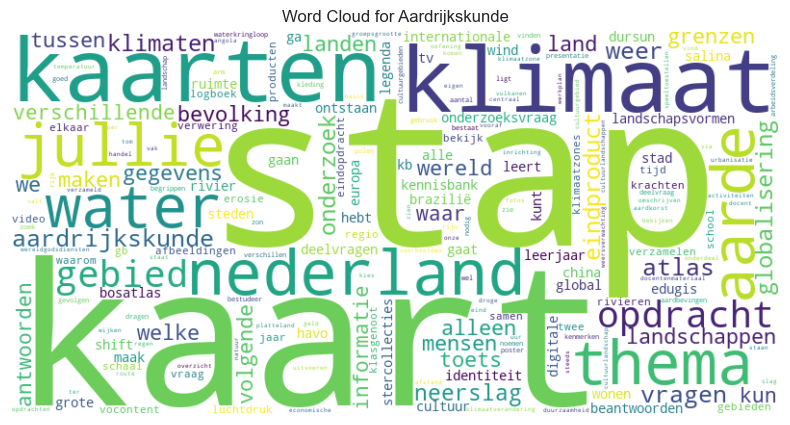

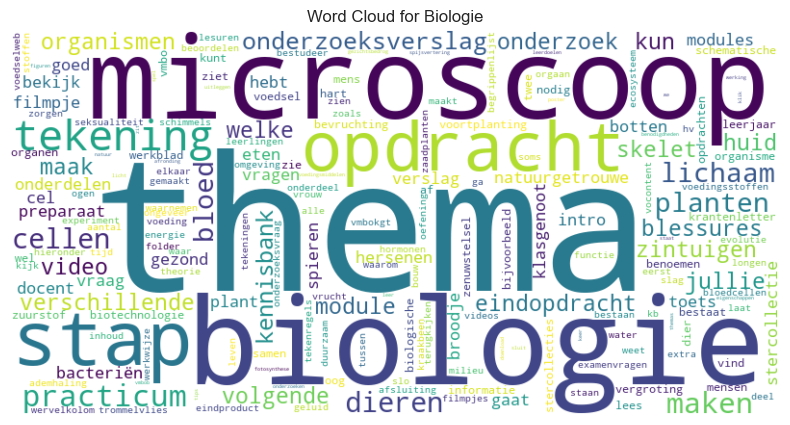

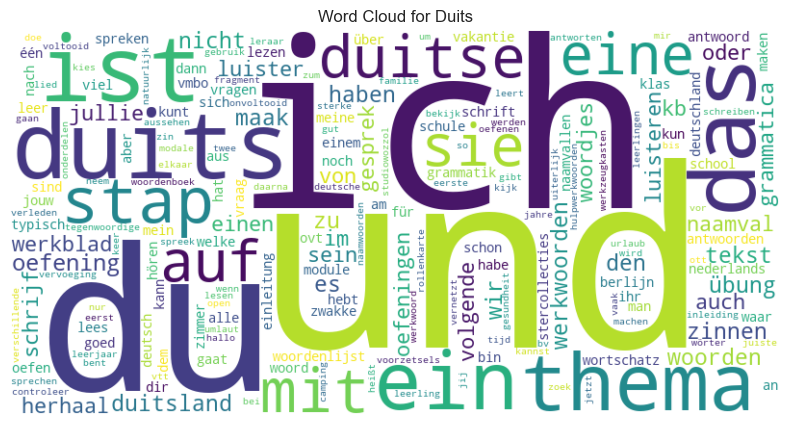

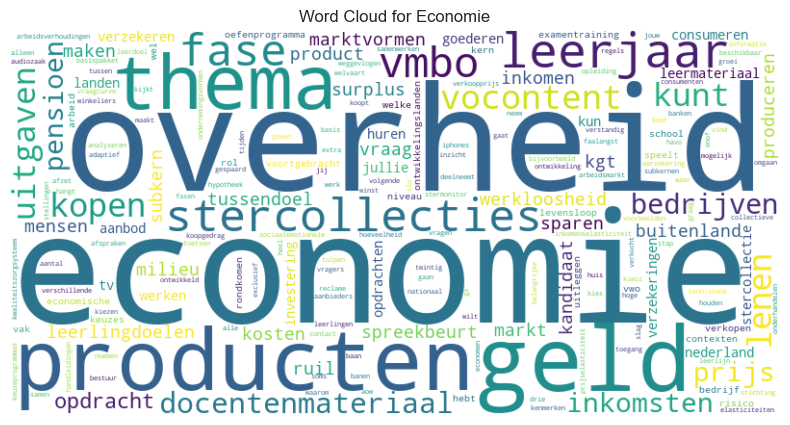

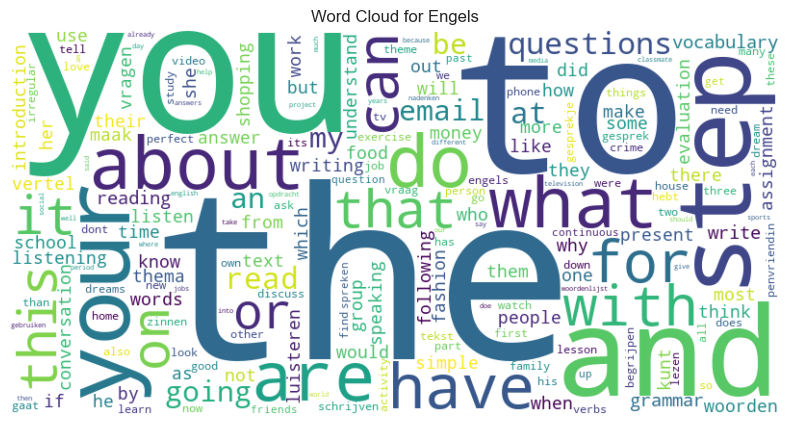

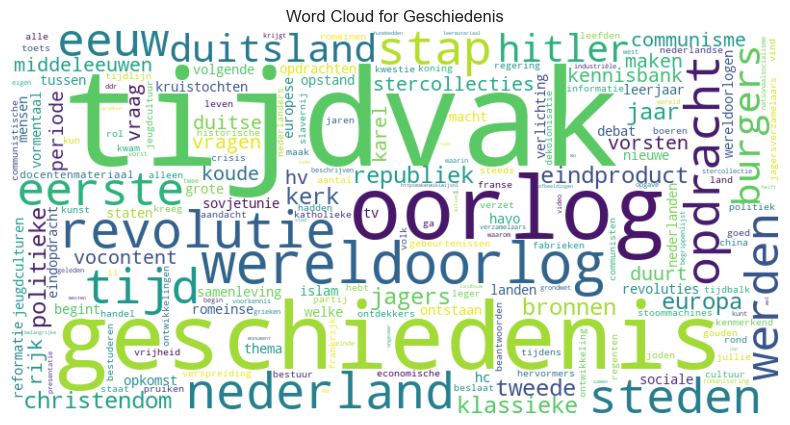

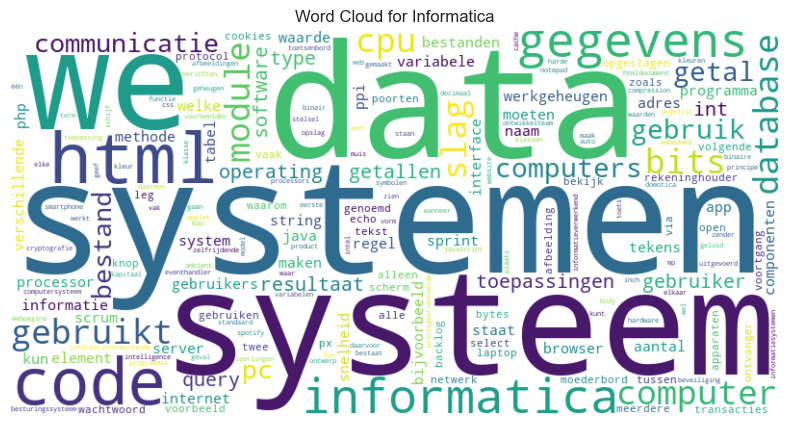

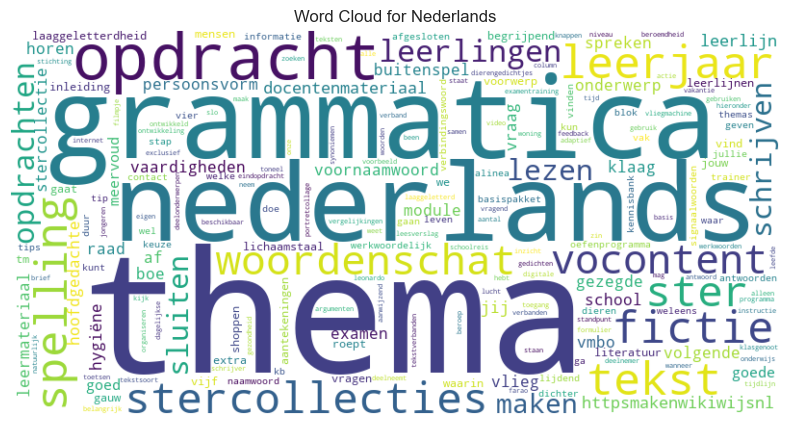

Geen data voor Rekenen, Word Cloud niet gegenereerd.


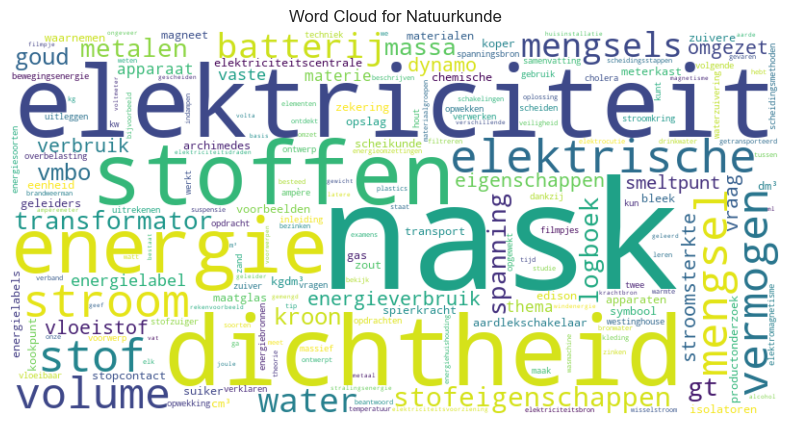

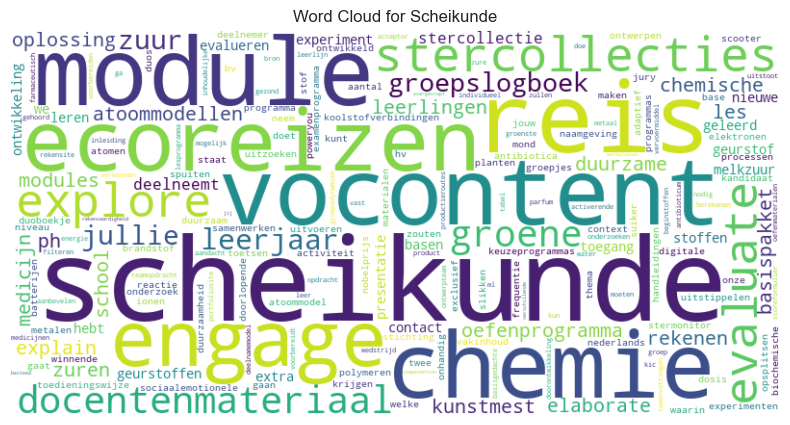

Geen data voor M&M, Word Cloud niet gegenereerd.
Geen data voor M&N, Word Cloud niet gegenereerd.
Geen data voor Maatschappij, Word Cloud niet gegenereerd.


In [247]:
# Output van top keywords per vak
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def plot_wordclouds(tfidf_df, valid_subjects):
    for vak in valid_subjects:
        vak_df = tfidf_df[tfidf_df['vakken'] == vak].drop(columns='vakken')
        if not vak_df.empty and vak_df.sum().sum() != 0:  # Controleer of het vak data bevat
            mean_tfidf = vak_df.mean(axis=0)
            wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(mean_tfidf)
            plt.figure(figsize=(10, 5))
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.title(f'Word Cloud for {vak}')
            plt.axis('off')
            plt.show()
        else:
            print(f"Geen data voor {vak}, Word Cloud niet gegenereerd.")

plot_wordclouds(tfidf_df, valid_subjects)

In [248]:
import pandas as pd

# Functie om belangrijkste keywords te vinden per vak
def get_top_keywords_per_class(tfidf_df, valid_subjects, n=5):
    top_keywords = {}
    for vak in valid_subjects:
        vak_df = tfidf_df[tfidf_df['vakken'] == vak].drop(columns='vakken')
        if not vak_df.empty:
            mean_tfidf = vak_df.mean(axis=0)
            top_keywords[vak] = mean_tfidf.sort_values(ascending=False).head(n).index.tolist()
        else:
            top_keywords[vak] = []
    return top_keywords

top_keywords_per_vak = get_top_keywords_per_class(tfidf_df, valid_subjects, n=4)

results_df = pd.DataFrame.from_dict(top_keywords_per_vak, orient='index', columns=[f'keyword_{i+1}' for i in range(4)])
print(results_df)

                 keyword_1      keyword_2   keyword_3     keyword_4
Aardrijkskunde        stap          kaart     klimaat       kaarten
Biologie             thema       biologie  microscoop          stap
Duits                  und            ich          du         duits
Economie          economie       overheid        geld     producten
Engels                 the             to         you           and
Geschiedenis       tijdvak   geschiedenis      oorlog  wereldoorlog
Informatica       systemen           data     systeem            we
Nederlands           thema     grammatica  nederlands      opdracht
Rekenen               None           None        None          None
Natuurkunde           nask  elektriciteit   dichtheid       stoffen
Scheikunde      scheikunde           reis      module     vocontent
M&M                   None           None        None          None
M&N                   None           None        None          None
Maatschappij          None           None       

---
<div style="background-color:white; text-align:center; vertical-align:middle; padding:50px 0; margin-top:5px; margin-bottom:5px">
    <h2 id="eda-title" style="color:black; font-family: Verdana, sans-serif; font-size: 25px;"><strong> H5: Data Cleaning </strong></h2>

</ul>

# Url cleanen

De link kolomn bevat soms erg nuttige info. Zo zien we bij de eerste link al wat staan over groenten en eten. Dit soort hyperlinks moeten we opschonen en gebruiken. De links over 'vo-content' en 'wikiwijs.nl' zeggen ons vaak wat minder. Deze verwijzen naar een hoofdpagina of een andere les.

In [252]:
def clean_urls(text):
    # Regex patroon voor url
    url_pattern = r'http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\\(\\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+'
    
    urls = re.findall(url_pattern, text)
    
    cleaned_urls = []
    
    for url in urls:
        # URL bevat 'wikiwijs', 'vo-content', or 'docs.google'
        if any(substring in url.lower() for substring in ['wikiwijs', 'vo-content', 'docs.google', 'drive google', 'drive.google, krachtincontrole']):
            continue
        
        # weghalen algemene componenten: https://, http://, www., .com, .org, .nl, query parameters
        url = re.sub(r'https?://|www\.|\.com|\.org|\.nl|(\?.*)', '', url) 
        
        # leestekens verplaatsen met spaties
        url = url.replace('/', ' ').replace('\\', ' ').replace('-', ' ').replace('.', ' ')
        url = url.replace('org', ' ').replace('html', ' ').replace('[', ' ').replace(']', ' ').replace('index', ' ')
        
        cleaned_urls.append(url.strip())
    
    return cleaned_urls

dataframe['cleaned_urls'] = dataframe['links'].apply(clean_urls)

print("Examples from dataframe:")
print(dataframe[['links', 'cleaned_urls']].head(10))

Examples from dataframe:
                                                links  \
0   http://www.schooltv.nl/video/groenten-eten-van...   
2   https://drive.google.com/file/d/1F5ZbggMyJcIuy...   
9   https://maken.wikiwijs.nl/140676, https://docs...   
10  https://maken.wikiwijs.nl/140675, http://www.s...   
12                                                      
13  https://docs.google.com/document/d/1OQvrmIYk1c...   
14              http://nl.wikipedia.org/wiki/Bosatlas   
15  http://www.edugis.nl, http://www.edugis.nl/les...   
16  https://maken.wikiwijs.nl/129338, https://make...   
17  https://maken.wikiwijs.nl/129204, https://make...   

                                         cleaned_urls  
0   [schooltv video groenten eten van welke plant ...  
2   [drive google file d 1F5ZbggMyJcIuyYsEa3IiNLiW...  
9   [schooltv video ontwikkeling ongeboren baby ee...  
10  [schooltv video tweelingen er zijn eeneiige en...  
12                                                 []  
13         

In [253]:
dataframe['links'] = dataframe['cleaned_urls']

De cleaned_urls ziet er nu beter uit. We zien bijvoorbeeld bij de eerste les goede informatie over groenten, eten en planten wat ons betere inzicht geeft in de les.

In [255]:
dataframe['links']

0       [schooltv video groenten eten van welke plant ...
2       [drive google file d 1F5ZbggMyJcIuyYsEa3IiNLiW...
9       [schooltv video ontwikkeling ongeboren baby ee...
10      [schooltv video tweelingen er zijn eeneiige en...
12                                                     []
                              ...                        
7781                                 [krachtincontrole ,]
7782                                 [krachtincontrole ,]
7783                                 [krachtincontrole ,]
7784                                                   []
7785    [schooltv beeldbank embedded jsp, totaalinburg...
Name: links, Length: 4556, dtype: object

hier een gedetailleerde uitleg over de code

 Een lijst met kolomnamen (columns_to_add) wordt gedefinieerd. Deze kolommen bevatten de gegevens die we willen combineren.

 De functie combine_columns wordt gemaakt. Deze functie neemt een rij van de DataFrame als invoer en combineert de waarden van de opgegeven kolommen tot één string, gescheiden door spaties. Alleen niet-lege waarden worden toegevoegd.

 De functie combine_columns wordt toegepast op elke rij van de DataFrame met behulp van apply, en het resultaat wordt opgeslagen in een nieuwe kolom genaamd text.
 
en aan het einde wordt de inhoud van de eerste paar rijen van de nieuwe kolom text weergegeven met display.


In [257]:
def convert_lists_to_string(row):
    if isinstance(row['links'], list):
        row['links'] = ' '.join(row['links'])
    return row

dataframe = dataframe.apply(convert_lists_to_string, axis=1)

print(dataframe['links'].head())

0     schooltv video groenten eten van welke plant e...
2     drive google file d 1F5ZbggMyJcIuyYsEa3IiNLiW9...
9     schooltv video ontwikkeling ongeboren baby een...
10    schooltv video tweelingen er zijn eeneiige en ...
12                                                     
Name: links, dtype: object


hier maken we code die de tekst bewerkt en schoon maakt. Het downloadt Nederlandse stopwoorden met nltk en gebruikt een optionele spellchecker. De functie preprocess_text zet tekst om naar kleine letters, verwijdert interpunctie en cijfers, vervangt meerdere spaties door één spatie, en verwijdert stopwoorden. Deze functie wordt toegepast op de text kolom van de dataframe en slaat de resultaten op in een nieuwe kolom processed_text. hierdoor houden alleen de tekst over dat  bruikbaar en relevant is.

hier een gedetailleerde uitleg over de code

**Downloaden van stopwoorden:**
De stopwords van NLTK worden gedownload. Als dit mislukt, wordt een foutmelding weergegeven.

**Initialiseren van noodzakelijke componenten:**
De set van Nederlandse stopwoorden wordt geladen.
De spellingscontrole (optioneel) wordt geïnitialiseerd.

**Definiëren van de preprocess_text functie:**

Controleer of de invoer een string is.

Zet de tekst om naar kleine letters.

Verwijder interpunctie en cijfers.

Vervang meerdere spaties door één enkele spatie.

(Optioneel) Spellingscontrole op elk woord (kan traag zijn bij grote datasets).

Verwijder stopwoorden.

Combineer de bewerkte woorden terug tot één string.

**Toepassen van de preprocess_text functie op de DataFrame:**
De functie preprocess_text wordt toegepast op de kolom text van de DataFrame en het resultaat wordt opgeslagen in een nieuwe kolom processed_text.

**Weergeven van de DataFrame:**
De aangepaste DataFrame wordt afgedrukt om de resultaten te tonen.


 we runnen deze code opnieuw sinds we wat aanpassingen hebben gemaakt en we nu opnieuw deze cleaning uit moeten voeren

In [261]:
import nltk
from nltk.corpus import stopwords
import string
from spellchecker import SpellChecker # Optioneel: voor spell checking
import pandas as pd

# Download stopwords
try:
    nltk.download('stopwords')
except nltk.DownloadError:
    print("Error downloading stopwords. Please check your internet connection.")

# Initialize necessary components
stop_words = set(stopwords.words('dutch'))
spell = SpellChecker(language='nl')  # Optioneel: initialiseer spellchecker

def preprocess_text(text):
    if isinstance(text, str):
        text = text.lower()
        text = text.translate(str.maketrans('', '', string.punctuation + string.digits))  # Verwijder interpunctie en getallen
        text = ' '.join(text.split())  # Vervang meerdere spaties door één
        # Optioneel: spell checking (kan traag zijn voor grote datasets)
        # text = ' '.join([spell.correction(word) for word in text.split()])
        tokens = [word for word in text.split() if word not in stop_words]
        return ' '.join(tokens)
    else:
        return ''

dataframe['processed_text'] = dataframe['text'].apply(preprocess_text)

print(dataframe)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\leeuw\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


                                                   text  \
0     Fotosynthese Intro Mensen moeten ademhalen om ...   
2     Plaattektoniek Vooraf In deze opdracht kijk je...   
9     Oefening: Ontwikkeling van de ongeboren baby B...   
10    Oefening: Tweelingen Bestudeer uit de Kennisba...   
12    Onderzoek doen: voorbeeld Intro Onderzoek is b...   
...                                                 ...   
7781  Aardrijkskunde vmbo12 De Stercollectie aardrij...   
7782  Aardrijkskunde h45 De Stercollectie aardrijksk...   
7783  Aardrijkskunde v456 De Stercollectie aardrijks...   
7784  Cellen en weefsels Kennisbank Alle organismen ...   
7785  START test Thema Grenzen en identiteit Inleidi...   

                                                  links  \
0     schooltv video groenten eten van welke plant e...   
2     drive google file d 1F5ZbggMyJcIuyYsEa3IiNLiW9...   
9     schooltv video ontwikkeling ongeboren baby een...   
10    schooltv video tweelingen er zijn eeneiige en ...

hier gaan we weer verder met schoon maken van de data. Eerst worden de vakken schoongemaakt en opgeslagen in cleaned_vakken, waarna rijen met ontbrekende waarden worden verwijderd. Vervolgens wordt de functie remove_numbers aangemaakt om getallen en dubbele komma's te verwijderen. Deze functie wordt toegepast op de kolom niveaus.

hier een gedetailleerde uitleg over de code

**Opschonen van de kolom vakken:**

clean_vakken is een functie die de waarden in de kolom vakken opschoont, waarbij alleen geldige vakken (valid_subjects) behouden blijven.
De geschoonde waarden worden opgeslagen in een nieuwe kolom cleaned_vakken.

Rijen zonder waarde in de kolom cleaned_vakken worden verwijderd met dropna.

Er wordt een assertie gedaan om te controleren of het aantal rijen in dataframe na het opschonen van vakken hetzelfde is gebleven.

**Verwerken van de kolom processed_text:**

De geschoonde tekst wordt omgezet naar een lijst texts.

**Definiëren van de functie remove_numbers:**

Deze functie verwijdert alle cijfers uit de gegeven tekst.

Dubbele komma's (na het verwijderen van cijfers) worden vervangen door een enkele komma met een spatie.

Overbodige komma's aan het begin en einde van de tekst worden verwijderd.

**Toepassen van remove_numbers op de kolom niveaus:**

De functie remove_numbers wordt toegepast op de kolom niveaus, waarbij getallen uit de tekst worden verwijderd en het resultaat wordt opgeslagen in dezelfde kolom.

**Weergeven van de aangepaste DataFrame:**

De aangepaste DataFrame wordt weergegeven om de resultaten te tonen.

Deze stappen zorgen ervoor dat zowel de vakken als de niveaus correct zijn opgeschoond en dat de DataFrame geen ongeldige of overbodige informatie bevat.

In [264]:
dataframe['cleaned_vakken'] = clean_vakken(dataframe['vakken'].tolist(), valid_subjects)
dataframe = dataframe.dropna(subset=['cleaned_vakken'])
assert len(dataframe['cleaned_vakken']) == len(dataframe), "Mismatch in lengths after cleaning vakken"
texts = dataframe['processed_text'].tolist()
def remove_numbers(text):
    text_no_numbers = re.sub(r'\d+', '', text)
    text_cleaned = re.sub(r',\s*,', ', ', text_no_numbers)
    text_cleaned = text_cleaned.strip(', ')
    return text_cleaned


column_name = 'niveaus'
dataframe[column_name] = dataframe[column_name].apply(remove_numbers)
dataframe



,text,links,images,vakken,leerjaren,niveaus,document_authors,uuid,document_date,bulk_id,identifier,title,description,last_modified_date,date_created,published,publisher,team,license,web_address,eindgebruiker,studiebelasting,trefwoorden,text_length,word_count,sentence_count,web_address_length,cleaned_vakken,leerjaren_split,niveaus_split,processed_text,cleaned_urls
0,Fotosynthese Intro Mensen moeten ademhalen om ...,schooltv video groenten eten van welke plant e...,https://maken.wikiwijs.nl/userfiles/e/edc25200...,"Biologie, Groei en ontwikkeling, Instandhoudin...","1, 2","VMBO gemengde leerweg, VMBO kaderberoepsgerich...","content VO-, Christine Vos",None,2022-07-27 15:25:32+00:00,bulk-17041135-refresh_all,100024,Fotosynthese vmbo-kgt12,,2022-07-27 15:25:32+02:00,2017-04-12 10:53:26+00:00,True,VO-content,VO-content - Gereedschapskist,CC Naamsvermelding-GelijkDelen 3.0 Nederland l...,https://maken.wikiwijs.nl/100655/,leerling/student,3 uur en 0 minuten,"leerlijn, rearrangeerbare",6058,935,83,33,Biologie,"[1, 2]","[1, 2, VMBO gemengde leerweg, VMBO kaderberoep...",fotosynthese intro mensen moeten ademhalen hel...,[schooltv video groenten eten van welke plant ...
2,Plaattektoniek Vooraf In deze opdracht kijk je...,drive google file d 1F5ZbggMyJcIuyYsEa3IiNLiW9...,https://maken.wikiwijs.nl/userfiles/8/8ba978ea...,"Aardrijkskunde, Endogene processen, Relaties t...","1, 2","HAVO , HAVO , VWO , VWO","content VO-, Auteur Kunskapsskolan, Leontine d...",None,2023-11-07 09:01:56+00:00,bulk-17041135-refresh_all,100051,Plaattektoniek hv123,Bij het samenstellen van deze leerbron is gebr...,2023-11-07 09:01:56+01:00,2017-04-13 09:08:18+00:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100699/,leerling/student,2 uur en 0 minuten,,8884,1451,127,33,Aardrijkskunde,"[1, 2]","[HAVO 1, HAVO 2, VWO 1, VWO 2]",plaattektoniek vooraf opdracht kijk opbouw aar...,[drive google file d 1F5ZbggMyJcIuyYsEa3IiNLiW...
9,Oefening: Ontwikkeling van de ongeboren baby B...,schooltv video ontwikkeling ongeboren baby een...,https://maken.wikiwijs.nl/bestanden/504291/sta...,"Biologie, Reproductie, Reproductie en evolutie",2,"HAVO , VWO","content VO-, Auteur Kunskapsskolan",None,2019-08-08 11:45:12+00:00,bulk-17041135-refresh_all,100554,Bevruchting hv12,Bij het samenstellen van deze leerbron is gebr...,2019-08-08 11:45:12+02:00,2017-04-24 13:20:24+00:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100707/,leerling/student,2 uur en 0 minuten,,1558,251,18,33,Biologie,[2],"[HAVO 2, VWO 2]",oefening ontwikkeling ongeboren baby bestudeer...,[schooltv video ontwikkeling ongeboren baby ee...
10,Oefening: Tweelingen Bestudeer uit de Kennisba...,schooltv video tweelingen er zijn eeneiige en ...,https://maken.wikiwijs.nl/bestanden/504295/sta...,"Biologie, Reproductie, Reproductie en evolutie",2,"HAVO , VWO","content VO-, Auteur Kunskapsskolan",None,2019-08-08 11:49:05+00:00,bulk-17041135-refresh_all,100555,Bevruchting hv12 - kopie 1,Bij het samenstellen van deze leerbron is gebr...,2019-08-08 11:49:05+02:00,2017-04-24 13:23:46+00:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100708/,leerling/student,2 uur en 0 minuten,,511,78,6,33,Biologie,[2],"[HAVO 2, VWO 2]",oefening tweelingen bestudeer kennisbank biolo...,[schooltv video tweelingen er zijn eeneiige en...
12,Onderzoek doen: voorbeeld Intro Onderzoek is b...,,https://maken.wikiwijs.nl/userfiles/b/b906aa8e...,Aardrijkskunde,"1, 2","VMBO basisberoepsgerichte leerweg, VMBO gemeng...","Linda B, content VO-, manon van Rijn, lobke",None,2023-08-19 13:37:33+00:00,bulk-17041135-refresh_all,100698,Onderzoek doen: voorbeeld vmbo12,Dit thema valt onder de arrangeerbare leerlijn...,2023-08-19 13:37:33+02:00,2017-05-01 09:24:31+00:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation

hier halen we de niveaus uit de kolommen title, description, en links van een dataframe, verbeteren we de gevonden niveaus en verwijdert we ze uit de tekst van die kolommen. Vervolgens slaan we het niveau op in de kolom niveaus.
Eerst wordt een regex-patroon (niveau_pattern) gemaakt om niveaus zoals vmbo, havo, vwo en hun varianten te herkennen. De functie extract_and_correct_niveau zoekt naar matches in de genoemde kolommen. Als er een match wordt gevonden, wordt het niveau opgeslagen in de kolom niveaus en verwijderd uit de oorspronkelijke tekst van de kolom. Deze functie wordt toegepast op elke rij van de dataframe en geeft daarna de verbeterde dataframe.

hier een gedetailleerde uitleg over de code

**Definiëren van het patroon voor niveaus:**

niveau_pattern is een reguliere expressie die zoekt naar niveaus (vmbo, havo, vwo) en eventuele specificaties zoals -kgt en cijfers (bijv. vmbo-kgt2).

**Definiëren van de functie extract_and_correct_niveau:**

Deze functie neemt een rij uit de DataFrame als invoer.

Het zoekt naar het patroon niveau_pattern in de kolommen title, description, en links met behulp van re.search.

**Extractie en correctie van niveaus:**

Als er een match wordt gevonden in title, wordt het gevonden niveau opgeslagen in de kolom niveaus en wordt het niveau verwijderd uit de title tekst.

Als er een match wordt gevonden in description, wordt het gevonden niveau opgeslagen in de kolom niveaus en wordt het niveau verwijderd uit de description tekst.

Als er een match wordt gevonden in links, wordt het gevonden niveau opgeslagen in de kolom niveaus en wordt het niveau verwijderd uit de links tekst.

Deze correcties zorgen ervoor dat duplicatie wordt vermeden en de niveaus correct worden bijgewerkt in de kolom niveaus.

**Toepassen van de functie op de DataFrame:**

De functie extract_and_correct_niveau wordt toegepast op elke rij van de DataFrame met behulp van apply.

Het resultaat wordt opgeslagen in de variabele df.

**Weergeven van de aangepaste DataFrame:**

De aangepaste DataFrame df wordt weergegeven om de resultaten te tonen.

Deze aanpak zorgt ervoor dat niveaus nauwkeurig worden geïdentificeerd en gecorrigeerd in de gegevens, waardoor de DataFrame nauwkeuriger en beter georganiseerd wordt.

In [267]:

niveau_pattern = r'\b(vmbo|havo|vwo)(-?kgt|)?(\d{1,2})?\b'

def extract_and_correct_niveau(row):
    title_match = re.search(niveau_pattern, row['title'])
    description_match = re.search(niveau_pattern, row['description'])
    link_match = re.search(niveau_pattern, row['links'])
   
    if title_match:
        niveau = title_match.group()
        row['niveaus'] = niveau
        row['title'] = re.sub(niveau_pattern, '', row['title']).strip()
    
    if description_match:
        niveau = description_match.group()
        row['niveaus'] = niveau
        row['description'] = re.sub(niveau_pattern, '', row['description']).strip()

    if link_match:
        niveau = link_match.group()
        row['niveaus'] = niveau
        row['links'] = re.sub(niveau_pattern, '', row['links']).strip()


    return row

df = dataframe.apply(extract_and_correct_niveau, axis=1)

df

,text,links,images,vakken,leerjaren,niveaus,document_authors,uuid,document_date,bulk_id,identifier,title,description,last_modified_date,date_created,published,publisher,team,license,web_address,eindgebruiker,studiebelasting,trefwoorden,text_length,word_count,sentence_count,web_address_length,cleaned_vakken,leerjaren_split,niveaus_split,processed_text,cleaned_urls
0,Fotosynthese Intro Mensen moeten ademhalen om ...,schooltv video groenten eten van welke plant e...,https://maken.wikiwijs.nl/userfiles/e/edc25200...,"Biologie, Groei en ontwikkeling, Instandhoudin...","1, 2",vmbo-kgt12,"content VO-, Christine Vos",None,2022-07-27 15:25:32+00:00,bulk-17041135-refresh_all,100024,Fotosynthese,,2022-07-27 15:25:32+02:00,2017-04-12 10:53:26+00:00,True,VO-content,VO-content - Gereedschapskist,CC Naamsvermelding-GelijkDelen 3.0 Nederland l...,https://maken.wikiwijs.nl/100655/,leerling/student,3 uur en 0 minuten,"leerlijn, rearrangeerbare",6058,935,83,33,Biologie,"[1, 2]","[1, 2, VMBO gemengde leerweg, VMBO kaderberoep...",fotosynthese intro mensen moeten ademhalen hel...,[schooltv video groenten eten van welke plant ...
2,Plaattektoniek Vooraf In deze opdracht kijk je...,drive google file d 1F5ZbggMyJcIuyYsEa3IiNLiW9...,https://maken.wikiwijs.nl/userfiles/8/8ba978ea...,"Aardrijkskunde, Endogene processen, Relaties t...","1, 2","HAVO , HAVO , VWO , VWO","content VO-, Auteur Kunskapsskolan, Leontine d...",None,2023-11-07 09:01:56+00:00,bulk-17041135-refresh_all,100051,Plaattektoniek hv123,Bij het samenstellen van deze leerbron is gebr...,2023-11-07 09:01:56+01:00,2017-04-13 09:08:18+00:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100699/,leerling/student,2 uur en 0 minuten,,8884,1451,127,33,Aardrijkskunde,"[1, 2]","[HAVO 1, HAVO 2, VWO 1, VWO 2]",plaattektoniek vooraf opdracht kijk opbouw aar...,[drive google file d 1F5ZbggMyJcIuyYsEa3IiNLiW...
9,Oefening: Ontwikkeling van de ongeboren baby B...,schooltv video ontwikkeling ongeboren baby een...,https://maken.wikiwijs.nl/bestanden/504291/sta...,"Biologie, Reproductie, Reproductie en evolutie",2,"HAVO , VWO","content VO-, Auteur Kunskapsskolan",None,2019-08-08 11:45:12+00:00,bulk-17041135-refresh_all,100554,Bevruchting hv12,Bij het samenstellen van deze leerbron is gebr...,2019-08-08 11:45:12+02:00,2017-04-24 13:20:24+00:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100707/,leerling/student,2 uur en 0 minuten,,1558,251,18,33,Biologie,[2],"[HAVO 2, VWO 2]",oefening ontwikkeling ongeboren baby bestudeer...,[schooltv video ontwikkeling ongeboren baby ee...
10,Oefening: Tweelingen Bestudeer uit de Kennisba...,schooltv video tweelingen er zijn eeneiige en ...,https://maken.wikiwijs.nl/bestanden/504295/sta...,"Biologie, Reproductie, Reproductie en evolutie",2,"HAVO , VWO","content VO-, Auteur Kunskapsskolan",None,2019-08-08 11:49:05+00:00,bulk-17041135-refresh_all,100555,Bevruchting hv12 - kopie 1,Bij het samenstellen van deze leerbron is gebr...,2019-08-08 11:49:05+02:00,2017-04-24 13:23:46+00:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100708/,leerling/student,2 uur en 0 minuten,,511,78,6,33,Biologie,[2],"[HAVO 2, VWO 2]",oefening tweelingen bestudeer kennisbank biolo...,[schooltv video tweelingen er zijn eeneiige en...
12,Onderzoek doen: voorbeeld Intro Onderzoek is b...,,https://maken.wikiwijs.nl/userfiles/b/b906aa8e...,Aardrijkskunde,"1, 2",vmbo12,"Linda B, content VO-, manon van Rijn, lobke",None,2023-08-19 13:37:33+00:00,bulk-17041135-refresh_all,100698,Onderzoek doen: voorbeeld,Dit thema valt onder de arrangeerbare leerlijn...,2023-08-19 13:37:33+02:00,2017-05-01 09:24:31+00:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100710/,leerling/student,1 uur en 0 minuten,"aardrijkskunde, arrangeerbaar


hier verwijderen we de duplicaten uit de kolom niveaus van de dataframe en zorgen we ervoor dat alle waarden netjes zijn gestript van overbodige spaties. Eerst wordt een functie remove_duplicates gedefinieerd die een lijst maakt van unieke waarden door duplicaten te negeren en elke waarde schoon te maken. Deze functie wordt vervolgens toegepast op de niveaus kolom van de dataframe en worden eventuele resterende spaties uit de waarden in niveaus verwijderd. dit doen we zodat we geen overbodige troep hebben in onze data.

hier een gedetailleerde uitleg over de code

**Definiëren van de functie remove_duplicates:**

Deze functie neemt een string van niveaus, gescheiden door komma's, als invoer.

Het splitst de string in een lijst van niveaus en verwijdert eventuele overtollige spaties rondom de niveaus.

Het maakt gebruik van een set (seen) om unieke niveaus bij te houden.

Door de lijst van niveaus te doorlopen, worden unieke niveaus toegevoegd aan een nieuwe lijst (unique_niveaus).

De unieke niveaus worden weer samengevoegd tot een enkele string, gescheiden door komma's, en geretourneerd.


**Toepassen van remove_duplicates op de kolom niveaus:**

De functie remove_duplicates wordt toegepast op elke rij in de kolom niveaus met behulp van apply.

Na het verwijderen van duplicaten worden eventuele overgebleven spaties aan het begin en einde van de strings verwijderd met str.strip().


**Weergeven van de aangepaste DataFrame:**

De aangepaste DataFrame df wordt weergegeven om de resultaten te tonen.


Deze stappen zorgen ervoor dat de kolom niveaus geen dubbele of onnodige spaties meer bevat, waardoor de gegevens consistenter en netter zijn.

In [270]:
def remove_duplicates(niveaus):
    niveaus_list = [niveau.strip() for niveau in niveaus.split(',')]
    seen = set()
    unique_niveaus = []
    for niveau in niveaus_list:
        if niveau not in seen:
            unique_niveaus.append(niveau)
            seen.add(niveau)
    return ', '.join(unique_niveaus)

df['niveaus'] = df['niveaus'].apply(remove_duplicates)
df['niveaus'] = df['niveaus'].str.strip()

df

,text,links,images,vakken,leerjaren,niveaus,document_authors,uuid,document_date,bulk_id,identifier,title,description,last_modified_date,date_created,published,publisher,team,license,web_address,eindgebruiker,studiebelasting,trefwoorden,text_length,word_count,sentence_count,web_address_length,cleaned_vakken,leerjaren_split,niveaus_split,processed_text,cleaned_urls
0,Fotosynthese Intro Mensen moeten ademhalen om ...,schooltv video groenten eten van welke plant e...,https://maken.wikiwijs.nl/userfiles/e/edc25200...,"Biologie, Groei en ontwikkeling, Instandhoudin...","1, 2",vmbo-kgt12,"content VO-, Christine Vos",None,2022-07-27 15:25:32+00:00,bulk-17041135-refresh_all,100024,Fotosynthese,,2022-07-27 15:25:32+02:00,2017-04-12 10:53:26+00:00,True,VO-content,VO-content - Gereedschapskist,CC Naamsvermelding-GelijkDelen 3.0 Nederland l...,https://maken.wikiwijs.nl/100655/,leerling/student,3 uur en 0 minuten,"leerlijn, rearrangeerbare",6058,935,83,33,Biologie,"[1, 2]","[1, 2, VMBO gemengde leerweg, VMBO kaderberoep...",fotosynthese intro mensen moeten ademhalen hel...,[schooltv video groenten eten van welke plant ...
2,Plaattektoniek Vooraf In deze opdracht kijk je...,drive google file d 1F5ZbggMyJcIuyYsEa3IiNLiW9...,https://maken.wikiwijs.nl/userfiles/8/8ba978ea...,"Aardrijkskunde, Endogene processen, Relaties t...","1, 2","HAVO, VWO","content VO-, Auteur Kunskapsskolan, Leontine d...",None,2023-11-07 09:01:56+00:00,bulk-17041135-refresh_all,100051,Plaattektoniek hv123,Bij het samenstellen van deze leerbron is gebr...,2023-11-07 09:01:56+01:00,2017-04-13 09:08:18+00:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100699/,leerling/student,2 uur en 0 minuten,,8884,1451,127,33,Aardrijkskunde,"[1, 2]","[HAVO 1, HAVO 2, VWO 1, VWO 2]",plaattektoniek vooraf opdracht kijk opbouw aar...,[drive google file d 1F5ZbggMyJcIuyYsEa3IiNLiW...
9,Oefening: Ontwikkeling van de ongeboren baby B...,schooltv video ontwikkeling ongeboren baby een...,https://maken.wikiwijs.nl/bestanden/504291/sta...,"Biologie, Reproductie, Reproductie en evolutie",2,"HAVO, VWO","content VO-, Auteur Kunskapsskolan",None,2019-08-08 11:45:12+00:00,bulk-17041135-refresh_all,100554,Bevruchting hv12,Bij het samenstellen van deze leerbron is gebr...,2019-08-08 11:45:12+02:00,2017-04-24 13:20:24+00:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100707/,leerling/student,2 uur en 0 minuten,,1558,251,18,33,Biologie,[2],"[HAVO 2, VWO 2]",oefening ontwikkeling ongeboren baby bestudeer...,[schooltv video ontwikkeling ongeboren baby ee...
10,Oefening: Tweelingen Bestudeer uit de Kennisba...,schooltv video tweelingen er zijn eeneiige en ...,https://maken.wikiwijs.nl/bestanden/504295/sta...,"Biologie, Reproductie, Reproductie en evolutie",2,"HAVO, VWO","content VO-, Auteur Kunskapsskolan",None,2019-08-08 11:49:05+00:00,bulk-17041135-refresh_all,100555,Bevruchting hv12 - kopie 1,Bij het samenstellen van deze leerbron is gebr...,2019-08-08 11:49:05+02:00,2017-04-24 13:23:46+00:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100708/,leerling/student,2 uur en 0 minuten,,511,78,6,33,Biologie,[2],"[HAVO 2, VWO 2]",oefening tweelingen bestudeer kennisbank biolo...,[schooltv video tweelingen er zijn eeneiige en...
12,Onderzoek doen: voorbeeld Intro Onderzoek is b...,,https://maken.wikiwijs.nl/userfiles/b/b906aa8e...,Aardrijkskunde,"1, 2",vmbo12,"Linda B, content VO-, manon van Rijn, lobke",None,2023-08-19 13:37:33+00:00,bulk-17041135-refresh_all,100698,Onderzoek doen: voorbeeld,Dit thema valt onder de arrangeerbare leerlijn...,2023-08-19 13:37:33+02:00,2017-05-01 09:24:31+00:00,True,VO-content,VO-content Aardrijkskunde,CC Naamsvermelding-GelijkDelen 4.0 Internation...,https://maken.wikiwijs.nl/100710/,leerling/student,1 uur en 0 minuten,"aardrijkskunde, arrangeerbaar, deelvraag, hoo

In [271]:
df.head()

df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 4556 entries, 0 to 7785
Data columns (total 32 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   text                4556 non-null   object             
 1   links               4556 non-null   object             
 2   images              4556 non-null   object             
 3   vakken              4556 non-null   object             
 4   leerjaren           4556 non-null   object             
 5   niveaus             4556 non-null   object             
 6   document_authors    4556 non-null   object             
 7   uuid                0 non-null      object             
 8   document_date       4556 non-null   datetime64[ns, UTC]
 9   bulk_id             4493 non-null   object             
 10  identifier          4556 non-null   int64              
 11  title               4556 non-null   object             
 12  description         4556 non-null 

In [272]:
# Generate summary statistics for numerical columns
df.describe()


,identifier,text_length,word_count,sentence_count,web_address_length
count,4556.000000,4556.000000,4556.000000,4556.000000,4556.000000
mean,113446.014047,11599.047629,1866.218174,151.199298,28.764486
std,38912.557879,15931.596833,2533.451201,194.037975,10.269137
min,52253.000000,0.000000,0.000000,0.000000,0.000000
25%,74625.750000,4944.000000,797.000000,69.000000,32.000000
50%,113242.000000,7097.000000,1166.000000,98.000000,32.000000
75%,151557.250000,11122.000000,1784.000000,140.000000,33.000000
max,189712.000000,183507.000000,29147.000000,2091.000000,33.000000


In [273]:
missing_values = df.isnull().sum()
missing_values

data_types = df.dtypes
data_types


text                               object
links                              object
images                             object
vakken                             object
leerjaren                          object
niveaus                            object
document_authors                   object
uuid                               object
document_date         datetime64[ns, UTC]
bulk_id                            object
identifier                          int64
title                              object
description                        object
last_modified_date                 object
date_created          datetime64[ns, UTC]
published                            bool
publisher                          object
team                               object
license                            object
web_address                        object
eindgebruiker                      object
studiebelasting                    object
trefwoorden                        object
text_length                       

---
<div style="background-color:white; text-align:center; vertical-align:middle; padding:50px 0; margin-top:5px; margin-bottom:5px">
    <h2 id="eda-title" style="color:black; font-family: Verdana, sans-serif; font-size: 25px;"><strong> H6: 2e iteratie Data exploration </strong></h2>

</ul>

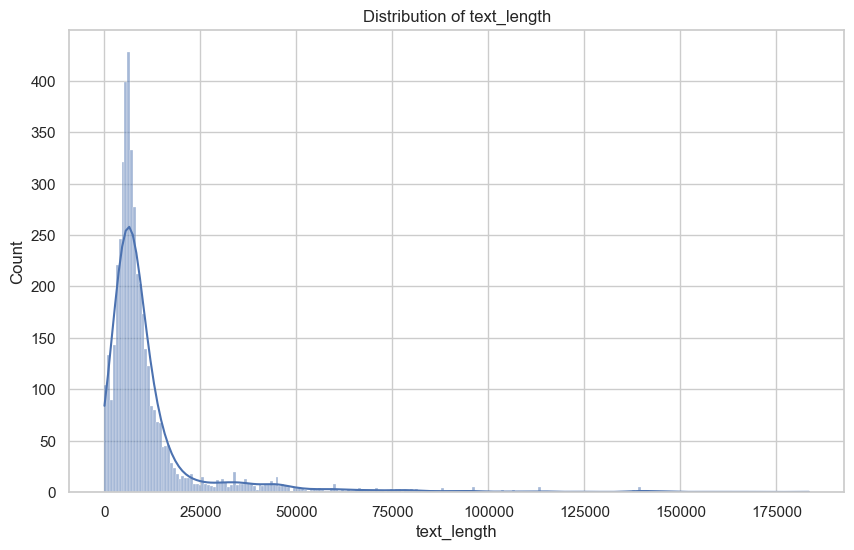

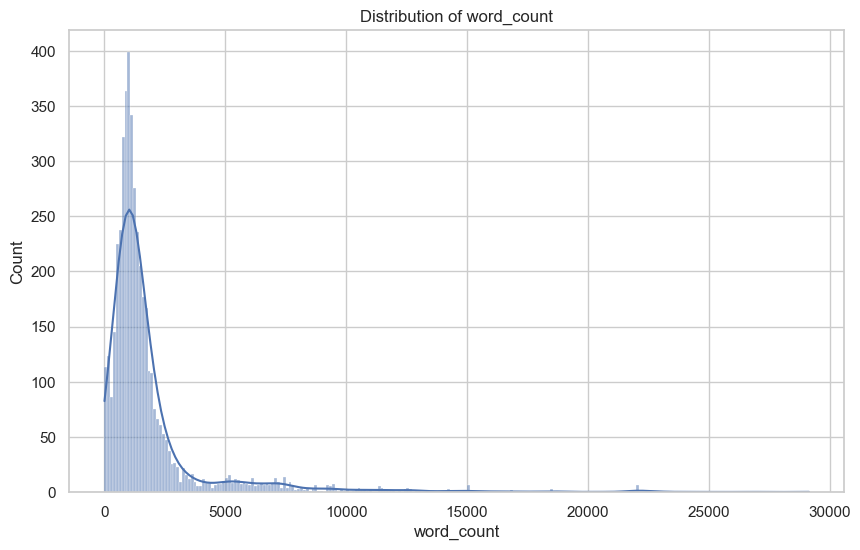

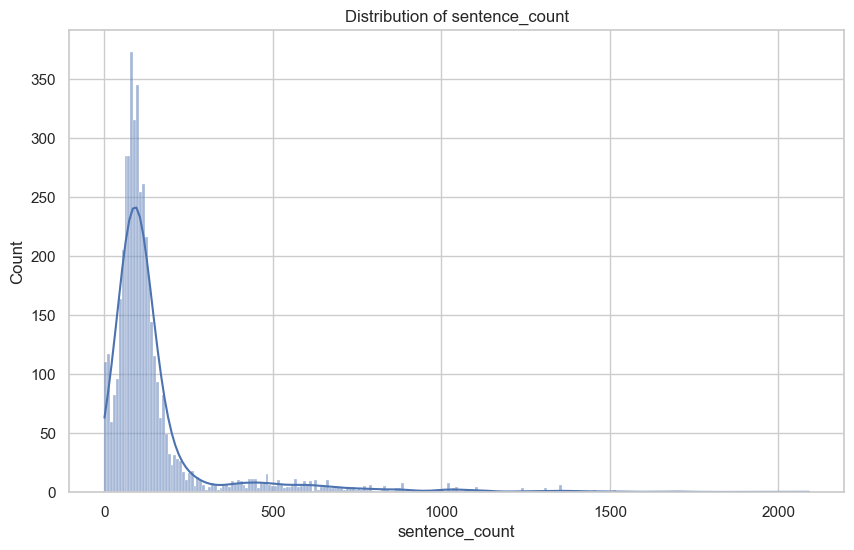

In [275]:
import matplotlib.pyplot as plt
import seaborn as sns

# numerieke waardes
numerical_columns = ['text_length', 'word_count', 'sentence_count']

for col in numerical_columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()


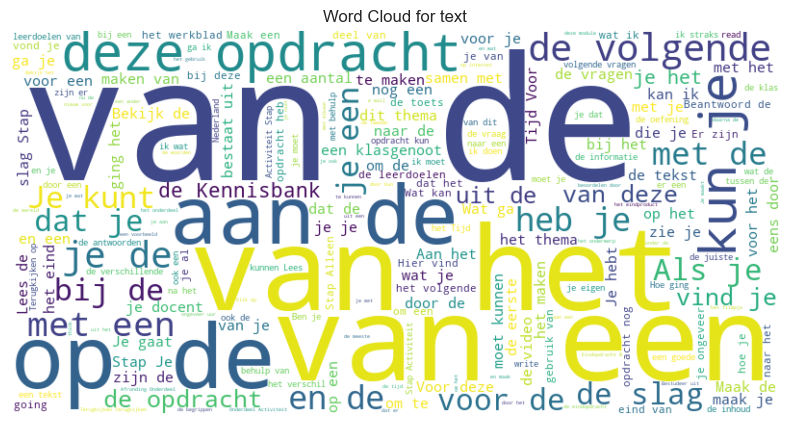

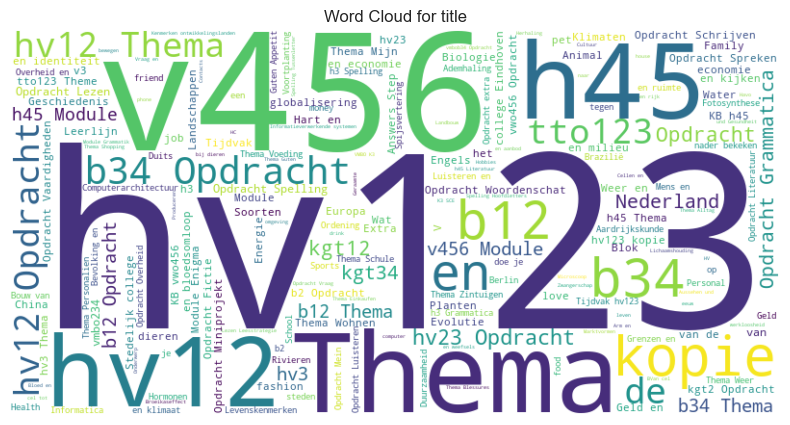

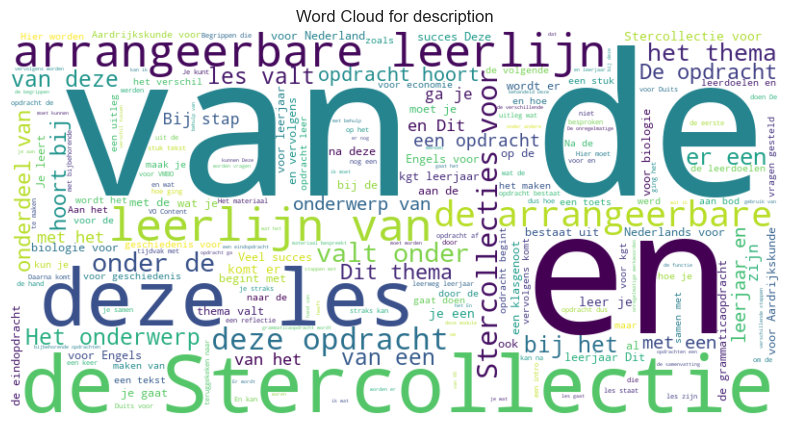

In [276]:
text_columns = ['text', 'title', 'description']

for col in text_columns:
    text_data = ' '.join(df[col].dropna())
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text_data)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {col}')
    plt.show()


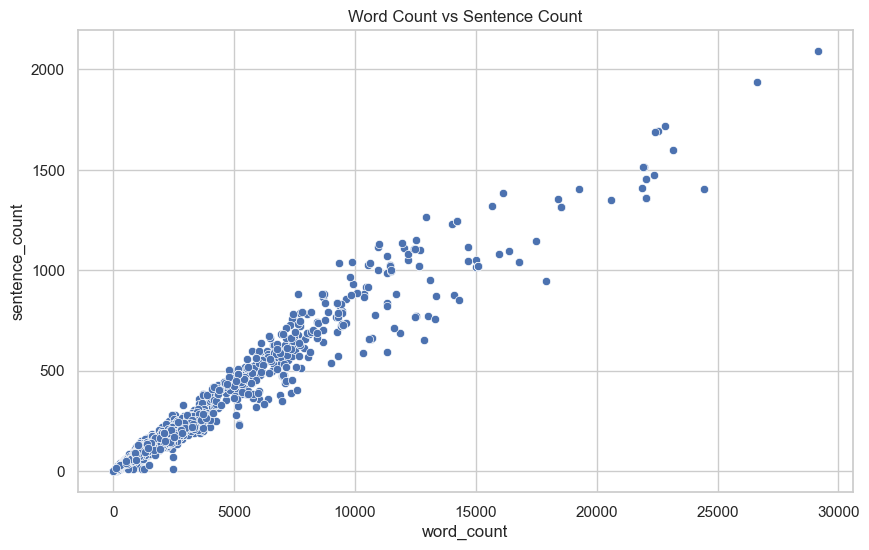

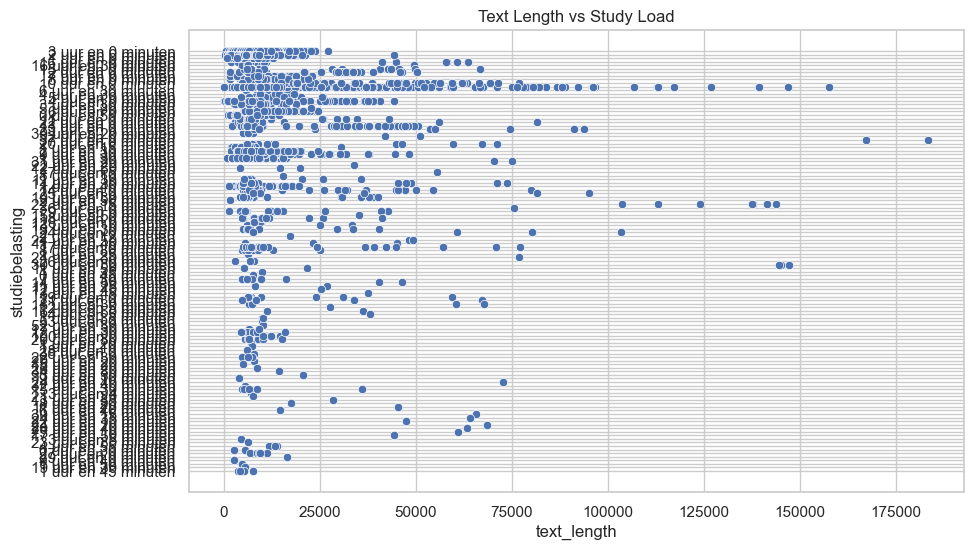

In [277]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='word_count', y='sentence_count')
plt.title('Word Count vs Sentence Count')
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='text_length', y='studiebelasting')
plt.title('Text Length vs Study Load')
plt.show()


In [278]:
df['trefwoorden_list'] = df['trefwoorden'].str.split(',')

all_keywords = df['trefwoorden_list'].explode().str.strip()

all_keywords = all_keywords.dropna()


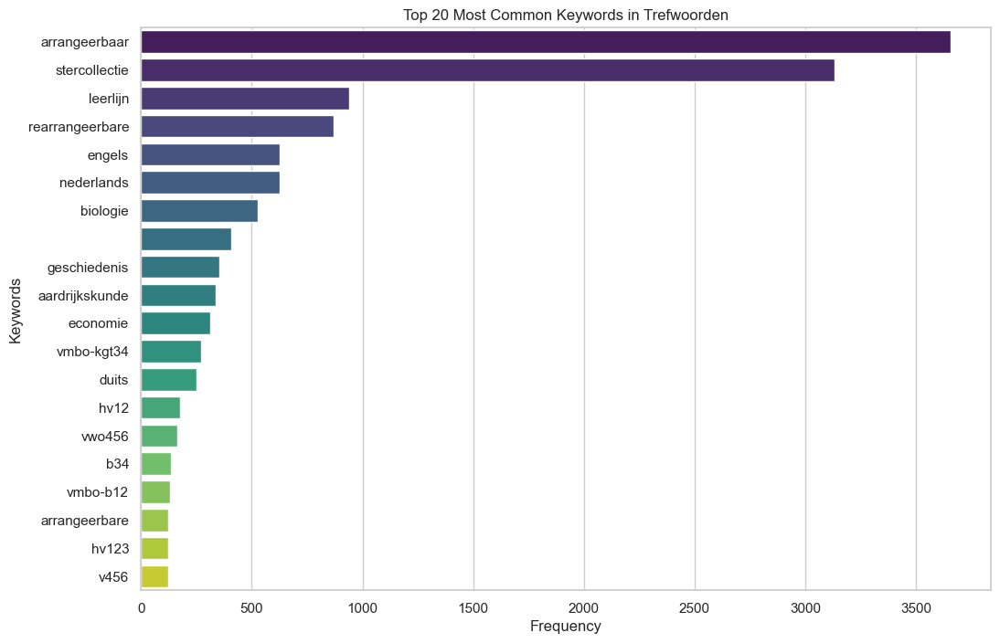

In [279]:
import seaborn as sns

keyword_counts = all_keywords.value_counts()
# 20 meestvoorkomende woorden
plt.figure(figsize=(12, 8))
sns.barplot(y=keyword_counts.index[:20], x=keyword_counts.values[:20], palette='viridis')
plt.title('Top 20 Most Common Keywords in Trefwoorden')
plt.xlabel('Frequency')
plt.ylabel('Keywords')
plt.show()


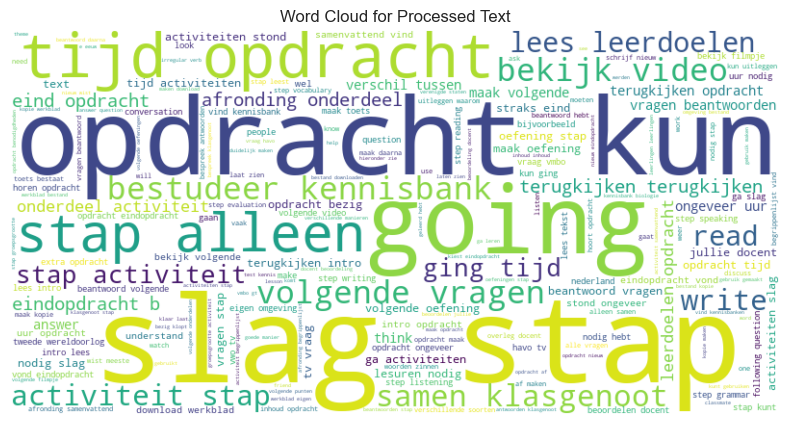

In [280]:

# wordcloud processed text
text_data = ' '.join(df['processed_text'].dropna())
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text_data)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Processed Text')
plt.show()


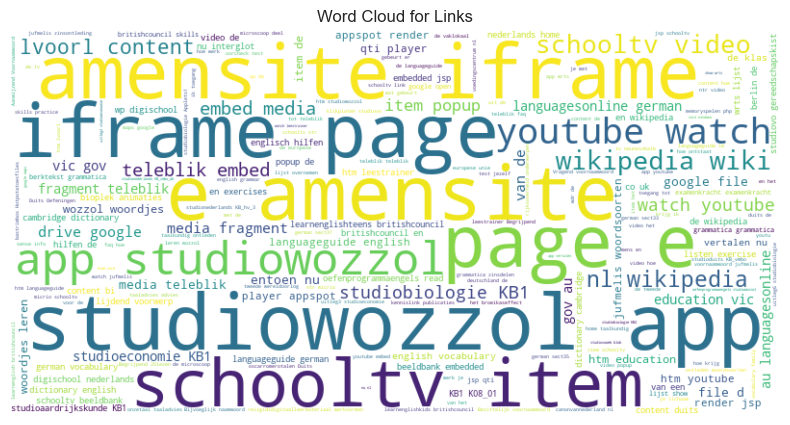

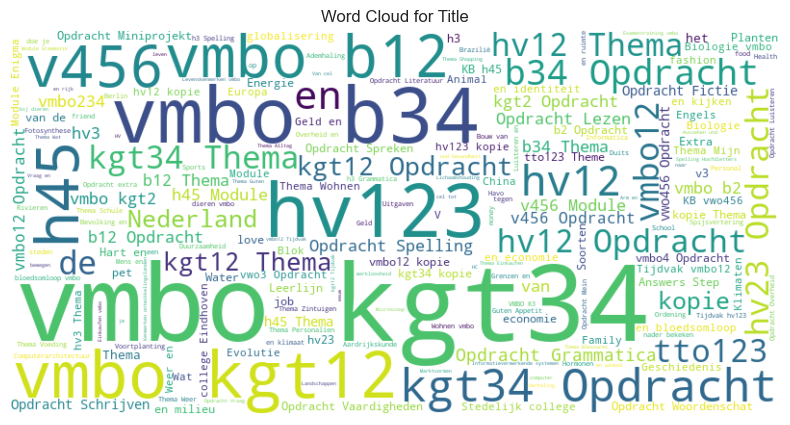

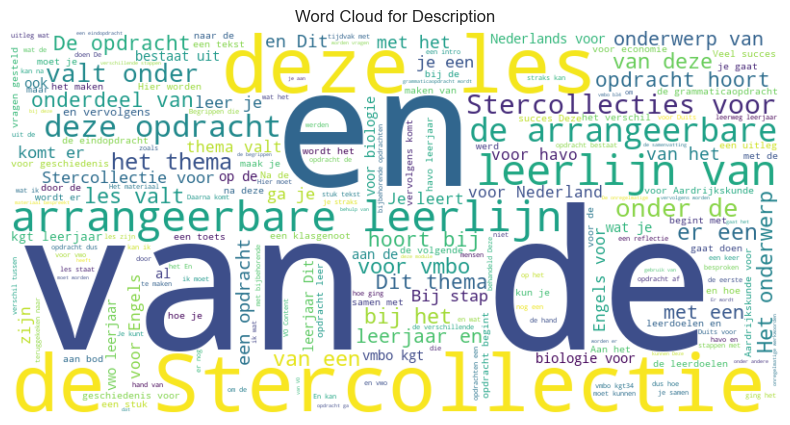

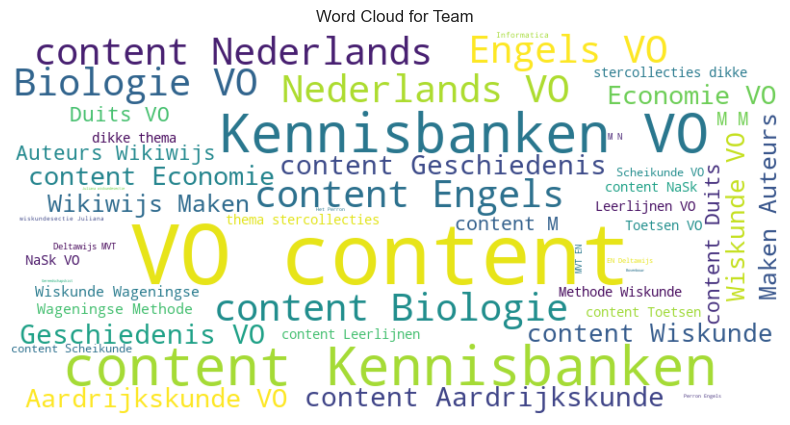

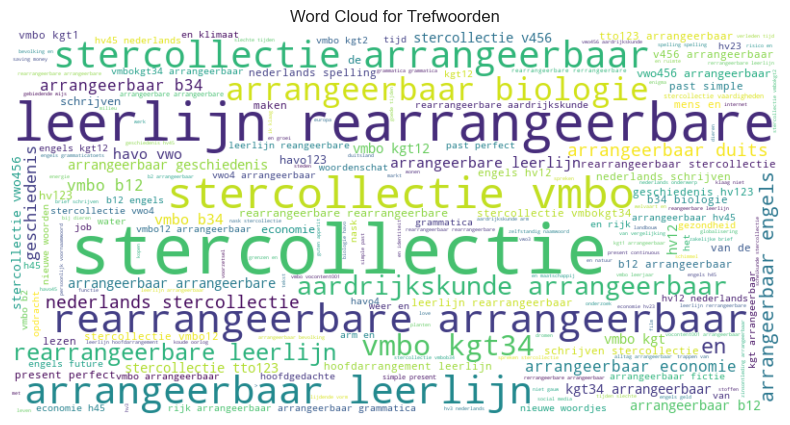

In [281]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

columns_to_add = ['links', 'title', 'description', 'team', 'trefwoorden']

for column in columns_to_add:
    text_data = ' '.join(dataframe[column].dropna())
    
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text_data)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {column.capitalize()}')
    plt.show()


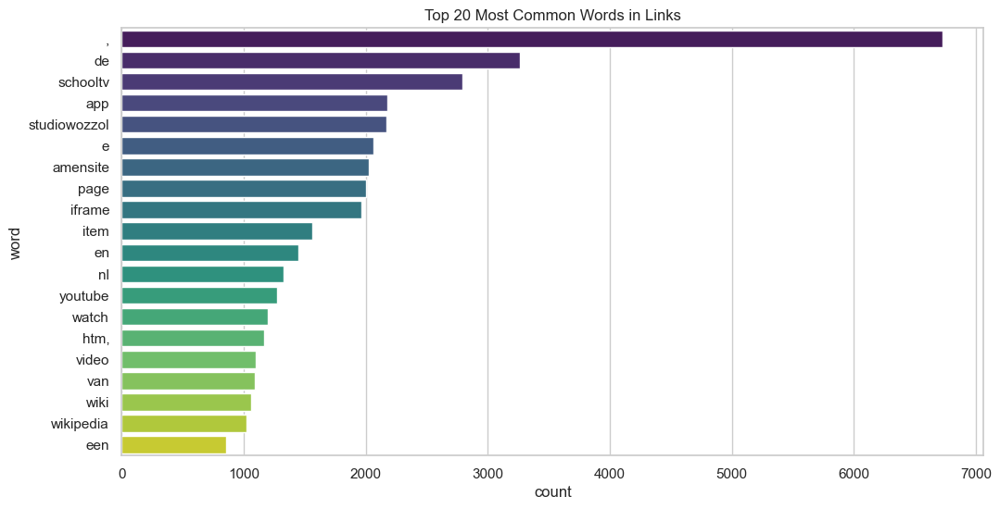

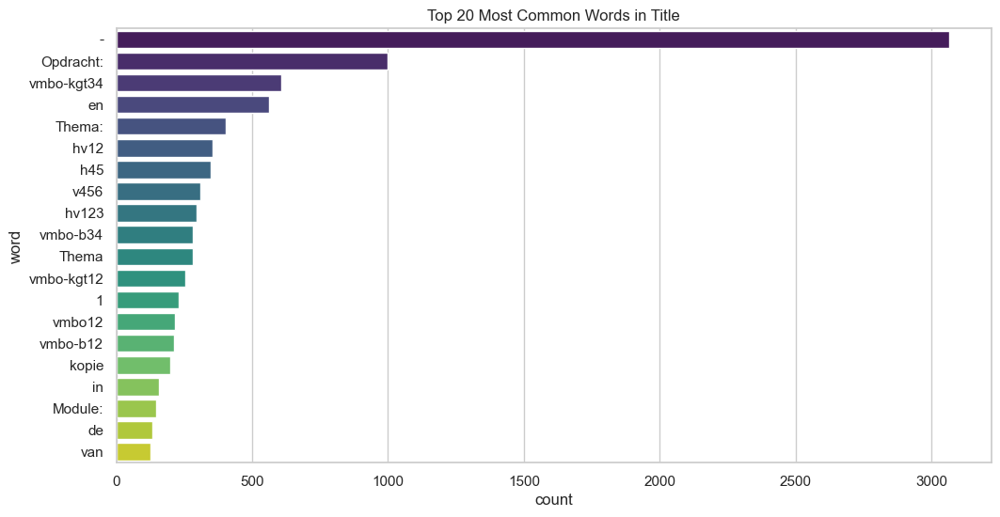

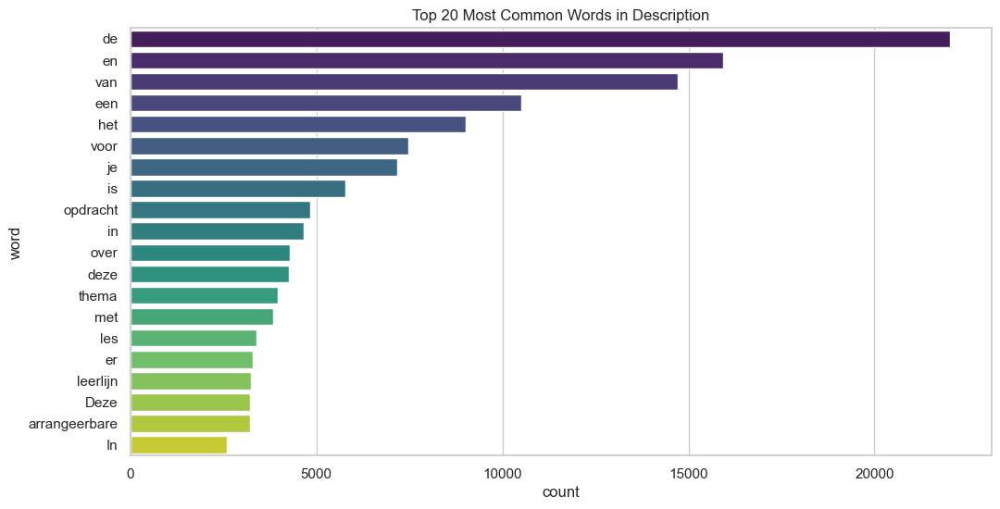

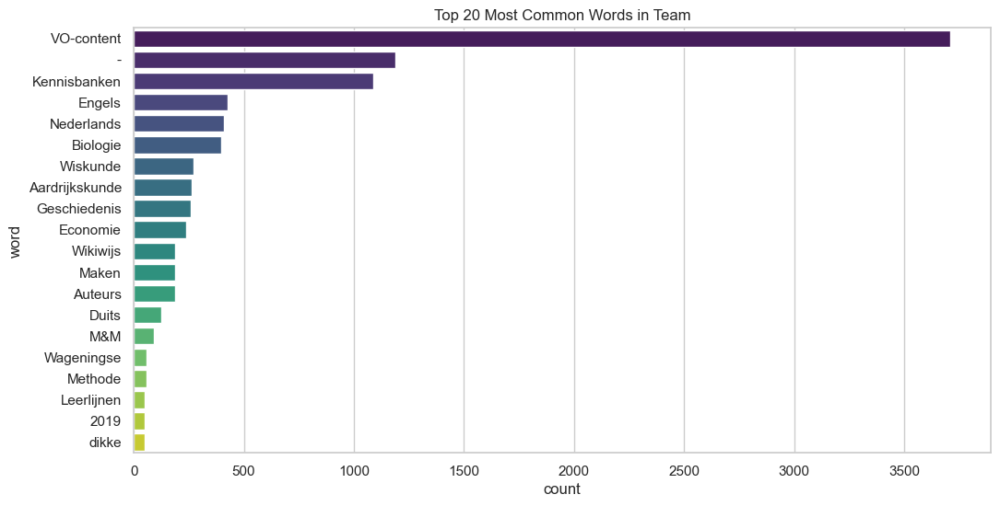

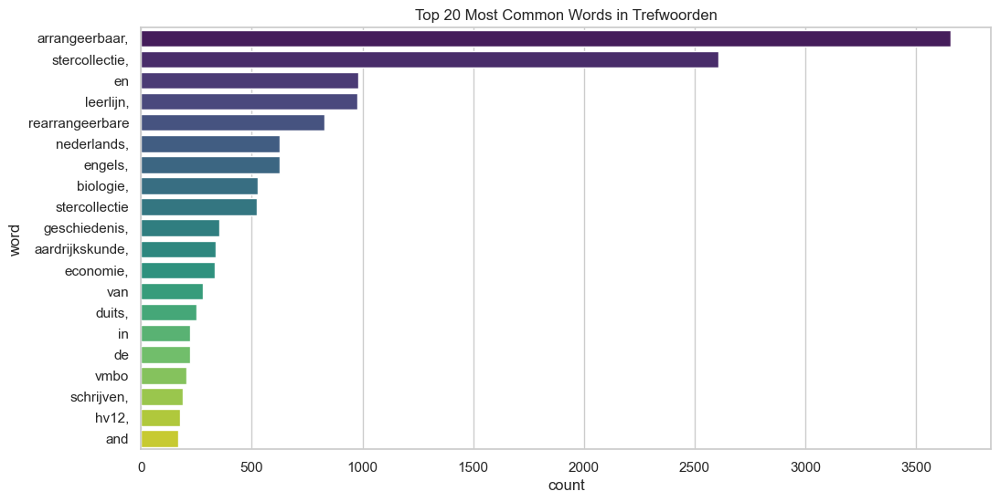

In [282]:
import pandas as pd
from collections import Counter
import seaborn as sns

def plot_top_words(column, num_words=20):
    text_data = ' '.join(dataframe[column].dropna())
    word_counts = Counter(text_data.split())
    common_words = word_counts.most_common(num_words)
    
    words_df = pd.DataFrame(common_words, columns=['word', 'count'])
    
    plt.figure(figsize=(12, 6))
    sns.barplot(data=words_df, x='count', y='word', palette='viridis')
    plt.title(f'Top {num_words} Most Common Words in {column.capitalize()}')
    plt.show()

for column in columns_to_add:
    plot_top_words(column)


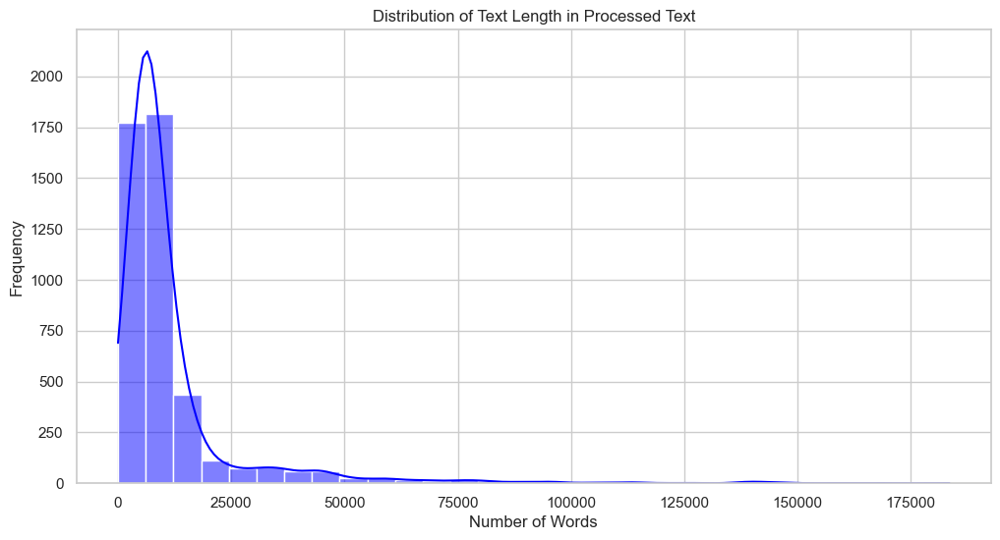

In [283]:
dataframe['text_length'] = dataframe['processed_text'].apply(lambda x: len(x.split()) if pd.notnull(x) else 0)

plt.figure(figsize=(12, 6))
sns.histplot(df['text_length'], bins=30, kde=True, color='blue')
plt.title('Distribution of Text Length in Processed Text')
plt.xlabel('Number of Words')
plt.ylabel('Frequency')
plt.show()


In [284]:
import pandas as pd

columns_to_add = ['links', 'vakken', 'leerjaren', 'niveaus', 'title', 'description', 'team', 'trefwoorden']

def combine_columns(row):
    combined_text = ' '.join(str(row[col]) for col in columns_to_add if pd.notnull(row[col]))
    return combined_text

dataframe['text'] = dataframe.apply(combine_columns, axis=1)

display(dataframe['text'].head())

0     schooltv video groenten eten van welke plant e...
2     drive google file d 1F5ZbggMyJcIuyYsEa3IiNLiW9...
9     schooltv video ontwikkeling ongeboren baby een...
10    schooltv video tweelingen er zijn eeneiige en ...
12     Aardrijkskunde 1, 2 VMBO basisberoepsgerichte...
Name: text, dtype: object

In [285]:
formatted = df[['processed_text', 'cleaned_vakken', 'leerjaren','niveaus' ]]

df = formatted.copy()
bert_data = formatted.copy()
bert_data
bert_data = bert_data.sample(frac=0.25)
bert_data

,processed_text,cleaned_vakken,leerjaren,niveaus
4997,eerste schrift intro spijkerschrift egyptische...,Geschiedenis,"1, 2, 3",havo
3786,stijlfiguren straks eind opdracht kun omschrij...,Nederlands,"4, 5",HAVO
4325,coronacrisis intro coronacrisis begon nederlan...,Economie,"3, 4",vmbo-kgt34
3720,cinema introduction onderwerp blok bioscoop ma...,Engels,"3, 4",vmbo
1988,ondernemingsvormen intro eigen bedrijf beginne...,Economie,"2, 3","HAVO, VWO"
...,...,...,...,...
4834,doe inleiding plakt jouw band doe vadermoeder ...,Nederlands,"1, 2",vmbo-kgt12
2372,aussehen und gesundheit inleiding beste leerli...,Duits,"3, 4",vmbo
2971,gefällt mir inleiding blok bestaat stappen wer...,Duits,"3, 4",vmbo-kgt34
5242,stambomen intro soms ingewikkeld elkaar zitten...,Biologie,"1, 2",havo


# 

---
<div style="background-color:white; text-align:center; vertical-align:middle; padding:50px 0; margin-top:5px; margin-bottom:5px">
    <h2 id="eda-title" style="color:black; font-family: Verdana, sans-serif; font-size: 25px;"><strong> H7: Modelleren </strong></h2>

</ul>

We zijn nu klaar voor modelleren, we hebben drie modellen waarvan we denken dat ze goed kunnen presteren voor ons probleem.
Dit zijn LSTM, GRU en BERT-Uncased. De redenering hierachter is te vinden in het advies rapport

# Feature engineering

Hier maken we een tokenizer aan voor het GRU model, dit betekend dat we individuele elemementen maken van de woorden. hiervan pakken we de 10000 die het meest voorkomen. ook vervangen we woorden die niet voorkomen in de vocabulaire van de tokenizer met <OOV> dit helpt met het omgaan met nieuwe of weinig voorkomende woorden.
Ook vervangen we de target waardes met numerieke waardes sinds het model niet om kan gaan met strings als targets.

In [291]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences


texts = df['processed_text'].astype(str).tolist()

tokenizer = Tokenizer(num_words=10000, oov_token='<OOV>')
tokenizer.fit_on_texts(texts)
sequences = tokenizer.texts_to_sequences(texts)
padded_sequences = pad_sequences(sequences, padding='post', maxlen=200)

label_encoders = {}
for column in ['cleaned_vakken', 'leerjaren', 'niveaus']:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column])
    label_encoders[column] = le

labels_vakken = df['cleaned_vakken'].values
labels_leerjaren = df['leerjaren'].values
labels_niveaus = df['niveaus'].values


## GRU model

Hier wordt het GRU model in een functie aangemaakt, de doen dit in een functie zodat we hier bij het trainen beter mee kunnen werken
We gebruiken de gebruikelijke input dimensie van 10000 wat de vocabulaire limiteerd tot 10000 unieke woorden wat rare of niet voorkomende woorden die het model in de war kunnen brengen voorkomt.
de output dimensie van 128 is ook een gebruikelijke waarde, deze liggen vaak tussen de 50 en 300, het geeft aan hoe groot de output vector moet zijn, dit varieert op basis van hoe complex de tekst is, voor ons probleem is de tekst niet erg simpel maar ook niet super complex. de input lengte zorgt ervoor dat de invoer lengte uniform is wat nodig is voor het model.

Het model,
We hebben een GRU model met 3 grootte layers gemaakt om ervoor te zorgen dat alle oppervlakkige informatie en de wat dieper liggende informatie geleerd wordt. we hebben gezien dat overfitting kan voorkomen en dus voegen we twee dropout layers toe van 20% per stuk die overfitting voorkomen.
We gebruiken een relu functie in de een na laatste layer om non-lineariteit toe te voegen.
in de output layer hebben we een aantal neuronen relatief aan de target type die het moet voorspellen met een softmax activatie om de kans per klasse te geven.

Dan compilen we het model met een Adam optimizer en een loss functie voor multi-klasse klassificatie. we willen weten hoe nauwkeurig ons model is dus als metric gebruiken we accuracy.

In [294]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, GRU, Dense, Dropout
from tensorflow.keras.optimizers import Adam

def create_gru_model(output_classes):
    model = Sequential([
        Embedding(input_dim=10000, output_dim=128, input_length=200),
        GRU(128, return_sequences=True),
        Dropout(0.2),
        GRU(64),
        Dropout(0.2),
        Dense(64, activation='relu'),
        Dense(output_classes, activation='softmax')
    ])
    model.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model


Hier splitten we de data 3 keer, elke keer met een andere Y waarde
Daarna maken we de modellen voor iedere target variabele waarde waarbij we meegeven welke keuzes er zijn per classe
dan fitten we de modellen op de data we kiezen hierbij voor een batch_size van 32 en 10 epochs sinds we zagen dat overfitting een probleem werd bij grotere waardes

In [296]:
# Split data
X_train, X_test, y_train_vakken, y_test_vakken = train_test_split(padded_sequences, labels_vakken, test_size=0.2, random_state=42)
X_train, X_test, y_train_leerjaren, y_test_leerjaren = train_test_split(padded_sequences, labels_leerjaren, test_size=0.2, random_state=42)
X_train, X_test, y_train_niveaus, y_test_niveaus = train_test_split(padded_sequences, labels_niveaus, test_size=0.2, random_state=42)

# Create models
model_vakken = create_gru_model(len(label_encoders['cleaned_vakken'].classes_))
model_leerjaren = create_gru_model(len(label_encoders['leerjaren'].classes_))
model_niveaus = create_gru_model(len(label_encoders['niveaus'].classes_))

# Train models
history_vakken = model_vakken.fit(X_train, y_train_vakken, epochs=10, batch_size=32, validation_data=(X_test, y_test_vakken))
history_leerjaren = model_leerjaren.fit(X_train, y_train_leerjaren, epochs=10, batch_size=32, validation_data=(X_test, y_test_leerjaren))
history_niveaus = model_niveaus.fit(X_train, y_train_niveaus, epochs=10, batch_size=32, validation_data=(X_test, y_test_niveaus))


C:\Users\leeuw\anaconda3\Lib\site-packages\keras\src\layers\core\embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/10
114/114 ━━━━━━━━━━━━━━━━━━━━ 48s 315ms/step - accuracy: 0.2861 - loss: 1.9677 - val_accuracy: 0.5493 - val_loss: 1.2642
Epoch 2/10
114/114 ━━━━━━━━━━━━━━━━━━━━ 35s 308ms/step - accuracy: 0.6326 - loss: 1.0246 - val_accuracy: 0.7741 - val_loss: 0.6599
Epoch 3/10
114/114 ━━━━━━━━━━━━━━━━━━━━ 35s 310ms/step - accuracy: 0.8544 - loss: 0.4590 - val_accuracy: 0.8465 - val_loss: 0.4929
Epoch 4/10
114/114 ━━━━━━━━━━━━━━━━━━━━ 36s 314ms/step - accuracy: 0.9453 - loss: 0.2076 - val_accuracy: 0.8860 - val_loss: 0.4105
Epoch 5/10
114/114 ━━━━━━━━━━━━━━━━━━━━ 36s 315ms/step - accuracy: 0.9715 - loss: 0.1230 - val_accuracy: 0.9046 - val_loss: 0.4001
Epoch 6/10
114/114 ━━━━━━━━━━━━━━━━━━━━ 35s 308ms/step - accuracy: 0.9729 - loss: 0.0913 - val_accuracy: 0.8991 - val_loss: 0.4084
Epoch 7/10
114/114 ━━━━━━━━━━━━━━━━━━━━ 34s 300ms/step - accuracy: 0.9874 - loss: 0.0519 - val_accuracy: 0.9101 - val_loss: 0.3987
Epoch 8/10
114/114 ━━━━━━━━━━━━━━━━━━━━ 35s 309ms/step - accuracy: 0.9907 - loss: 0

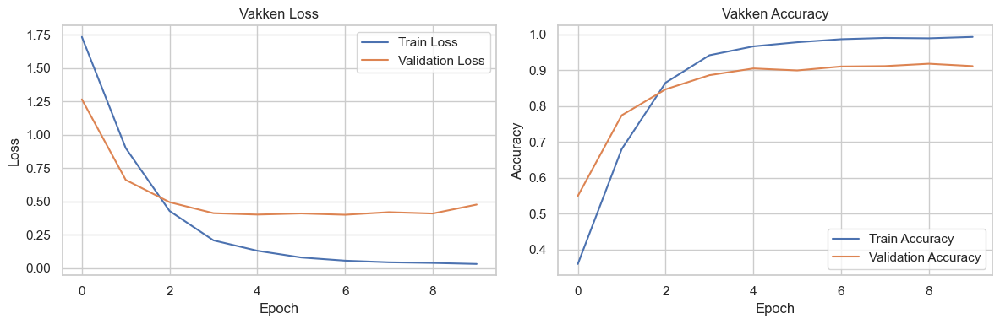

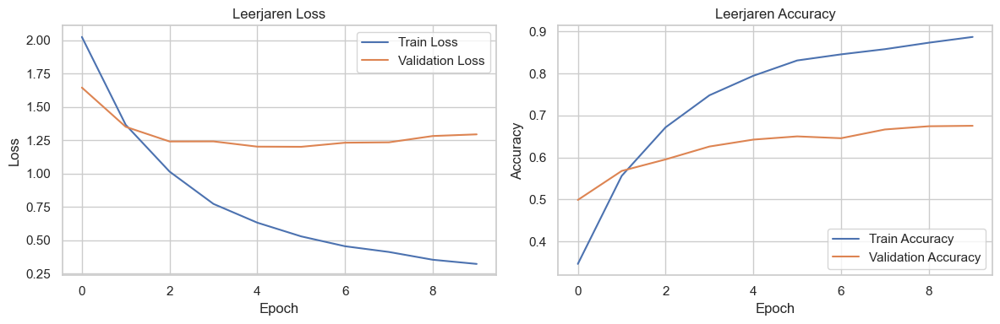

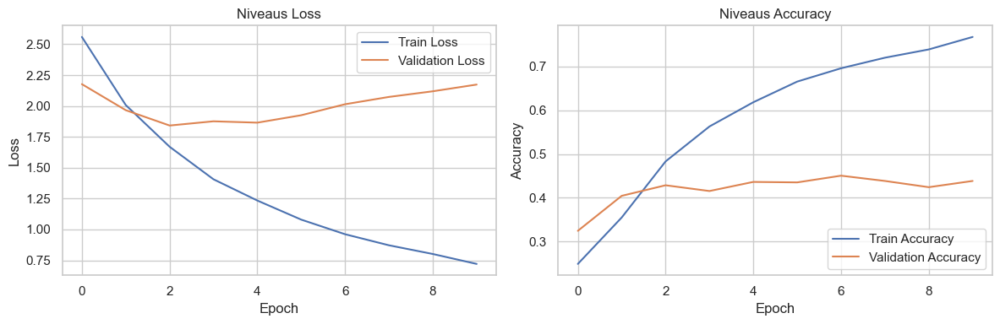

In [297]:
def plot_loss_and_accuracy(history, model_name):
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'{model_name} Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='upper right')
    
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'{model_name} Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(loc='lower right')
    
    plt.tight_layout()
    plt.show()

plot_loss_and_accuracy(history_vakken, "Vakken")
plot_loss_and_accuracy(history_leerjaren, "Leerjaren")
plot_loss_and_accuracy(history_niveaus, "Niveaus")

We laten de accuracy zien, dit is het precentage waardes dat goed geklassificeerd is
we zien hierbij dat de loss beter geoptimalizeerd kan worden, maar we lopen hierbij snel risico op overfitting.

In [299]:
vakken_loss, vakken_accuracy = model_vakken.evaluate(X_test, y_test_vakken)
leerjaren_loss, leerjaren_accuracy = model_leerjaren.evaluate(X_test, y_test_leerjaren)
niveaus_loss, niveaus_accuracy = model_niveaus.evaluate(X_test, y_test_niveaus)

print(f"Vakken Accuracy: {vakken_accuracy}")
print(f"Leerjaren Accuracy: {leerjaren_accuracy}")
print(f"Niveaus Accuracy: {niveaus_accuracy}")

29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - accuracy: 0.9192 - loss: 0.3987
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - accuracy: 0.6813 - loss: 1.2898
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - accuracy: 0.4334 - loss: 2.2251
Vakken Accuracy: 0.9111841917037964
Leerjaren Accuracy: 0.6754385828971863
Niveaus Accuracy: 0.4385964870452881


## LSTM

##### kleine LSTM uitleg nodig !

Hier maken we weer de training data aan geven we ook wweer  max woords en max len aan. dit model gebruikt dezelfde dataset en heeft dus dezelfde redenering achter deze keuzes.
we gebruiken dan een tokenizer op de tekst data. dit doen we omdat een tokenizer nodig is zodat het model de woorden als aparte objecten ziet, alhoewel er correlatie zit tussen de woorden is dit wel nodig.
We transformeren de data naar numerieke waardes sinds het model niet bedoelt is om strings te voorspellen voor het klassificeren.

# Feature engineering !

In [304]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

X = dataframe['processed_text']
y_leerjaren = dataframe['leerjaren']
y_niveaus = dataframe['niveaus']
y_vakken = dataframe['cleaned_vakken']

X_train, X_test, y_train_leerjaren, y_test_leerjaren = train_test_split(X, y_leerjaren, test_size=0.2, random_state=42)
_, _, y_train_niveaus, y_test_niveaus = train_test_split(X, y_niveaus, test_size=0.2, random_state=42)
_, _, y_train_vakken, y_test_vakken = train_test_split(X, y_vakken, test_size=0.2, random_state=42)

# Tokenizer
max_words = 10000
max_len = 100

tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(X_train)

X_train_seq = tokenizer.texts_to_sequences(X_train)
X_test_seq = tokenizer.texts_to_sequences(X_test)

X_train_pad = pad_sequences(X_train_seq, maxlen=max_len)
X_test_pad = pad_sequences(X_test_seq, maxlen=max_len)

# Label Encoding
le_leerjaren = LabelEncoder()
y_leerjaren_combined = pd.concat([y_train_leerjaren, y_test_leerjaren])
le_leerjaren.fit(y_leerjaren_combined)
y_train_leerjaren_enc = le_leerjaren.transform(y_train_leerjaren)
y_test_leerjaren_enc = le_leerjaren.transform(y_test_leerjaren)

le_niveaus = LabelEncoder()
y_niveaus_combined = pd.concat([y_train_niveaus, y_test_niveaus])
le_niveaus.fit(y_niveaus_combined)
y_train_niveaus_enc = le_niveaus.transform(y_train_niveaus)
y_test_niveaus_enc = le_niveaus.transform(y_test_niveaus)

le_vakken = LabelEncoder()
y_vakken_combined = pd.concat([y_train_vakken, y_test_vakken])
le_vakken.fit(y_vakken_combined)
y_train_vakken_enc = le_vakken.transform(y_train_vakken)
y_test_vakken_enc = le_vakken.transform(y_test_vakken)


In [305]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, LSTM, Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import classification_report
import numpy as np


we embedden de tekst en geven aan wat de output dimensionaliteit moet zijn, deze waarde maken we niet te groot of te klein sinds de tekst niet heel simpel of moeilijk is.
Dan maken we het LSTM model aan hierbij hebben we een aantal keuzes gemaakt. zo hebben we een relatief simpel en ondiep model gemaakt. hierbij hebben we 2 layers van 64 neuronen gemaakt. we zorgen met return sequences ervoor dat de volgende laag de complete sequentie van uitgangen krijgt zodat de 2e laag ook de hele sequentie kan verwerken. er zat veel overfitting in het model dus hebben we er ook voor gekozen om een dropout layer van 0.5 er na te doen wat de helft van de neuronen uitzet
we geven ook aan wat de outputs moeten zijn van iedere target variabele. hierbij gebruiken we dezelfde lstm en activatie functie 'softmax' deze geef de kans per klasse.
hierna word het model samengezet met hierin de inputs en de outputs.

In [307]:
input_text = Input(shape=(max_len,))

embedding = Embedding(input_dim=max_words, output_dim=128, input_length=max_len)(input_text)

lstm = LSTM(64, return_sequences=True)(embedding)
lstm = LSTM(64)(lstm)
lstm = Dropout(0.5)(lstm)

output_leerjaren = Dense(len(le_leerjaren.classes_), activation='softmax', name='leerjaren')(lstm)
output_niveaus = Dense(len(le_niveaus.classes_), activation='softmax', name='niveaus')(lstm)
output_vakken = Dense(len(le_vakken.classes_), activation='softmax', name='vakken_cleaned')(lstm)

model = Model(inputs=input_text, outputs=[output_leerjaren, output_niveaus, output_vakken])

C:\Users\leeuw\anaconda3\Lib\site-packages\keras\src\layers\core\embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Hier compilen we het model, we trainen het dus. dit doen we met een Adam optimizer we zetten hierbij de learning rate in de eerste instantie op 0.001 maar omdat we de Adam optimizer hebben gekozen veranderd deze tijdens het trainen. we gebruiken sparse categorical crossentropy als loss functies voor alle targets sinds we proberen te klassificeren en onze labels integers zijn en niet vectors. we testen hoe goed het model werkt met behulp van de accuracy.


In [309]:
model.compile(optimizer=Adam(learning_rate=0.001),
              loss={'leerjaren': 'sparse_categorical_crossentropy',
                    'niveaus': 'sparse_categorical_crossentropy',
                    'vakken_cleaned': 'sparse_categorical_crossentropy'},
              metrics={'leerjaren': 'accuracy',
                       'niveaus': 'accuracy',
                       'vakken_cleaned': 'accuracy'})


hier maken we de history aan, hiermee kunnen we zien wat er gebeurde tijdens het trainen. op basis hiervan kunnen we ordelen wat we moeten verbeteren in het model.

In [311]:
history = model.fit(X_train_pad, 
                    {'leerjaren': y_train_leerjaren_enc, 
                     'niveaus': y_train_niveaus_enc, 
                     'vakken_cleaned': y_train_vakken_enc},
                    epochs=10,  
                    batch_size=32,
                    validation_data=(X_test_pad, 
                                     {'leerjaren': y_test_leerjaren_enc, 
                                      'niveaus': y_test_niveaus_enc, 
                                      'vakken_cleaned': y_test_vakken_enc}))


Epoch 1/10
114/114 ━━━━━━━━━━━━━━━━━━━━ 23s 114ms/step - leerjaren_accuracy: 0.2373 - loss: 7.6010 - niveaus_accuracy: 0.1798 - vakken_cleaned_accuracy: 0.2050 - val_leerjaren_accuracy: 0.4364 - val_loss: 5.4867 - val_niveaus_accuracy: 0.3377 - val_vakken_cleaned_accuracy: 0.4572
Epoch 2/10
114/114 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - leerjaren_accuracy: 0.4429 - loss: 5.3971 - niveaus_accuracy: 0.3390 - vakken_cleaned_accuracy: 0.4129 - val_leerjaren_accuracy: 0.5230 - val_loss: 4.6419 - val_niveaus_accuracy: 0.4024 - val_vakken_cleaned_accuracy: 0.5757
Epoch 3/10
114/114 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - leerjaren_accuracy: 0.5009 - loss: 4.4511 - niveaus_accuracy: 0.3595 - vakken_cleaned_accuracy: 0.6170 - val_leerjaren_accuracy: 0.6009 - val_loss: 3.8361 - val_niveaus_accuracy: 0.4211 - val_vakken_cleaned_accuracy: 0.7643
Epoch 4/10
114/114 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - leerjaren_accuracy: 0.6109 - loss: 3.5973 - niveaus_accuracy: 0.4328 - vakken_cleaned_accuracy: 0.7609

we plotten hier de loss om te zien of het model overfit of underfit en een meer visuele representatie te krijgen van het resultaat van het model. we zien ook de verschillen in de drie target variabelen.

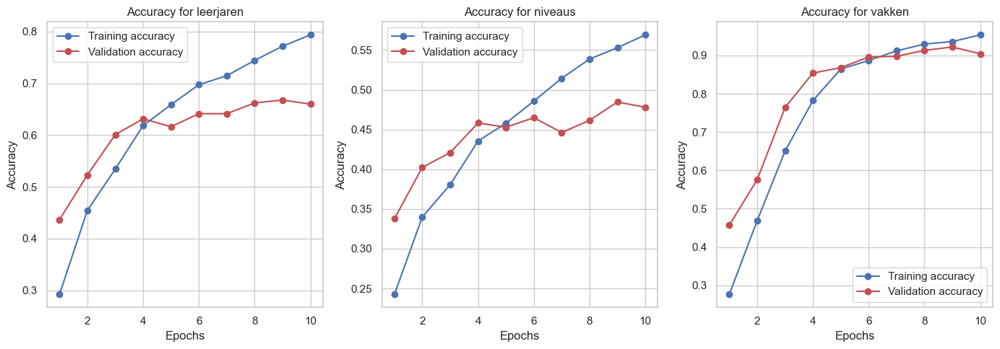

In [313]:

leerjaren_acc = history.history['leerjaren_accuracy']
niveaus_acc = history.history['niveaus_accuracy']
vakken_acc = history.history['vakken_cleaned_accuracy']

val_leerjaren_acc = history.history['val_leerjaren_accuracy']
val_niveaus_acc = history.history['val_niveaus_accuracy']
val_vakken_acc = history.history['val_vakken_cleaned_accuracy']

epochs = range(1, len(leerjaren_acc) + 1)

plt.figure(figsize=(14, 5))

plt.subplot(1, 3, 1)
plt.plot(epochs, leerjaren_acc, 'bo-', label='Training accuracy')
plt.plot(epochs, val_leerjaren_acc, 'ro-', label='Validation accuracy')
plt.title('Accuracy for leerjaren')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(epochs, niveaus_acc, 'bo-', label='Training accuracy')
plt.plot(epochs, val_niveaus_acc, 'ro-', label='Validation accuracy')
plt.title('Accuracy for niveaus')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(epochs, vakken_acc, 'bo-', label='Training accuracy')
plt.plot(epochs, val_vakken_acc, 'ro-', label='Validation accuracy')
plt.title('Accuracy for vakken')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


## DistilBERT

we maken hier de functie train and evaluate model aan die de data splitst, de BERT tokenizer in laad en gebruikt.
De BertDataset classe zorgt ervoor dat de data in het juiste formaat staat, hierbij worden de encodings van de train en val sets gebruikt.
dan maken we een torch tensor van de encodings en laden we het gebruikte bert model in.
We geven dan de training argumenten mee die het model nodig heeft
met alle informatie voorbereid geven we de argumenten, het model en de data mee aan de trainer.

training args:
we hebben output_dir toegevoegd mochten we deze nodig hebben later.
we trainen het model met 10 epochs per target variabele, dit geeft een balans tussen under en overfitting. we kiezen voor een batch size omdat het model nog snel kon convergeren maar het geheugen gebruik nog te doen was.
hetzelfde geld voor de eval batch. we gebruiken 500 warmup steps om de begin learning rate correct in te stellen. dan regulariseren we de gewichten met weight decay zodat de gewichten niet te groot worden.
we geven ook een locatie voor log dirs neer mochten we deze willen gebruiken. en om de hoeveel stappen we de logging willen.

we kijken dan in de tensor van de resultaten van de validatie set en pakken de grootste waarde door dim=-1 te pakken zodat we kunnen zien wat het model voorspeld
Nadat het model getrained is kijken we naar de resultaten hiervoor gebruiken we accuracy


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from transformers import DistilBertTokenizer, DistilBertForSequenceClassification, Trainer, TrainingArguments
import torch



# Functie om een model te trainen en evalueren
def train_and_evaluate_model(texts, labels, num_labels):
    # Train-test split
    train_texts, val_texts, train_labels, val_labels = train_test_split(texts, labels, test_size=0.2)

    # Tokenizer
    tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')

    # Tokenize de data
    train_encodings = tokenizer(train_texts.tolist(), truncation=True, padding=True)
    val_encodings = tokenizer(val_texts.tolist(), truncation=True, padding=True)

    # Maak PyTorch datasets
    class BertDataset(torch.utils.data.Dataset):
        def __init__(self, encodings, labels):
            self.encodings = encodings
            self.labels = labels

        def __getitem__(self, idx):
            item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
            item['labels'] = torch.tensor(self.labels[idx])
            return item

        def __len__(self):
            return len(self.labels)

    train_dataset = BertDataset(train_encodings, train_labels.tolist())
    val_dataset = BertDataset(val_encodings, val_labels.tolist())

    model = DistilBertForSequenceClassification.from_pretrained('distilbert-base-uncased', num_labels=num_labels)

    # Training arguments
    training_args = TrainingArguments(
        output_dir='./results',
        num_train_epochs=10,
        per_device_train_batch_size=8,
        per_device_eval_batch_size=8,
        warmup_steps=500,
        weight_decay=0.01,
        logging_dir='./logs',
        logging_steps=10,
    )

    # Trainer
    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=val_dataset,
    )

    # Train het model
    trainer.train()

    # Evaluate the model
    results = trainer.evaluate()
    
    # Voorspellingen maken op de validatieset
    val_predictions = trainer.predict(val_dataset)
    val_preds = torch.argmax(torch.tensor(val_predictions.predictions), dim=-1).numpy()

    # Bereken de nauwkeurigheid
    accuracy = accuracy_score(val_labels, val_preds)
    
    return model, tokenizer, accuracy

# Encode de labels voor elke taak
label_encoders = {}
for column in ['cleaned_vakken', 'leerjaren', 'niveaus']:
    le = LabelEncoder()
    bert_data[column + '_labels'] = le.fit_transform(bert_data[column])
    label_encoders[column] = le

# Train en evalueer de modellen voor elke taak
vakken_model, vakken_tokenizer, vakken_accuracy = train_and_evaluate_model(
    bert_data['processed_text'], bert_data['cleaned_vakken_labels'], num_labels=len(label_encoders['cleaned_vakken'].classes_))

leerjaren_model, leerjaren_tokenizer, leerjaren_accuracy = train_and_evaluate_model(
    bert_data['processed_text'], bert_data['leerjaren_labels'], num_labels=len(label_encoders['leerjaren'].classes_))

niveaus_model, niveaus_tokenizer, niveaus_accuracy = train_and_evaluate_model(
    bert_data['processed_text'], bert_data['niveaus_labels'], num_labels=len(label_encoders['niveaus'].classes_))

# Print de nauwkeurigheden
print(f"Nauwkeurigheid voor vakken: {vakken_accuracy}")
print(f"Nauwkeurigheid voor leerjaren: {leerjaren_accuracy}")
print(f"Nauwkeurigheid voor niveaus: {niveaus_accuracy}")


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

C:\Users\leeuw\anaconda3\Lib\site-packages\huggingface_hub\file_download.py:157: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\leeuw\.cache\huggingface\hub\models--distilbert-base-uncased. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to see activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

C:\Users\leeuw\anaconda3\Lib\site-packages\huggingface_hub\file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

# Conclusie 

LSTM resultaat:

Vakken: 0.955
6
Leerjaren: 0.89
90
Niveaus: 0.9

012
GRU result
aat:
Vakken: 0
.9967
Leerjaren: 
0.7420
Niveaus: 

0.81889
BERT:
Vakke
n: 0.9215
Nivea
us: 0.6078
Leerjaren: 0.7058

# bronnen

Figure 2. The DistilBERT model architecture and components. (z.d.). ResearchGate. https://www.researchgate.net/figure/The-DistilBERT-model-architecture-and-components_fig2_358239462 

DistilBERT. (z.d.). https://huggingface.co/docs/transformers/en/model_doc/distilbert 

Schneppat, J. (z.d.). DistilBERT (Distilled Bidirectional Encoder Representations from Transformers). Schneppat AI. https://schneppat.com/distilbert.html




Feature Engineering for Machine Learning and Data Analytics. (z.d.). Google Books. https://books.google.nl/books?hl=en&lr=&id=661SDwAAQBAJ&oi=fnd&pg=PP1&dq=what+is+feature+engineering&ots=zJqb7jspDi&sig=Ha2TSLcpMRmq4rml3XosjtohIHQ#v=onepage&q=what%20is%20feature%20engineering&f=false



sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2 · Hugging Face. (z.d.). https://huggingface.co/sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2 

Shivanandhan, M. (2024, 4 maart). BERT Explained – The Key to Advanced Language Models. freeCodeCamp.org. https://www.freecodecamp.org/news/bert-explained-the-key-to-advanced-language-models/ 

Understanding LSTM Networks -- colah’s blog. (z.d.). https://colah.github.io/posts/2015-08-Understanding-LSTMs/ 

What is Deep Learning? Who are the Deep Learning Teachers? (2021, 27 mei). ASCD. https://www.ascd.org/blogs/what-is-deep-learning-who-are-the-deep-learning-teachers





seaborn: statistical data visualization — seaborn 0.13.2 documentation. (z.d.). https://seaborn.pydata.org/



GeeksforGeeks. (2023, 19 januari). Understanding TF-IDF (Term Frequency-Inverse Document Frequency). GeeksforGeeks. https://www.geeksforgeeks.org/understanding-tf-idf-term-frequency-inverse-document-frequency/


ChatGPT-4. Prompt: Create Python ETL Pipeline, 2024 https://chatgpt.com/share/9145a89d-0e0c-4208-a1af-168efd1476ff